In [1]:
import os 
import sys
from tqdm import tqdm
import cv2
import numpy as np
import json
import skimage.draw
import matplotlib
import matplotlib.pyplot as plt
import random

In [2]:
from mrcnn.config import Config
from mrcnn import utils
from mrcnn.model import log
import mrcnn.model as modellib
from mrcnn import visualize

Using TensorFlow backend.


In [3]:
from pycocotools.coco import COCO

In [4]:
# Root directory of the project
ROOT_DIR = os.path.abspath("C:/Users/Admin/Desktop/neww/Mask_RCNN-master/")
# Import Mask RCNN
sys.path.append(ROOT_DIR) 
sys.path.append(os.path.join(ROOT_DIR, 'samples/coco/'))
plt.rcParams['figure.facecolor'] = 'white'

In [5]:
def get_ax(rows=1, cols=1, size=7):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

In [6]:
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

In [7]:

# ANNOTATIONS_DIR = 'brain-tumor/data/new/annotations/' # directory with annotations for train/val sets
DATASET_DIR = 'C:/Users/Admin/Desktop/neww/brain-tumor-master/data_cleaned/' # directory with image data


# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

In [8]:
class TumorConfig(Config):
    """Configuration for training on the brain tumor dataset.
    """
    # Give the configuration a recognizable name
    NAME = 'tumor_detector'
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 1  # background + tumor
    DETECTION_MIN_CONFIDENCE = 0.85    
    STEPS_PER_EPOCH = 5
    LEARNING_RATE = 0.001
    
config = TumorConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.85
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INST

In [9]:
class BrainScanDataset(utils.Dataset):
    def load_brain_scan(self, dataset_dir, subset):
        """Load a subset of the FarmCow dataset.
        dataset_dir: Root directory of the dataset.
        subset: Subset to load: train or val
        """
        # Add classes. We have only one class to add.
        self.add_class("tumor", 1, "tumor")# Train or validation dataset?
        assert subset in ["train", "val", 'test']
        dataset_dir = os.path.join(dataset_dir, subset)
        annotations = json.load(open(os.path.join(DATASET_DIR, subset, 'annotations_'+subset+'.json')))
        annotations = list(annotations.values())  # don't need the dict keys# The VIA tool saves images in the JSON even if they don't have any
        # annotations. Skip unannotated images.
        annotations = [a for a in annotations if a['regions']]# Add images
        for a in annotations:
            # Get the x, y coordinaets of points of the polygons that make up
            # the outline of each object instance. These are stores in the
            # shape_attributes (see json format above)
            # The if condition is needed to support VIA versions 1.x and 2.x.
            if type(a['regions']) is dict:
                polygons = [r['shape_attributes'] for r in a['regions'].values()]
            else:
                polygons = [r['shape_attributes'] for r in a['regions']]# load_mask() needs the image size to convert polygons to masks.
            # Unfortunately, VIA doesn't include it in JSON, so we must read
            # the image. This is only managable since the dataset is tiny.
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)
            height, width = image.shape[:2]
            self.add_image(
                "tumor",
                image_id=a['filename'],  # use file name as a unique image id
                path=image_path,
                width=width, 
                height=height,
                polygons=polygons
            )
    def load_mask(self, image_id):
        """Generate instance masks for an image.
       Returns:
        masks: A bool array of shape [height, width, instance count] with
            one mask per instance.
        class_ids: a 1D array of class IDs of the instance masks.
        """
        # If not a farm_cow dataset image, delegate to parent class.
        image_info = self.image_info[image_id]
        if image_info["source"] != "tumor":
            return super(self.__class__, self).load_mask(image_id)# Convert polygons to a bitmap mask of shape
        # [height, width, instance_count]
        info = self.image_info[image_id]
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):
            # Get indexes of pixels inside the polygon and set them to 1
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            mask[rr, cc, i] = 1# Return mask, and array of class IDs of each instance. Since we have
        # one class ID only, we return an array of 1s
        return mask.astype(np.bool), np.ones([mask.shape[-1]], dtype=np.int32)
    def image_reference(self, image_id):
        """Return the path of the image."""
        info = self.image_info[image_id]
        if info["source"] == "tumor":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)

In [10]:
MODEL_DIR = os.path.join(ROOT_DIR, 'logs') # directory to save logs and trained model
DEFAULT_LOGS_DIR = 'logs' 

model = modellib.MaskRCNN(
    mode='training', 
    config=config, 
    model_dir=DEFAULT_LOGS_DIR
)

model.load_weights(
    COCO_MODEL_PATH, 
    by_name=True, 
    exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"]
)







Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Instructions for updating:
box_ind is deprecated, use box_indices instead








In [11]:
# Training dataset.
dataset_train = BrainScanDataset()
dataset_train.load_brain_scan(DATASET_DIR, 'train')
dataset_train.prepare()

# Validation dataset
dataset_val = BrainScanDataset()
dataset_val.load_brain_scan(DATASET_DIR, 'val')
dataset_val.prepare()

dataset_test = BrainScanDataset()
dataset_test.load_brain_scan(DATASET_DIR, 'test')
dataset_test.prepare()

# Since we're using a very small dataset, and starting from
# COCO trained weights, we don't need to train too long. Also,
# no need to train all layers, just the heads should do it.
print("Training network heads")
model.train(
    dataset_train, dataset_val,
    learning_rate=config.LEARNING_RATE,
    epochs=15,
    layers='heads'
)

Training network heads

Starting at epoch 0. LR=0.001

Checkpoint Path: logs\tumor_detector20240510T0933\mask_rcnn_tumor_detector_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistri

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "






Epoch 1/15


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/5 [=====>........................] - ETA: 4:56 - loss: 8.1715 - rpn_class_loss: 0.0201 - rpn_bbox_loss: 2.6431 - mrcnn_class_loss: 2.9868 - mrcnn_bbox_loss: 0.7790 - mrcnn_mask_loss: 1.7424

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2/5 [===========>..................] - ETA: 2:56 - loss: 7.3241 - rpn_class_loss: 0.0122 - rpn_bbox_loss: 1.8313 - mrcnn_class_loss: 2.5436 - mrcnn_bbox_loss: 0.9993 - mrcnn_mask_loss: 1.9376

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3/5 [=================>............] - ETA: 1:42 - loss: 7.4990 - rpn_class_loss: 0.0149 - rpn_bbox_loss: 2.5633 - mrcnn_class_loss: 1.9268 - mrcnn_bbox_loss: 1.1875 - mrcnn_mask_loss: 1.8065

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4/5 [=======================>......] - ETA: 47s - loss: 6.0140 - rpn_class_loss: 0.0267 - rpn_bbox_loss: 2.2794 - mrcnn_class_loss: 1.4624 - mrcnn_bbox_loss: 0.8906 - mrcnn_mask_loss: 1.3548 

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely 

5/5 [==============================] - 821s 164s/step - loss: 5.5067 - rpn_class_loss: 0.0262 - rpn_bbox_loss: 1.8358 - mrcnn_class_loss: 1.1789 - mrcnn_bbox_loss: 0.9821 - mrcnn_mask_loss: 1.4836 - val_loss: 4.6145 - val_rpn_class_loss: 0.0612 - val_rpn_bbox_loss: 2.9413 - val_mrcnn_class_loss: 0.0320 - val_mrcnn_bbox_loss: 0.6125 - val_mrcnn_mask_loss: 0.9676

Epoch 2/15


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/5 [=====>........................] - ETA: 2:34 - loss: 3.8551 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 3.8060 - mrcnn_class_loss: 4.9174e-04 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2/5 [===========>..................] - ETA: 1:56 - loss: 3.8313 - rpn_class_loss: 0.0278 - rpn_bbox_loss: 1.9974 - mrcnn_class_loss: 0.0014 - mrcnn_bbox_loss: 0.6031 - mrcnn_mask_loss: 1.2016            

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3/5 [=================>............] - ETA: 1:15 - loss: 3.3476 - rpn_class_loss: 0.0199 - rpn_bbox_loss: 1.3595 - mrcnn_class_loss: 0.0041 - mrcnn_bbox_loss: 0.5964 - mrcnn_mask_loss: 1.3679

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4/5 [=======================>......] - ETA: 38s - loss: 3.2716 - rpn_class_loss: 0.0203 - rpn_bbox_loss: 1.2321 - mrcnn_class_loss: 0.0124 - mrcnn_bbox_loss: 0.7070 - mrcnn_mask_loss: 1.2998 

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely 

5/5 [==============================] - 773s 155s/step - loss: 3.2604 - rpn_class_loss: 0.0202 - rpn_bbox_loss: 1.3052 - mrcnn_class_loss: 0.0250 - mrcnn_bbox_loss: 0.6773 - mrcnn_mask_loss: 1.2326 - val_loss: 3.6039 - val_rpn_class_loss: 0.0515 - val_rpn_bbox_loss: 2.1163 - val_mrcnn_class_loss: 0.0798 - val_mrcnn_bbox_loss: 0.6459 - val_mrcnn_mask_loss: 0.7104
Epoch 3/15


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/5 [=====>........................] - ETA: 2:29 - loss: 2.9516 - rpn_class_loss: 8.1282e-04 - rpn_bbox_loss: 0.1034 - mrcnn_class_loss: 0.1247 - mrcnn_bbox_loss: 0.8237 - mrcnn_mask_loss: 1.8991

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2/5 [===========>..................] - ETA: 1:55 - loss: 3.0865 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 1.6115 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.4119 - mrcnn_mask_loss: 0.9495    

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3/5 [=================>............] - ETA: 1:18 - loss: 3.2363 - rpn_class_loss: 0.0453 - rpn_bbox_loss: 1.5877 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.5460 - mrcnn_mask_loss: 0.9970

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4/5 [=======================>......] - ETA: 40s - loss: 2.9619 - rpn_class_loss: 0.0657 - rpn_bbox_loss: 1.2486 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.6176 - mrcnn_mask_loss: 0.9502 

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely 

5/5 [==============================] - 771s 154s/step - loss: 3.0964 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 1.7047 - mrcnn_class_loss: 0.0639 - mrcnn_bbox_loss: 0.4941 - mrcnn_mask_loss: 0.7602 - val_loss: 3.0681 - val_rpn_class_loss: 0.0435 - val_rpn_bbox_loss: 1.2460 - val_mrcnn_class_loss: 0.1484 - val_mrcnn_bbox_loss: 0.9172 - val_mrcnn_mask_loss: 0.7130
Epoch 4/15


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/5 [=====>........................] - ETA: 2:21 - loss: 2.4589 - rpn_class_loss: 0.0983 - rpn_bbox_loss: 0.2428 - mrcnn_class_loss: 0.5590 - mrcnn_bbox_loss: 0.7751 - mrcnn_mask_loss: 0.7837

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2/5 [===========>..................] - ETA: 1:46 - loss: 2.3048 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 0.2587 - mrcnn_class_loss: 0.3769 - mrcnn_bbox_loss: 0.8650 - mrcnn_mask_loss: 0.7511

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3/5 [=================>............] - ETA: 1:13 - loss: 2.3066 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.2660 - mrcnn_class_loss: 0.4003 - mrcnn_bbox_loss: 0.8512 - mrcnn_mask_loss: 0.7473

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4/5 [=======================>......] - ETA: 36s - loss: 3.3342 - rpn_class_loss: 0.0895 - rpn_bbox_loss: 1.3556 - mrcnn_class_loss: 0.3335 - mrcnn_bbox_loss: 0.8344 - mrcnn_mask_loss: 0.7212 

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely 

5/5 [==============================] - 720s 144s/step - loss: 2.9945 - rpn_class_loss: 0.0737 - rpn_bbox_loss: 1.1131 - mrcnn_class_loss: 0.2778 - mrcnn_bbox_loss: 0.7972 - mrcnn_mask_loss: 0.7328 - val_loss: 2.4749 - val_rpn_class_loss: 0.0320 - val_rpn_bbox_loss: 0.7830 - val_mrcnn_class_loss: 0.1233 - val_mrcnn_bbox_loss: 0.8837 - val_mrcnn_mask_loss: 0.6528
Epoch 5/15


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/5 [=====>........................] - ETA: 2:21 - loss: 2.9289 - rpn_class_loss: 0.0122 - rpn_bbox_loss: 0.9729 - mrcnn_class_loss: 0.1537 - mrcnn_bbox_loss: 1.1069 - mrcnn_mask_loss: 0.6832

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2/5 [===========>..................] - ETA: 1:46 - loss: 2.1221 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.5230 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.8082 - mrcnn_mask_loss: 0.6880

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3/5 [=================>............] - ETA: 1:10 - loss: 2.0014 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.4829 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.7500 - mrcnn_mask_loss: 0.6931

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4/5 [=======================>......] - ETA: 35s - loss: 2.0476 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.4718 - mrcnn_class_loss: 0.0642 - mrcnn_bbox_loss: 0.8100 - mrcnn_mask_loss: 0.6962 

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely 

5/5 [==============================] - 649s 130s/step - loss: 1.9055 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.3878 - mrcnn_class_loss: 0.0590 - mrcnn_bbox_loss: 0.7800 - mrcnn_mask_loss: 0.6740 - val_loss: 2.2523 - val_rpn_class_loss: 0.0317 - val_rpn_bbox_loss: 0.7660 - val_mrcnn_class_loss: 0.0776 - val_mrcnn_bbox_loss: 0.7586 - val_mrcnn_mask_loss: 0.6184
Epoch 6/15


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/5 [=====>........................] - ETA: 2:06 - loss: 2.9044 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 1.1777 - mrcnn_class_loss: 0.0165 - mrcnn_bbox_loss: 0.9590 - mrcnn_mask_loss: 0.7449

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2/5 [===========>..................] - ETA: 1:35 - loss: 2.1956 - rpn_class_loss: 0.0109 - rpn_bbox_loss: 0.6494 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.7932 - mrcnn_mask_loss: 0.7073

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3/5 [=================>............] - ETA: 1:03 - loss: 2.1052 - rpn_class_loss: 0.0134 - rpn_bbox_loss: 0.4560 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.9014 - mrcnn_mask_loss: 0.6765

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4/5 [=======================>......] - ETA: 31s - loss: 1.9522 - rpn_class_loss: 0.0128 - rpn_bbox_loss: 0.4048 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.7819 - mrcnn_mask_loss: 0.6672 

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely 

5/5 [==============================] - 668s 134s/step - loss: 1.8209 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.3462 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.7114 - mrcnn_mask_loss: 0.6693 - val_loss: 2.2144 - val_rpn_class_loss: 0.0289 - val_rpn_bbox_loss: 0.7226 - val_mrcnn_class_loss: 0.0822 - val_mrcnn_bbox_loss: 0.7622 - val_mrcnn_mask_loss: 0.6184
Epoch 7/15


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/5 [=====>........................] - ETA: 2:36 - loss: 1.7950 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.4366 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.6044 - mrcnn_mask_loss: 0.6582

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2/5 [===========>..................] - ETA: 1:47 - loss: 2.5293 - rpn_class_loss: 0.0245 - rpn_bbox_loss: 0.9320 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.8828 - mrcnn_mask_loss: 0.6419

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3/5 [=================>............] - ETA: 1:12 - loss: 2.3360 - rpn_class_loss: 0.0205 - rpn_bbox_loss: 0.7005 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.8858 - mrcnn_mask_loss: 0.6466

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4/5 [=======================>......] - ETA: 35s - loss: 2.3208 - rpn_class_loss: 0.0235 - rpn_bbox_loss: 0.7093 - mrcnn_class_loss: 0.0678 - mrcnn_bbox_loss: 0.8726 - mrcnn_mask_loss: 0.6476 

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely 

5/5 [==============================] - 724s 145s/step - loss: 2.2229 - rpn_class_loss: 0.0192 - rpn_bbox_loss: 0.6545 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.8362 - mrcnn_mask_loss: 0.6334 - val_loss: 2.1015 - val_rpn_class_loss: 0.0307 - val_rpn_bbox_loss: 0.6644 - val_mrcnn_class_loss: 0.0698 - val_mrcnn_bbox_loss: 0.7303 - val_mrcnn_mask_loss: 0.6063
Epoch 8/15


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/5 [=====>........................] - ETA: 2:07 - loss: 1.5741 - rpn_class_loss: 0.0229 - rpn_bbox_loss: 0.1450 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.7915 - mrcnn_mask_loss: 0.5619

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2/5 [===========>..................] - ETA: 1:39 - loss: 1.6320 - rpn_class_loss: 0.0287 - rpn_bbox_loss: 0.2130 - mrcnn_class_loss: 0.0777 - mrcnn_bbox_loss: 0.6845 - mrcnn_mask_loss: 0.6281

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3/5 [=================>............] - ETA: 1:05 - loss: 1.6919 - rpn_class_loss: 0.0218 - rpn_bbox_loss: 0.3695 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.5973 - mrcnn_mask_loss: 0.6231

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4/5 [=======================>......] - ETA: 33s - loss: 1.6697 - rpn_class_loss: 0.0201 - rpn_bbox_loss: 0.3897 - mrcnn_class_loss: 0.0642 - mrcnn_bbox_loss: 0.5786 - mrcnn_mask_loss: 0.6171 

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely 

5/5 [==============================] - 651s 130s/step - loss: 1.6799 - rpn_class_loss: 0.0169 - rpn_bbox_loss: 0.3302 - mrcnn_class_loss: 0.0552 - mrcnn_bbox_loss: 0.6709 - mrcnn_mask_loss: 0.6067 - val_loss: 1.9771 - val_rpn_class_loss: 0.0289 - val_rpn_bbox_loss: 0.6297 - val_mrcnn_class_loss: 0.0906 - val_mrcnn_bbox_loss: 0.6453 - val_mrcnn_mask_loss: 0.5827
Epoch 9/15


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/5 [=====>........................] - ETA: 2:07 - loss: 1.4717 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.1600 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5670 - mrcnn_mask_loss: 0.6821

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2/5 [===========>..................] - ETA: 1:35 - loss: 1.4996 - rpn_class_loss: 0.0205 - rpn_bbox_loss: 0.2446 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.4993 - mrcnn_mask_loss: 0.6537

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3/5 [=================>............] - ETA: 1:03 - loss: 1.7379 - rpn_class_loss: 0.0194 - rpn_bbox_loss: 0.3359 - mrcnn_class_loss: 0.0790 - mrcnn_bbox_loss: 0.6534 - mrcnn_mask_loss: 0.6501

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4/5 [=======================>......] - ETA: 31s - loss: 1.7322 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.3226 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.6564 - mrcnn_mask_loss: 0.6578 

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely 

KeyboardInterrupt: 

In [ ]:
class InferenceConfig(TumorConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

In [ ]:
# Recreate the model in inference mode
model = modellib.MaskRCNN(
    mode="inference", 
    config=config,
    model_dir=MODEL_DIR
)

# Get path to saved weights
# Either set a specific path or find last trained weights
model_path = os.path.join(ROOT_DIR, ".h5 file name here")

model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

In [ ]:
def predict_and_plot_differences(dataset, img_id):
    original_image, image_meta, gt_class_id, gt_box, gt_mask =\
        modellib.load_image_gt(dataset, config, 
                               img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    visualize.display_differences(
        original_image,
        gt_box, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        class_names = ['tumor'], title="", ax=get_ax(),
        show_mask=True, show_box=True)

In [ ]:
def display_image(dataset, ind):
    plt.figure(figsize=(5,5))
    plt.imshow(dataset.load_image(ind))
    plt.xticks([])
    plt.yticks([])
    plt.title('Original Image')
    plt.show()

In [ ]:
ind = 10
display_image(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind)

In [7]:
import torch

if torch.cuda.is_available():
    print("GPU is available")
else:
    print("GPU is not available")

GPU is not available


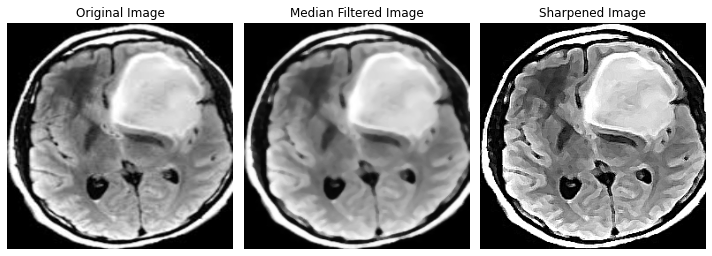

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('C:/Users/Admin/Desktop/neww/brain-tumor-master/data_cleaned/train/1.jpg')

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Normalize the pixel values to the range [0, 1]
normalized_image = gray_image.astype(np.float32) / 255.0

# Apply median filtering
median_filtered_image = cv2.medianBlur(normalized_image, 5)  # Adjust kernel size as needed

# Convert back to uint8
median_filtered_image_uint8 = (median_filtered_image * 255).astype(np.uint8)

# Perform image sharpening
kernel = np.array([[-1,-1,-1],
                   [-1, 9,-1],
                   [-1,-1,-1]])
sharpened_image = cv2.filter2D(median_filtered_image_uint8, -1, kernel)

# Plot the original, filtered, and sharpened images
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(median_filtered_image_uint8, cmap='gray')
plt.title('Median Filtered Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(sharpened_image, cmap='gray')
plt.title('Sharpened Image')
plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
image = cv2.imread('D:/Journal/brain tumor/archiv/y0.jpg')
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Reshape the grayscale image data
data = gray_image.reshape(-1, 1)

# Define parameters for IFCM clustering
c = 3  # Number of clusters
m = 2  # Fuzziness coefficient

# Perform IFCM clustering
cntr, u, _, _, _, _, _ = fuzz.cmeans(
    data.T, c, m, error=0.005, maxiter=1000, seed=0)

# Get the cluster membership probabilities
cluster_membership = np.argmax(u, axis=0)

# Reshape the clustered image back to its original shape
clustered_image = cluster_membership.reshape(gray_image.shape)

In [19]:
import os 
import sys
from tqdm import tqdm
import cv2
import numpy as np
import json
import skimage.draw
import matplotlib
import matplotlib.pyplot as plt
import random
from mrcnn.config import Config
from mrcnn import utils
from mrcnn.model import log
import mrcnn.model as modellib
from mrcnn import visualize
from pycocotools.coco import COCO

In [20]:
# Root directory of the project
ROOT_DIR = os.path.abspath('C:/Users/Admin/Desktop/neww/brain-tumor-master/data_cleaned/')
# Import Mask RCNN
sys.path.append(ROOT_DIR) 
ROOT_DIRS = "C:/Users/Admin/Desktop/neww/Mask_RCNN-master/"
sys.path.append(os.path.join(ROOT_DIRS, 'samples/coco/'))
plt.rcParams['figure.facecolor'] = 'white'


In [21]:
class TumorConfig(Config):
    """Configuration for training on the brain tumor dataset.
    """
    # Give the configuration a recognizable name
    NAME = 'tumor_detector'
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 1  # background + tumor
    DETECTION_MIN_CONFIDENCE = 0.85    
    STEPS_PER_EPOCH = 5
    LEARNING_RATE = 0.001
    
config = TumorConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.85
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INST

In [23]:
import scipy.ndimage as ndimage
import skimage.filters as filters

class BrainScanDataset(utils.Dataset):
    def load_brain_scan(self, dataset_dir, subset):
        """Load a subset of the brain tumor dataset.
        dataset_dir: Root directory of the dataset.
        subset: Subset to load: train or val
        """
        # Add classes. We have only one class to add.
        self.add_class("tumor", 1, "tumor")
        # Train or validation dataset?
        assert subset in ["train", "val", 'test']
        dataset_dir = os.path.join(dataset_dir, subset)
        annotations = json.load(open(os.path.join(ROOT_DIR, subset, 'annotations_'+subset+'.json')))
        annotations = list(annotations.values())  # don't need the dict keys
        # The VIA tool saves images in the JSON even if they don't have any
        # annotations. Skip unannotated images.
        annotations = [a for a in annotations if a['regions']]
        # Add images
        for a in annotations:
            if type(a['regions']) is dict:
                polygons = [r['shape_attributes'] for r in a['regions'].values()]
            else:
                polygons = [r['shape_attributes'] for r in a['regions']]
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)
            # Normalization
            image = image.astype(np.float32) / 255.0
            # Median filtering for noise reduction
            image = ndimage.median_filter(image, size=3)
            # Image sharpening
            image = filters.unsharp_mask(image, radius=1.0, amount=1.5)
            height, width = image.shape[:2]
            self.add_image(
                "tumor",
                image_id=a['filename'],  # use file name as a unique image id
                path=image_path,
                width=width, 
                height=height,
                polygons=polygons
            )
    def load_mask(self, image_id):
        """Generate instance masks for an image.
       Returns:
        masks: A bool array of shape [height, width, instance count] with
            one mask per instance.
        class_ids: a 1D array of class IDs of the instance masks.
        """
        # If not a farm_cow dataset image, delegate to parent class.
        image_info = self.image_info[image_id]
        if image_info["source"] != "tumor":
            return super(self.__class__, self).load_mask(image_id)# Convert polygons to a bitmap mask of shape
        # [height, width, instance_count]
        info = self.image_info[image_id]
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):
            # Get indexes of pixels inside the polygon and set them to 1
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            mask[rr, cc, i] = 1# Return mask, and array of class IDs of each instance. Since we have
        # one class ID only, we return an array of 1s
        return mask.astype(np.bool), np.ones([mask.shape[-1]], dtype=np.int32)
    def image_reference(self, image_id):
        """Return the path of the image."""
        info = self.image_info[image_id]
        if info["source"] == "tumor":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)

In [25]:
# model = modellib.MaskRCNN(mode="training", config=config, model_dir=ROOT_DIR)
MODEL_DIR = os.path.join(ROOT_DIRS, 'logs') # directory to save logs and trained model
DEFAULT_LOGS_DIR = 'logs' 

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIRS, "mask_rcnn_coco.h5")
# Load pre-trained weights (optional)
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

In [26]:

# Load your dataset
dataset_train = BrainScanDataset()
dataset_train.load_brain_scan(ROOT_DIR, "train")  # Adjust 'train' to your dataset's directory
dataset_train.prepare()

# Load validation dataset
dataset_val = BrainScanDataset()
dataset_val.load_brain_scan(ROOT_DIR, "val")  # Adjust 'valid' to your dataset's directory
dataset_val.prepare()

# Create configuration
config = TumorConfig()
model = modellib.MaskRCNN(
    mode='training', 
    config=config, 
    model_dir=DEFAULT_LOGS_DIR
)

model.load_weights(
    COCO_MODEL_PATH, 
    by_name=True, 
    exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"]
)
# Create model



C:\Users\Admin\Desktop\neww\brain-tumor-master\data_cleaned\train\32.jpg


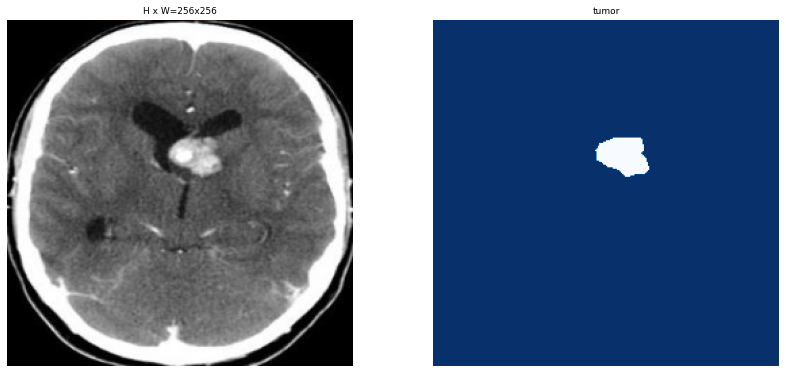

In [27]:
print(dataset_train.image_reference(16))
image = dataset_train.load_image(16)
mask, class_ids = dataset_train.load_mask(16)
visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names, limit=1)

In [28]:
print("Training network heads")
model.train(
    dataset_train, dataset_val,
    learning_rate=config.LEARNING_RATE,
    epochs=7,
    layers='heads'
)

Training network heads

Starting at epoch 0. LR=0.001

Checkpoint Path: logs\tumor_detector20240510T1234\mask_rcnn_tumor_detector_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistri

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Epoch 1/7


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/5 [=====>........................] - ETA: 3:29 - loss: 3.3915 - rpn_class_loss: 0.0130 - rpn_bbox_loss: 0.7062 - mrcnn_class_loss: 0.2243 - mrcnn_bbox_loss: 1.3471 - mrcnn_mask_loss: 1.1009

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2/5 [===========>..................] - ETA: 2:15 - loss: 3.3035 - rpn_class_loss: 0.0169 - rpn_bbox_loss: 0.6223 - mrcnn_class_loss: 0.1363 - mrcnn_bbox_loss: 1.1861 - mrcnn_mask_loss: 1.3419

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3/5 [=================>............] - ETA: 1:24 - loss: 2.6984 - rpn_class_loss: 0.0152 - rpn_bbox_loss: 0.4348 - mrcnn_class_loss: 0.0989 - mrcnn_bbox_loss: 0.8908 - mrcnn_mask_loss: 1.2587

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4/5 [=======================>......] - ETA: 41s - loss: 3.1904 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 1.1594 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.7675 - mrcnn_mask_loss: 1.1413 

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely 

5/5 [==============================] - 868s 174s/step - loss: 3.0883 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.0473 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.8161 - mrcnn_mask_loss: 1.0962 - val_loss: 4.0698 - val_rpn_class_loss: 0.0591 - val_rpn_bbox_loss: 2.9650 - val_mrcnn_class_loss: 0.0590 - val_mrcnn_bbox_loss: 0.4591 - val_mrcnn_mask_loss: 0.5276
Epoch 2/7


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/5 [=====>........................] - ETA: 2:51 - loss: 3.2332 - rpn_class_loss: 0.1219 - rpn_bbox_loss: 3.1040 - mrcnn_class_loss: 0.0072 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2/5 [===========>..................] - ETA: 2:06 - loss: 3.8564 - rpn_class_loss: 0.1100 - rpn_bbox_loss: 3.7399 - mrcnn_class_loss: 0.0064 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3/5 [=================>............] - ETA: 1:24 - loss: 3.6960 - rpn_class_loss: 0.0801 - rpn_bbox_loss: 3.0505 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.2689 - mrcnn_mask_loss: 0.2606        

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4/5 [=======================>......] - ETA: 42s - loss: 3.5649 - rpn_class_loss: 0.0665 - rpn_bbox_loss: 3.0735 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.2017 - mrcnn_mask_loss: 0.1955 

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely 

5/5 [==============================] - 906s 181s/step - loss: 3.3527 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.6526 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3151 - mrcnn_mask_loss: 0.3026 - val_loss: 2.8868 - val_rpn_class_loss: 0.0493 - val_rpn_bbox_loss: 1.5758 - val_mrcnn_class_loss: 0.1078 - val_mrcnn_bbox_loss: 0.5808 - val_mrcnn_mask_loss: 0.5731
Epoch 3/7


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/5 [=====>........................] - ETA: 2:34 - loss: 1.5104 - rpn_class_loss: 0.0010 - rpn_bbox_loss: 0.1138 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.6058 - mrcnn_mask_loss: 0.7080

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2/5 [===========>..................] - ETA: 1:58 - loss: 1.4226 - rpn_class_loss: 0.0139 - rpn_bbox_loss: 0.7101 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.3029 - mrcnn_mask_loss: 0.3540

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3/5 [=================>............] - ETA: 1:19 - loss: 1.6759 - rpn_class_loss: 0.0451 - rpn_bbox_loss: 0.5519 - mrcnn_class_loss: 0.1633 - mrcnn_bbox_loss: 0.4430 - mrcnn_mask_loss: 0.4726

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4/5 [=======================>......] - ETA: 39s - loss: 3.2851 - rpn_class_loss: 0.0997 - rpn_bbox_loss: 1.9454 - mrcnn_class_loss: 0.1538 - mrcnn_bbox_loss: 0.5923 - mrcnn_mask_loss: 0.4940 

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely 

5/5 [==============================] - 3913s 783s/step - loss: 3.6432 - rpn_class_loss: 0.0848 - rpn_bbox_loss: 2.3533 - mrcnn_class_loss: 0.1287 - mrcnn_bbox_loss: 0.5162 - mrcnn_mask_loss: 0.5601 - val_loss: 2.6470 - val_rpn_class_loss: 0.0355 - val_rpn_bbox_loss: 0.9655 - val_mrcnn_class_loss: 0.1671 - val_mrcnn_bbox_loss: 0.8241 - val_mrcnn_mask_loss: 0.6548
Epoch 4/7


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/5 [=====>........................] - ETA: 3:04 - loss: 1.6121 - rpn_class_loss: 4.3718e-04 - rpn_bbox_loss: 0.2691 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.8271 - mrcnn_mask_loss: 0.4884

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2/5 [===========>..................] - ETA: 2:20 - loss: 1.7236 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.1887 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.8581 - mrcnn_mask_loss: 0.5806    

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3/5 [=================>............] - ETA: 1:30 - loss: 2.9495 - rpn_class_loss: 0.0126 - rpn_bbox_loss: 1.3990 - mrcnn_class_loss: 0.0996 - mrcnn_bbox_loss: 0.8363 - mrcnn_mask_loss: 0.6020

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4/5 [=======================>......] - ETA: 44s - loss: 2.7263 - rpn_class_loss: 0.0155 - rpn_bbox_loss: 1.2239 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.7886 - mrcnn_mask_loss: 0.6048 

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely 

5/5 [==============================] - 878s 176s/step - loss: 2.4666 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 1.0022 - mrcnn_class_loss: 0.1178 - mrcnn_bbox_loss: 0.7332 - mrcnn_mask_loss: 0.5980 - val_loss: 2.3324 - val_rpn_class_loss: 0.0327 - val_rpn_bbox_loss: 0.8121 - val_mrcnn_class_loss: 0.1599 - val_mrcnn_bbox_loss: 0.7239 - val_mrcnn_mask_loss: 0.6037
Epoch 5/7


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/5 [=====>........................] - ETA: 3:30 - loss: 1.6988 - rpn_class_loss: 2.8518e-04 - rpn_bbox_loss: 0.1664 - mrcnn_class_loss: 0.1202 - mrcnn_bbox_loss: 0.8503 - mrcnn_mask_loss: 0.5616

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2/5 [===========>..................] - ETA: 2:34 - loss: 1.5668 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1770 - mrcnn_class_loss: 0.1630 - mrcnn_bbox_loss: 0.6776 - mrcnn_mask_loss: 0.5435    

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3/5 [=================>............] - ETA: 1:38 - loss: 1.5084 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.1894 - mrcnn_class_loss: 0.1324 - mrcnn_bbox_loss: 0.5854 - mrcnn_mask_loss: 0.5930

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4/5 [=======================>......] - ETA: 47s - loss: 1.4499 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.1494 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 0.6095 - mrcnn_mask_loss: 0.5705 

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely 

5/5 [==============================] - 1245s 249s/step - loss: 1.4712 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.2033 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.5942 - mrcnn_mask_loss: 0.5563 - val_loss: 2.3277 - val_rpn_class_loss: 0.0265 - val_rpn_bbox_loss: 0.7570 - val_mrcnn_class_loss: 0.1454 - val_mrcnn_bbox_loss: 0.8393 - val_mrcnn_mask_loss: 0.5595
Epoch 6/7


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/5 [=====>........................] - ETA: 4:02 - loss: 2.2219 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.3106 - mrcnn_class_loss: 0.2552 - mrcnn_bbox_loss: 0.9263 - mrcnn_mask_loss: 0.6691

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2/5 [===========>..................] - ETA: 3:02 - loss: 1.7356 - rpn_class_loss: 0.0328 - rpn_bbox_loss: 0.2891 - mrcnn_class_loss: 0.1656 - mrcnn_bbox_loss: 0.6260 - mrcnn_mask_loss: 0.6221

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3/5 [=================>............] - ETA: 2:03 - loss: 1.5440 - rpn_class_loss: 0.0243 - rpn_bbox_loss: 0.2516 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.5472 - mrcnn_mask_loss: 0.5834

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4/5 [=======================>......] - ETA: 1:02 - loss: 1.4416 - rpn_class_loss: 0.0190 - rpn_bbox_loss: 0.2040 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 0.5451 - mrcnn_mask_loss: 0.5615

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely 

5/5 [==============================] - 1512s 302s/step - loss: 1.4878 - rpn_class_loss: 0.0183 - rpn_bbox_loss: 0.2230 - mrcnn_class_loss: 0.1192 - mrcnn_bbox_loss: 0.5687 - mrcnn_mask_loss: 0.5587 - val_loss: 2.0538 - val_rpn_class_loss: 0.0304 - val_rpn_bbox_loss: 0.6165 - val_mrcnn_class_loss: 0.1197 - val_mrcnn_bbox_loss: 0.7348 - val_mrcnn_mask_loss: 0.5525
Epoch 7/7


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/5 [=====>........................] - ETA: 4:19 - loss: 2.2865 - rpn_class_loss: 7.5982e-04 - rpn_bbox_loss: 0.2145 - mrcnn_class_loss: 0.1188 - mrcnn_bbox_loss: 0.9720 - mrcnn_mask_loss: 0.9805

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2/5 [===========>..................] - ETA: 3:14 - loss: 1.8294 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1543 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.7941 - mrcnn_mask_loss: 0.7847    

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3/5 [=================>............] - ETA: 2:05 - loss: 1.6544 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2496 - mrcnn_class_loss: 0.0892 - mrcnn_bbox_loss: 0.6566 - mrcnn_mask_loss: 0.6550

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4/5 [=======================>......] - ETA: 1:03 - loss: 1.5947 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3018 - mrcnn_class_loss: 0.0775 - mrcnn_bbox_loss: 0.5865 - mrcnn_mask_loss: 0.6226

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely 

5/5 [==============================] - 1602s 320s/step - loss: 1.7332 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.4812 - mrcnn_class_loss: 0.0717 - mrcnn_bbox_loss: 0.5757 - mrcnn_mask_loss: 0.5953 - val_loss: 2.0197 - val_rpn_class_loss: 0.0245 - val_rpn_bbox_loss: 0.7066 - val_mrcnn_class_loss: 0.1064 - val_mrcnn_bbox_loss: 0.6810 - val_mrcnn_mask_loss: 0.5013


In [29]:
# Recreate the model in inference mode
model = modellib.MaskRCNN(
    mode="inference", 
    config=config,
    model_dir=DEFAULT_LOGS_DIR
)

# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")
model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

Instructions for updating:
Use `tf.cast` instead.


Instructions for updating:
Use `tf.cast` instead.


FileNotFoundError: [Errno 2] Could not find weight files in logs\tumor_detector20240510T1557

In [ ]:
def predict_and_plot_differences(dataset, img_id):
    original_image, image_meta, gt_class_id, gt_box, gt_mask =\
        modellib.load_image_gt(dataset, config, 
                               img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    visualize.display_differences(
        original_image,
        gt_box, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        class_names = ['tumor'], title="", ax=get_ax(),
        show_mask=True, show_box=True)
    

def display_image(dataset, ind):
    plt.figure(figsize=(5,5))
    plt.imshow(dataset.load_image(ind))
    plt.xticks([])
    plt.yticks([])
    plt.title('Original Image')
    plt.show()

#vALIDATION SET
ind = 9
display_image(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind)

ind = 6
display_image(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind)

#Test Set
ind = 1
display_image(dataset_test, ind)
predict_and_plot_differences(dataset_test, ind)
ind = 0
display_image(dataset_test, ind)
predict_and_plot_differences(dataset_test, ind)

In [46]:
import os 
import sys
import numpy as np
import json
import skimage.draw
import matplotlib.pyplot as plt
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib

# Root directory of the project
ROOT_DIR = os.path.abspath("C:/Users/Admin/Desktop/neww/Mask_RCNN-master/")
sys.path.append(ROOT_DIR) 

# Directory containing the dataset
DATASET_DIR = 'C:/Users/Admin/Desktop/neww/brain-tumor-master/data_cleaned/'

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, 'logs')

class TumorConfig(Config):
    """Configuration for training on the brain tumor dataset."""
    NAME = 'tumor_detector'
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 1  # background + tumor
    DETECTION_MIN_CONFIDENCE = 0.85    
    STEPS_PER_EPOCH = 2
    LEARNING_RATE = 0.001
    
config = TumorConfig()
config.display()

class BrainScanDataset(utils.Dataset):
    def load_brain_scan(self, dataset_dir, subset):
        # Add classes
        self.add_class("tumor", 1, "tumor")
        assert subset in ["train", "val", 'test']
        dataset_dir = os.path.join(dataset_dir, subset)
        annotations = json.load(open(os.path.join(DATASET_DIR, subset, 'annotations_'+subset+'.json')))
        annotations = list(annotations.values())
        annotations = [a for a in annotations if a['regions']]
        for a in annotations:
            if type(a['regions']) is dict:
                polygons = [r['shape_attributes'] for r in a['regions'].values()]
            else:
                polygons = [r['shape_attributes'] for r in a['regions']]
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)
            height, width = image.shape[:2]
            self.add_image(
                "tumor",
                image_id=a['filename'],
                path=image_path,
                width=width, 
                height=height,
                polygons=polygons
            )

    def load_mask(self, image_id):
        image_info = self.image_info[image_id]
        if image_info["source"] != "tumor":
            return super(self.__class__, self).load_mask(image_id)

        info = self.image_info[image_id]
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])], dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            mask[rr, cc, i] = 1

        return mask.astype(np.bool), np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        info = self.image_info[image_id]
        if info["source"] == "tumor":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)

# Initialize Mask R-CNN model for training
model = modellib.MaskRCNN(
    mode='training', 
    config=config, 
    model_dir=MODEL_DIR
)

# Load pre-trained weights
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

model.load_weights(
    COCO_MODEL_PATH, 
    by_name=True, 
    exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"]
)

# Training dataset
dataset_train = BrainScanDataset()
dataset_train.load_brain_scan(DATASET_DIR, 'train')
dataset_train.prepare()

# Validation dataset
dataset_val = BrainScanDataset()
dataset_val.load_brain_scan(DATASET_DIR, 'val')
dataset_val.prepare()
dataset_test = BrainScanDataset()
dataset_test.load_brain_scan(DATASET_DIR, 'test')
dataset_test.prepare()
# Train the model
print("Training network heads")
model.train(
    dataset_train, dataset_val,
    learning_rate=config.LEARNING_RATE,
    epochs=1,
    layers='heads'
)

# Now for inference mode
inference_config = TumorConfig()
inference_config.GPU_COUNT = 1
inference_config.IMAGES_PER_GPU = 1

model = modellib.MaskRCNN(
    mode="inference", 
    config=inference_config,
    model_dir=MODEL_DIR
)

# # Load trained weights
# model_path = "path_to_trained_weights_file.h5"  # Specify the path to your trained weights file
# model.load_weights(model_path, by_name=True)



Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.85
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INST

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Epoch 1/1


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/2 [==============>...............] - ETA: 46s - loss: 3.6805 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.6313 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.7209 - mrcnn_mask_loss: 2.2756

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely 

2/2 [==============================] - 757s 379s/step - loss: 8.3893 - rpn_class_loss: 0.1765 - rpn_bbox_loss: 5.3699 - mrcnn_class_loss: 0.0780 - mrcnn_bbox_loss: 0.7434 - mrcnn_mask_loss: 2.0215 - val_loss: 4.8095 - val_rpn_class_loss: 0.0621 - val_rpn_bbox_loss: 2.9940 - val_mrcnn_class_loss: 0.0476 - val_mrcnn_bbox_loss: 0.7410 - val_mrcnn_mask_loss: 0.9648


OSError: Unable to open file (unable to open file: name = 'path_to_trained_weights_file.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [48]:
# Load trained weights
model_path = "C:/Users/Admin/Desktop/neww/Mask_RCNN-master/mask_rcnn_coco.h5"  # Replace this with the actual path to your trained weights file
model.load_weights(model_path, by_name=True)


ValueError: Layer #389 (named "mrcnn_bbox_fc"), weight <tf.Variable 'mrcnn_bbox_fc_7/kernel:0' shape=(1024, 8) dtype=float32_ref> has shape (1024, 8), but the saved weight has shape (1024, 324).

Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


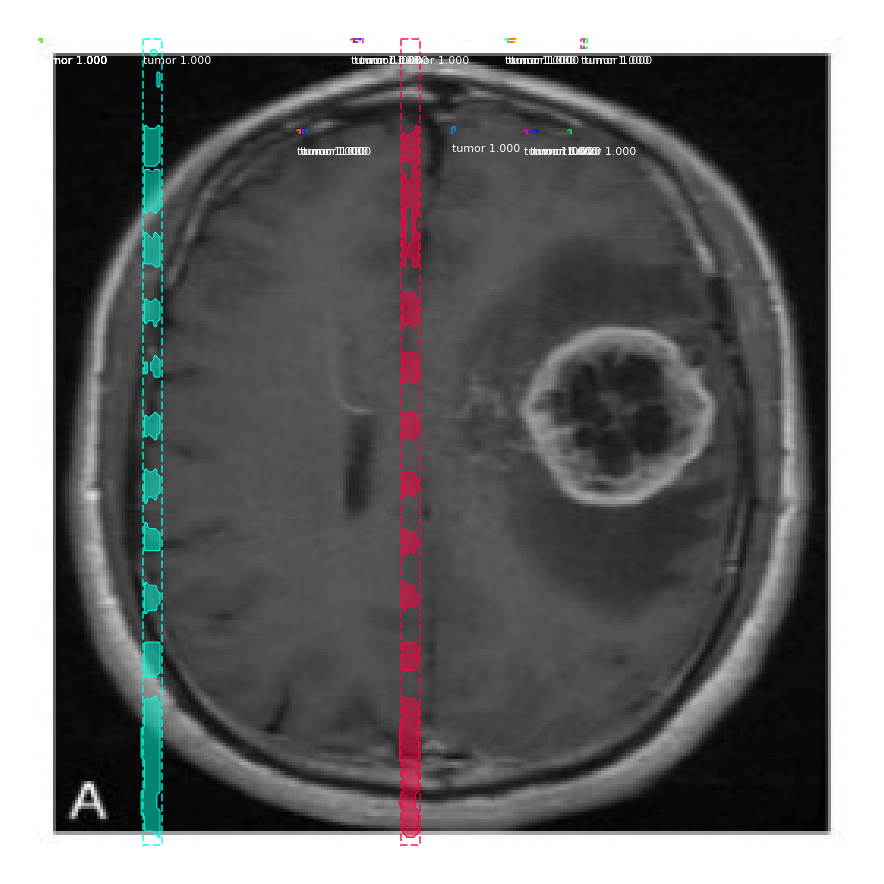

In [50]:
# Load a test image
test_image_path = "C:/Users/Admin/Desktop/neww/brain-tumor-master/data_cleaned/test/217.jpg"  # Specify the path to your test image
test_image = skimage.io.imread(test_image_path)

# Run tumor detection on the test image
results = model.detect([test_image], verbose=1)
r = results[0]

# Visualize the detection results
visualize.display_instances(
    test_image, 
    r['rois'], 
    r['masks'], 
    r['class_ids'], 
    ['BG', 'tumor'],  # Class names
    r['scores']
)

plt.show()


original

In [ ]:
import os
import sys
import skimage.io
import numpy as np
import json
import skimage.draw
import matplotlib.pyplot as plt
import ssl
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib

# Root directory of the project
ROOT_DIR = os.path.abspath("D:/Mask_RCNN-master/")
sys.path.append(ROOT_DIR)

# Create directory for logs and trained weights if it doesn't exist
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

ssl._create_default_https_context = ssl._create_unverified_context
sys.path.append(os.path.join(ROOT_DIR, 'samples/coco/'))
plt.rcParams['figure.facecolor'] = 'white'


def get_ax(rows=1, cols=1, size=7):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.

    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax


# Import Mask RCNN COCO trained weights
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

DATASET_DIR = "D:/Mask_RCNN-master/Br35H-Mask-RCNN/"

# Configuration for training on the brain tumor dataset
class TumorConfig(Config):
    NAME = 'tumor_detector'
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 1  # background + tumor
    DETECTION_MIN_CONFIDENCE = 0.85    
    STEPS_PER_EPOCH = 1
    LEARNING_RATE = 0.001
    
config = TumorConfig()

# Load the COCO pretrained weights
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

import scipy.ndimage as ndimage
import skimage.filters as filters


class BrainScanDataset(utils.Dataset):
    def load_brain_scan(self, dataset_dir, subset):
        """Load a subset of the brain tumor dataset.
        dataset_dir: Root directory of the dataset.
        subset: Subset to load: train or val
        """
        # Add classes. We have only one class to add.
        self.add_class("tumor", 1, "tumor")
        # Train or validation dataset?
        assert subset in ["TRAIN", "VAL", "TEST"]
        dataset_dir = os.path.join(dataset_dir, subset)
        annotations = json.load(open(os.path.join(DATASET_DIR, subset, 'annotations_'+subset+'.json')))
        annotations = list(annotations.values())  # don't need the dict keys
        # The VIA tool saves images in the JSON even if they don't have any
        # annotations. Skip unannotated images.
        annotations = [a for a in annotations if a['regions']]
        # Add images
        for a in annotations:
            if type(a['regions']) is dict:
                polygons = [r['shape_attributes'] for r in a['regions'].values()]
            else:
                polygons = [r['shape_attributes'] for r in a['regions']]
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)
            # Normalization
            image = image.astype(np.float32) / 255.0
            # Median filtering for noise reduction
            image = ndimage.median_filter(image, size=3)
            # Image sharpening
            image = filters.unsharp_mask(image, radius=1.0, amount=1.5)
            image = 
            height, width = image.shape[:2]
            self.add_image(
                "tumor",
                image_id=a['filename'],  # use file name as a unique image id
                path=image_path,
                width=width, 
                height=height,
                polygons=polygons
            )

    def load_mask(self, image_id):
        """Generate instance masks for an image.
       Returns:
        masks: A bool array of shape [height, width, instance count] with
            one mask per instance.
        class_ids: a 1D array of class IDs of the instance masks.
        """
        # If not a tumor dataset image, delegate to parent class.
        image_info = self.image_info[image_id]
        if image_info["source"] != "tumor":
            return super(self.__class__, self).load_mask(image_id)

        # Convert polygons to a bitmap mask of shape
        # [height, width, instance_count]
        info = self.image_info[image_id]
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):
            print("Polygon:", p)  # Add this line to inspect the contents of p
            if 'all_points_y' not in p or 'all_points_x' not in p:
                print("Invalid polygon format:", p)
                continue
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            mask[rr, cc, i] = 1

        # Return mask and array of class IDs of each instance
        return mask.astype(np.bool), np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        """Return the path of the image."""
        info = self.image_info[image_id]
        if info["source"] == "tumor":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)


# Training dataset
dataset_train = BrainScanDataset()
dataset_train.load_brain_scan(DATASET_DIR, 'TRAIN')
dataset_train.prepare()

# Validation dataset
dataset_val = BrainScanDataset()
dataset_val.load_brain_scan(DATASET_DIR, 'VAL')
dataset_val.prepare()

# Create the MaskRCNN model in training mode
model = modellib.MaskRCNN(
    mode='training', 
    config=config, 
    model_dir=MODEL_DIR
)

# Load the COCO pretrained weights
model.load_weights(
    COCO_MODEL_PATH, 
    by_name=True, 
    exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"]
)

# Train the model
print("Training network heads")
model.train(
    dataset_train, 
    dataset_val,
    learning_rate=config.LEARNING_RATE,
    epochs=1,
    layers='heads'
)

# Create inference configuration
class InferenceConfig(TumorConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(
    mode="inference", 
    config=inference_config,
    model_dir=MODEL_DIR
)

# Find last trained weights
model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)



def predict_and_plot_differences(dataset, img_id):
    original_image, image_meta, gt_class_id, gt_box, gt_mask =\
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    visualize.display_differences(
        original_image,
        gt_box, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        class_names=['tumor'], title="", ax=get_ax(),
        show_mask=True, show_box=True)
    

def display_image(dataset, ind):
    plt.figure(figsize=(5,5))
    plt.imshow(dataset.load_image(ind))
    plt.xticks([])
    plt.yticks([])
    plt.title('Original Image')
    plt.show()

# Validation Set
ind =11
display_image(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind)

Original code

In [ ]:
import os
import sys
import skimage.io
import numpy as np
import json
import skimage.draw
import matplotlib.pyplot as plt
import ssl
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib

# Root directory of the project
ROOT_DIR = os.path.abspath("D:/Mask_RCNN-master/")
sys.path.append(ROOT_DIR)

# Create directory for logs and trained weights if it doesn't exist
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

ssl._create_default_https_context = ssl._create_unverified_context
sys.path.append(os.path.join(ROOT_DIR, 'samples/coco/'))
plt.rcParams['figure.facecolor'] = 'white'


def get_ax(rows=1, cols=1, size=7):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.

    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax


# Import Mask RCNN COCO trained weights
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

DATASET_DIR = "D:/Mask_RCNN-master/Br35H-Mask-RCNN/"

# Configuration for training on the brain tumor dataset
class TumorConfig(Config):
    NAME = 'tumor_detector'
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 1  # background + tumor
    DETECTION_MIN_CONFIDENCE = 0.85    
    STEPS_PER_EPOCH = 5
    LEARNING_RATE = 0.001
    
config = TumorConfig()

# Load the COCO pretrained weights
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

import scipy.ndimage as ndimage
import skimage.filters as filters


class BrainScanDataset(utils.Dataset):
    def load_brain_scan(self, dataset_dir, subset):
        """Load a subset of the brain tumor dataset.
        dataset_dir: Root directory of the dataset.
        subset: Subset to load: train or val
        """
        # Add classes. We have only one class to add.
        self.add_class("tumor", 1, "tumor")
        # Train or validation dataset?
        assert subset in ["TRAIN", "VAL", "TEST"]
        dataset_dir = os.path.join(dataset_dir, subset)
        annotations = json.load(open(os.path.join(DATASET_DIR, subset, 'annotations_'+subset+'.json')))
        annotations = list(annotations.values())  # don't need the dict keys
        # The VIA tool saves images in the JSON even if they don't have any
        # annotations. Skip unannotated images.
        annotations = [a for a in annotations if a['regions']]
        # Add images
        for a in annotations:
            if type(a['regions']) is dict:
                polygons = [r['shape_attributes'] for r in a['regions'].values()]
            else:
                polygons = [r['shape_attributes'] for r in a['regions']]
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)
            # Normalization
            image = image.astype(np.float32) / 255.0
            # Median filtering for noise reduction
            image = ndimage.median_filter(image, size=3)
            # Image sharpening
            image = filters.unsharp_mask(image, radius=1.0, amount=1.5)
            height, width = image.shape[:2]
            self.add_image(
                "tumor",
                image_id=a['filename'],  # use file name as a unique image id
                path=image_path,
                width=width, 
                height=height,
                polygons=polygons
            )

    def load_mask(self, image_id):
        """Generate instance masks for an image.
       Returns:
        masks: A bool array of shape [height, width, instance count] with
            one mask per instance.
        class_ids: a 1D array of class IDs of the instance masks.
        """
        # If not a tumor dataset image, delegate to parent class.
        image_info = self.image_info[image_id]
        if image_info["source"] != "tumor":
            return super(self.__class__, self).load_mask(image_id)

        # Convert polygons to a bitmap mask of shape
        # [height, width, instance_count]
        info = self.image_info[image_id]
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):
            print("Polygon:", p)  # Add this line to inspect the contents of p
            if 'all_points_y' not in p or 'all_points_x' not in p:
                print("Invalid polygon format:", p)
                continue
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            mask[rr, cc, i] = 1

        # Return mask and array of class IDs of each instance
        return mask.astype(np.bool), np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        """Return the path of the image."""
        info = self.image_info[image_id]
        if info["source"] == "tumor":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)


# Training dataset
dataset_train = BrainScanDataset()
dataset_train.load_brain_scan(DATASET_DIR, 'TRAIN')
dataset_train.prepare()

# Validation dataset
dataset_val = BrainScanDataset()
dataset_val.load_brain_scan(DATASET_DIR, 'VAL')
dataset_val.prepare()

# Create the MaskRCNN model in training mode
model = modellib.MaskRCNN(
    mode='training', 
    config=config, 
    model_dir=MODEL_DIR
)

# Load the COCO pretrained weights
model.load_weights(
    COCO_MODEL_PATH, 
    by_name=True, 
    exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"]
)

# Train the model
print("Training network heads")
model.train(
    dataset_train, 
    dataset_val,
    learning_rate=config.LEARNING_RATE,
    epochs=1,
    layers='heads'
)

# Create inference configuration
class InferenceConfig(TumorConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(
    mode="inference", 
    config=inference_config,
    model_dir=MODEL_DIR
)

# Find last trained weights
model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)


In [1]:
import os
import sys
import skimage.io
import numpy as np
import json
import skimage.draw
import matplotlib.pyplot as plt
import ssl
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib

# Root directory of the project
ROOT_DIR = os.path.abspath("D:/Mask_RCNN-master/")
sys.path.append(ROOT_DIR)

# Create directory for logs and trained weights if it doesn't exist
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

ssl._create_default_https_context = ssl._create_unverified_context
sys.path.append(os.path.join(ROOT_DIR, 'samples/coco/'))
plt.rcParams['figure.facecolor'] = 'white'


def get_ax(rows=1, cols=1, size=7):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.

    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax


# Import Mask RCNN COCO trained weights
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

DATASET_DIR = "D:/Mask_RCNN-master/Br35H-Mask-RCNN/"

# Configuration for training on the brain tumor dataset
class TumorConfig(Config):
    NAME = 'tumor_detector'
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 1  # background + tumor
    DETECTION_MIN_CONFIDENCE = 0.85    
    STEPS_PER_EPOCH = 5
    LEARNING_RATE = 0.001
    
config = TumorConfig()

# Load the COCO pretrained weights
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

import scipy.ndimage as ndimage
import skimage.filters as filters


class BrainScanDataset(utils.Dataset):
    def load_brain_scan(self, dataset_dir, subset):
        """Load a subset of the brain tumor dataset.
        dataset_dir: Root directory of the dataset.
        subset: Subset to load: train or val
        """
        # Add classes. We have only one class to add.
        self.add_class("tumor", 1, "tumor")
        # Train or validation dataset?
        assert subset in ["TRAIN", "VAL", "TEST"]
        dataset_dir = os.path.join(dataset_dir, subset)
        annotations = json.load(open(os.path.join(DATASET_DIR, subset, 'annotations_'+subset+'.json')))
        annotations = list(annotations.values())  # don't need the dict keys
        # The VIA tool saves images in the JSON even if they don't have any
        # annotations. Skip unannotated images.
        annotations = [a for a in annotations if a['regions']]
        # Add images
        for a in annotations:
            if type(a['regions']) is dict:
                polygons = [r['shape_attributes'] for r in a['regions'].values()]
            else:
                polygons = [r['shape_attributes'] for r in a['regions']]
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)
            # Normalization
            image = image.astype(np.float32) / 255.0
            # Median filtering for noise reduction
            image = ndimage.median_filter(image, size=5)
            # Image sharpening
            image = filters.unsharp_mask(image, radius=10, amount=20)
            height, width = image.shape[:2]
            self.add_image(
                "tumor",
                image_id=a['filename'],  # use file name as a unique image id
                path=image_path,
                width=width, 
                height=height,
                polygons=polygons
            )

    def load_mask(self, image_id):
        """Generate instance masks for an image.
       Returns:
        masks: A bool array of shape [height, width, instance count] with
            one mask per instance.
        class_ids: a 1D array of class IDs of the instance masks.
        """
        # If not a tumor dataset image, delegate to parent class.
        image_info = self.image_info[image_id]
        if image_info["source"] != "tumor":
            return super(self.__class__, self).load_mask(image_id)

        # Convert polygons to a bitmap mask of shape
        # [height, width, instance_count]
        info = self.image_info[image_id]
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):
            print("Polygon:", p)  # Add this line to inspect the contents of p
            if 'all_points_y' not in p or 'all_points_x' not in p:
                print("Invalid polygon format:", p)
                continue
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            mask[rr, cc, i] = 1

        # Return mask and array of class IDs of each instance
        return mask.astype(np.bool), np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        """Return the path of the image."""
        info = self.image_info[image_id]
        if info["source"] == "tumor":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)


# Training dataset
dataset_train = BrainScanDataset()
dataset_train.load_brain_scan(DATASET_DIR, 'TRAIN')
dataset_train.prepare()

# Validation dataset
dataset_val = BrainScanDataset()
dataset_val.load_brain_scan(DATASET_DIR, 'VAL')
dataset_val.prepare()

dataset_test = BrainScanDataset()
dataset_test.load_brain_scan(DATASET_DIR, 'TEST')
dataset_test.prepare()
# Create the MaskRCNN model in training mode
model = modellib.MaskRCNN(
    mode='training', 
    config=config, 
    model_dir=MODEL_DIR
)

# Load the COCO pretrained weights
model.load_weights(
    COCO_MODEL_PATH, 
    by_name=True, 
    exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"]
)

# Train the model
print("Training network heads")
model.train(
    dataset_train, 
    dataset_val,
    learning_rate=config.LEARNING_RATE,
    epochs=1,
    layers='heads'
)

# Create inference configuration
class InferenceConfig(TumorConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(
    mode="inference", 
    config=inference_config,
    model_dir=MODEL_DIR
)

# Find last trained weights
model_path = model.find_last()

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)


Using TensorFlow backend.








Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Instructions for updating:
box_ind is deprecated, use box_indices instead






Training network heads

Starting at epoch 0. LR=0.001

Checkpoint Path: D:\Mask_RCNN-master\logs\tumor_detector20240517T1909\mask_rcnn_tumor_detector_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistribut

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "






Epoch 1/1
Polygon: {'name': 'polygon', 'all_points_x': [215, 247, 311, 355, 404, 443, 464, 466, 453, 421, 365, 292, 258, 230, 196, 178, 189, 195], 'all_points_y': [533, 546, 531, 530, 576, 632, 698, 778, 846, 906, 936, 958, 949, 887, 827, 763, 675, 601]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/5 [=====>........................] - ETA: 3:26 - loss: 3.5534 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.3217 - mrcnn_class_loss: 1.0590 - mrcnn_bbox_loss: 1.2289 - mrcnn_mask_loss: 0.9415Polygon: {'name': 'polygon', 'all_points_x': [159, 147, 133, 123, 121, 119, 119, 124, 133, 146, 153, 164, 169, 175, 172], 'all_points_y': [115, 109, 109, 125, 139, 151, 165, 183, 191, 187, 173, 163, 157, 143, 125]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2/5 [===========>..................] - ETA: 2:10 - loss: 3.1621 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.3859 - mrcnn_class_loss: 0.7790 - mrcnn_bbox_loss: 0.9895 - mrcnn_mask_loss: 1.0058Polygon: {'name': 'polygon', 'all_points_x': [113, 136, 150, 165, 165, 173, 163, 154, 140, 117, 93, 67, 41, 50, 58, 65, 75, 89, 99], 'all_points_y': [41, 53, 73, 96, 119, 137, 159, 179, 194, 203, 209, 189, 174, 142, 118, 101, 77, 59, 45]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3/5 [=================>............] - ETA: 1:28 - loss: 3.5821 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.7403 - mrcnn_class_loss: 0.5611 - mrcnn_bbox_loss: 1.2435 - mrcnn_mask_loss: 1.0358Polygon: {'name': 'polygon', 'all_points_x': [192, 173, 160, 156, 164, 170, 176, 187], 'all_points_y': [193, 192, 197, 208, 217, 223, 225, 206]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4/5 [=======================>......] - ETA: 46s - loss: 4.0792 - rpn_class_loss: 0.0260 - rpn_bbox_loss: 1.9199 - mrcnn_class_loss: 0.4237 - mrcnn_bbox_loss: 0.9326 - mrcnn_mask_loss: 0.7769 Polygon: {'name': 'polygon', 'all_points_x': [114, 103, 102, 102, 102, 109, 131, 153, 166, 182, 190, 181, 169, 153, 136], 'all_points_y': [28, 40, 57, 75, 90, 123, 123, 125, 128, 106, 97, 73, 57, 41, 31]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 329, 'cy': 332, 'rx': 58.009, 'ry': 79, 'theta': 3.124}
Invalid polygon format: {'name': 'ellipse', 'cx': 329, 'cy': 332, 'rx': 58.009, 'ry': 79, 'theta': 3.124}
Polygon: {'name': 'ellipse', 'cx': 183, 'cy': 138, 'rx': 19, 'ry': 15, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 183, 'cy': 138, 'rx': 19, 'ry': 15, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 207, 'cy': 117, 'rx': 13, 'ry': 14, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 207, 'cy': 117, 'rx': 13, 'ry': 14, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 367, 'cy': 632, 'rx': 47, 'ry': 47, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 367, 'cy': 632, 'rx': 47, 'ry': 47, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [821, 774, 730, 712, 757, 810, 866, 910, 979, 990, 957, 990, 995, 959, 915, 861], 'all_points_y': [303, 298, 332, 412, 485, 523, 547, 534, 467, 423, 409, 372, 316, 267, 251, 256]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [34, 49, 71, 89, 103, 130, 136, 116, 97, 85, 63, 50, 37], 'all_points_y': [140, 158, 171, 174, 166, 122, 106, 68, 49, 42, 63, 94, 123]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [210, 191, 172, 163, 174, 178, 176, 184, 235, 251, 251, 242, 233, 224], 'all_points_y': [197, 217, 221, 228, 242, 250, 280, 298, 304, 295, 247, 224, 210, 209]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 348, 'cy': 244, 'rx': 35, 'ry': 37.054, 'theta': -0.054}
Invalid polygon format: {'name': 'ellipse', 'cx': 348, 'cy': 244, 'rx': 35, 'ry': 37.054, 'theta': -0.054}
Polygon: {'name': 'polygon', 'all_points_x': [240, 214, 192, 189, 143, 106, 120, 119, 146, 179, 201, 217, 230], 'all_points_y': [178, 185, 194, 206, 197, 141, 121, 91, 56, 69, 68, 103, 136]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 217, 'cy': 302, 'rx': 51.624, 'ry': 69, 'theta': 0.772}
Invalid polygon format: {'name': 'ellipse', 'cx': 217, 'cy': 302, 'rx': 51.624, 'ry': 69, 'theta': 0.772}
Polygon: {'name': 'ellipse', 'cx': 310, 'cy': 302, 'rx': 52.498, 'ry': 73, 'theta': 2.437}
Invalid polygon format: {'name': 'ellipse', 'cx': 310, 'cy': 302, 'rx': 52.498, 'ry': 73, 'theta': 2.437}
Polygon: {'name': 'polygon', 'all_points_x': [211, 233, 251, 249, 252, 226, 184, 176, 178, 164, 161, 176, 186, 198], 'all_points_y': [199, 207, 241, 275, 294, 305, 297, 266, 244, 233, 221, 219, 223, 203]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 398, 'cy': 698, 'rx': 35.095, 'ry': 45.354, 'theta': -0.363}
Invalid polygon format: {'name': 'ellipse', 'cx': 398, 'cy': 698, 'rx': 35.095, 'ry': 45.354, 'theta': -0.363}
Polygon: {'name': 'ellipse', 'cx': 126, 'cy': 170, 'rx': 8, 'ry': 10.088, 'theta': -3.009}
Invalid polygon format: {'name': 'ellipse', 'cx': 126, 'cy': 170, 'rx': 8, 'ry': 10.088, 'theta': -3.009}
Polygon: {'name': 'ellipse', 'cx': 167, 'cy': 205, 'rx': 25.386, 'ry': 22, 'theta': -0.239}
Invalid polygon format: {'name': 'ellipse', 'cx': 167, 'cy': 205, 'rx': 25.386, 'ry': 22, 'theta': -0.239}
Polygon: {'name': 'ellipse', 'cx': 126, 'cy': 110, 'rx': 33.333, 'ry': 33.333, 'theta': 3.142}
Invalid polygon format: {'name': 'ellipse', 'cx': 126, 'cy': 110, 'rx': 33.333, 'ry': 33.333, 'theta': 3.142}
Polygon: {'name': 'polygon', 'all_points_x': [111, 123, 119, 114, 83, 64, 53, 39, 37, 58, 85], 'all_points_y': [172, 198, 228, 265, 282, 273, 261, 236, 205, 179, 174]}
Polygon: {'name': 'polyg

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 74, 'cy': 226, 'rx': 38, 'ry': 50.636, 'theta': -2.983}
Invalid polygon format: {'name': 'ellipse', 'cx': 74, 'cy': 226, 'rx': 38, 'ry': 50.636, 'theta': -2.983}
Polygon: {'name': 'ellipse', 'cx': 211, 'cy': 195, 'rx': 28, 'ry': 29, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 211, 'cy': 195, 'rx': 28, 'ry': 29, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 67, 'cy': 131, 'rx': 32.028, 'ry': 41.333, 'theta': 3.1}
Invalid polygon format: {'name': 'ellipse', 'cx': 67, 'cy': 131, 'rx': 32.028, 'ry': 41.333, 'theta': 3.1}
Polygon: {'name': 'polygon', 'all_points_x': [108, 83, 71, 74, 86, 107, 120, 108, 100, 103, 114], 'all_points_y': [208, 206, 220, 256, 287, 292, 286, 258, 252, 230, 221]}
Polygon: {'name': 'ellipse', 'cx': 130, 'cy': 199, 'rx': 18, 'ry': 19, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 130, 'cy': 199, 'rx': 18, 'ry': 19, 'theta': 0}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 600, 'cy': 700, 'rx': 95.939, 'ry': 104.795, 'theta': -2.532}
Invalid polygon format: {'name': 'ellipse', 'cx': 600, 'cy': 700, 'rx': 95.939, 'ry': 104.795, 'theta': -2.532}
Polygon: {'name': 'ellipse', 'cx': 163, 'cy': 81, 'rx': 10, 'ry': 8, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 163, 'cy': 81, 'rx': 10, 'ry': 8, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [323, 271, 248, 260, 267, 261, 273, 280, 296, 327, 347, 315], 'all_points_y': [264, 244, 261, 303, 312, 380, 389, 363, 347, 301, 288, 275]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [285, 261, 264, 244, 223, 196, 167, 159, 169, 165, 185, 217, 219, 235, 245, 276, 279, 311, 359, 371, 360, 317, 301], 'all_points_y': [121, 136, 157, 164, 199, 180, 192, 216, 232, 280, 301, 305, 288, 293, 317, 312, 276, 248, 240, 228, 176, 167, 127]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [252, 201, 164, 138, 125, 128, 131, 157, 181, 200, 225, 241], 'all_points_y': [174, 208, 202, 182, 140, 111, 86, 54, 44, 53, 90, 132]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [249, 227, 216, 211, 192, 159, 151, 165, 163, 142, 135, 139, 169, 195, 196, 203, 205, 224, 227, 235, 245], 'all_points_y': [172, 189, 202, 230, 253, 232, 207, 195, 177, 154, 144, 121, 98, 102, 131, 133, 118, 115, 127, 129, 148]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 338, 'cy': 295, 'rx': 37, 'ry': 24.083, 'theta': -0.083}
Invalid polygon format: {'name': 'ellipse', 'cx': 338, 'cy': 295, 'rx': 37, 'ry': 24.083, 'theta': -0.083}
Polygon: {'name': 'ellipse', 'cx': 95, 'cy': 59, 'rx': 22, 'ry': 23, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 95, 'cy': 59, 'rx': 22, 'ry': 23, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [89, 66, 57, 65, 52, 47, 59, 75, 79, 100, 124, 134, 121, 124, 110], 'all_points_y': [27, 38, 54, 66, 75, 88, 99, 102, 112, 103, 96, 78, 72, 57, 42]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [91, 99, 97, 103, 102, 96, 89, 78, 67, 57, 47, 50, 68], 'all_points_y': [26, 32, 48, 60, 78, 83, 95, 97, 94, 80, 56, 41, 31]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 178, 'cy': 227, 'rx': 27, 'ry': 24.021, 'theta': 0.042}
Invalid polygon format: {'name': 'ellipse', 'cx': 178, 'cy': 227, 'rx': 27, 'ry': 24.021, 'theta': 0.042}
Polygon: {'name': 'polygon', 'all_points_x': [69, 100, 128, 129, 96, 57, 69], 'all_points_y': [137, 137, 159, 200, 203, 187, 156]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [89, 95, 94, 83, 71, 70, 53, 60, 73, 77, 67, 69, 78], 'all_points_y': [88, 103, 132, 165, 163, 148, 137, 127, 126, 121, 115, 99, 89]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [259, 233, 194, 216, 205, 146, 159, 151, 159, 164, 175, 191, 220, 244], 'all_points_y': [112, 127, 129, 158, 161, 101, 88, 66, 43, 42, 56, 27, 48, 74]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [253, 215, 195, 195, 171, 169, 156, 152, 129, 113, 119, 111, 133, 165, 169, 167, 183, 184, 199, 213, 219, 248, 257], 'all_points_y': [168, 172, 193, 215, 224, 211, 201, 212, 211, 192, 164, 145, 124, 143, 133, 115, 113, 93, 83, 96, 117, 120, 144]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [454, 406, 320, 277, 283, 282, 316, 372, 452, 518, 562, 544, 500], 'all_points_y': [306, 254, 267, 316, 378, 433, 497, 543, 536, 484, 409, 340, 295]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 209, 'cy': 234, 'rx': 23.419, 'ry': 30, 'theta': -0.086}
Invalid polygon format: {'name': 'ellipse', 'cx': 209, 'cy': 234, 'rx': 23.419, 'ry': 30, 'theta': -0.086}
Polygon: {'name': 'polygon', 'all_points_x': [224, 193, 182, 166, 151, 135, 130, 102, 93, 100, 141, 158, 158, 179, 186, 198, 201, 220, 238, 235, 241, 235], 'all_points_y': [123, 142, 114, 90, 84, 109, 118, 122, 161, 172, 175, 194, 217, 225, 207, 203, 214, 213, 197, 163, 146, 132]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 205, 'cy': 91, 'rx': 25, 'ry': 30, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 205, 'cy': 91, 'rx': 25, 'ry': 30, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [182, 163, 139, 132, 139, 150, 165, 174, 191, 193, 181, 179], 'all_points_y': [75, 67, 83, 111, 123, 125, 143, 142, 129, 119, 103, 87]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 113, 'cy': 119, 'rx': 41, 'ry': 53, 'theta': 3.142}
Invalid polygon format: {'name': 'ellipse', 'cx': 113, 'cy': 119, 'rx': 41, 'ry': 53, 'theta': 3.142}
Polygon: {'name': 'polygon', 'all_points_x': [202, 184, 177, 159, 149, 140, 144, 151, 172, 174, 197, 217, 216, 216, 211], 'all_points_y': [112, 116, 120, 120, 142, 159, 191, 217, 234, 225, 230, 206, 173, 156, 133]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [100, 83, 54, 35, 31, 38, 53, 69, 92, 100, 92, 92, 98], 'all_points_y': [95, 86, 87, 115, 130, 151, 169, 179, 171, 157, 148, 132, 128]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [196, 177, 168, 181, 217, 237, 233, 216], 'all_points_y': [131, 153, 200, 220, 225, 193, 149, 149]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [195, 172, 152, 161, 170, 195, 203, 210, 210, 209, 200], 'all_points_y': [158, 158, 169, 197, 215, 217, 231, 205, 178, 158, 167]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [115, 139, 154, 165, 165, 170, 163, 149, 131, 91, 92, 63, 41, 49, 61, 66, 77, 91, 97], 'all_points_y': [39, 56, 78, 98, 119, 139, 165, 188, 201, 208, 197, 187, 174, 145, 112, 92, 73, 58, 48]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [11, 35, 46, 45, 34, 29, 20, 9, 11], 'all_points_y': [135, 141, 150, 164, 189, 196, 192, 160, 147]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [143, 163, 171, 176, 145, 129, 132, 119, 117, 127], 'all_points_y': [34, 61, 65, 87, 116, 115, 105, 97, 59, 34]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 202, 'cy': 180, 'rx': 35, 'ry': 45, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 202, 'cy': 180, 'rx': 35, 'ry': 45, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [172, 146, 125, 107, 77, 85, 108, 136, 164, 183, 188], 'all_points_y': [87, 94, 81, 87, 130, 149, 167, 167, 164, 148, 128]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 369, 'cy': 634, 'rx': 44.503, 'ry': 42.277, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 369, 'cy': 634, 'rx': 44.503, 'ry': 42.277, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [999, 930, 854, 828, 770, 732, 712, 761, 826, 881, 952, 990, 970, 995, 1004], 'all_points_y': [289, 254, 256, 303, 300, 332, 412, 485, 534, 547, 501, 427, 409, 360, 327]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 216, 'cy': 301, 'rx': 53.038, 'ry': 70, 'theta': 0.772}
Invalid polygon format: {'name': 'ellipse', 'cx': 216, 'cy': 301, 'rx': 53.038, 'ry': 70, 'theta': 0.772}
Polygon: {'name': 'polygon', 'all_points_x': [134, 136, 116, 109, 91, 82, 70, 93, 118], 'all_points_y': [19, 64, 72, 88, 88, 59, 37, 16, 14]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 396, 'cy': 695, 'rx': 36.557, 'ry': 45.331, 'theta': 3.142}
Invalid polygon format: {'name': 'ellipse', 'cx': 396, 'cy': 695, 'rx': 36.557, 'ry': 45.331, 'theta': 3.142}
Polygon: {'name': 'polygon', 'all_points_x': [161, 143, 76, 72, 87, 71, 158, 165, 156], 'all_points_y': [180, 163, 160, 174, 194, 221, 224, 213, 203]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [360, 369, 358, 306, 277, 279, 245, 240, 220, 216, 192, 162, 164, 169, 159, 185, 219, 237, 239, 258, 262, 289, 306, 316], 'all_points_y': [178, 232, 244, 249, 277, 310, 319, 294, 288, 302, 306, 281, 242, 231, 211, 176, 198, 203, 178, 156, 133, 117, 141, 166]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 125, 'cy': 59, 'rx': 20, 'ry': 24, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 125, 'cy': 59, 'rx': 20, 'ry': 24, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [169, 142, 137, 124, 91, 87, 97, 103, 109, 129, 149, 161, 169], 'all_points_y': [89, 101, 113, 110, 95, 73, 49, 48, 27, 27, 37, 55, 71]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 735, 'cy': 745, 'rx': 140.327, 'ry': 218.013, 'theta': -3.047}
Invalid polygon format: {'name': 'ellipse', 'cx': 735, 'cy': 745, 'rx': 140.327, 'ry': 218.013, 'theta': -3.047}
Polygon: {'name': 'polygon', 'all_points_x': [134, 136, 116, 106, 92, 85, 90, 71, 91, 114], 'all_points_y': [17, 62, 71, 89, 87, 72, 60, 36, 19, 14]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [49, 69, 67, 53, 31, 40], 'all_points_y': [232, 211, 196, 190, 197, 215]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 516, 'cy': 696, 'rx': 37, 'ry': 41, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 516, 'cy': 696, 'rx': 37, 'ry': 41, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 173, 'cy': 134, 'rx': 29.333, 'ry': 32.007, 'theta': 0.021}
Invalid polygon format: {'name': 'ellipse', 'cx': 173, 'cy': 134, 'rx': 29.333, 'ry': 32.007, 'theta': 0.021}
Polygon: {'name': 'ellipse', 'cx': 247, 'cy': 179, 'rx': 37, 'ry': 49.729, 'theta': -0.264}
Invalid polygon format: {'name': 'ellipse', 'cx': 247, 'cy': 179, 'rx': 37, 'ry': 49.729, 'theta': -0.264}
Polygon: {'name': 'ellipse', 'cx': 209, 'cy': 107, 'rx': 49, 'ry': 52.154, 'theta': 0.077}
Invalid polygon format: {'name': 'ellipse', 'cx': 209, 'cy': 107, 'rx': 49, 'ry': 52.154, 'theta': 0.077}
Polygon: {'name': 'polygon', 'all_points_x': [144, 191, 206, 219, 201, 201, 175, 151, 171, 174, 154], 'all_points_y': [165, 136, 144, 184, 206, 224, 245, 238, 232, 218, 189]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [131, 112, 131, 180, 217, 221, 196, 179, 165, 145], 'all_points_y': [88, 133, 159, 167, 143, 123, 92, 77, 93, 91]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 116, 'cy': 101, 'rx': 19, 'ry': 16, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 116, 'cy': 101, 'rx': 19, 'ry': 16, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [153, 131, 102, 96, 103, 109, 102, 106, 128, 124, 154, 158], 'all_points_y': [88, 88, 90, 102, 128, 133, 155, 170, 154, 121, 116, 105]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [316, 294, 249, 243, 244, 268, 301, 306], 'all_points_y': [183, 201, 202, 190, 161, 140, 135, 157]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [137, 119, 101, 82, 74, 78, 86, 102, 113, 123, 135, 137], 'all_points_y': [138, 124, 122, 131, 145, 157, 167, 164, 156, 161, 158, 147]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 164, 'cy': 161, 'rx': 42.45, 'ry': 33, 'theta': 0.752}
Invalid polygon format: {'name': 'ellipse', 'cx': 164, 'cy': 161, 'rx': 42.45, 'ry': 33, 'theta': 0.752}
Polygon: {'name': 'polygon', 'all_points_x': [181, 162, 126, 97, 82, 77, 100, 122, 151, 168, 177], 'all_points_y': [102, 128, 159, 144, 104, 88, 43, 29, 39, 62, 81]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 189, 'cy': 248, 'rx': 24, 'ry': 28.653, 'theta': 0.51}
Invalid polygon format: {'name': 'ellipse', 'cx': 189, 'cy': 248, 'rx': 24, 'ry': 28.653, 'theta': 0.51}
Polygon: {'name': 'ellipse', 'cx': 173, 'cy': 133, 'rx': 27.463, 'ry': 33.333, 'theta': 0.097}
Invalid polygon format: {'name': 'ellipse', 'cx': 173, 'cy': 133, 'rx': 27.463, 'ry': 33.333, 'theta': 0.097}
Polygon: {'name': 'ellipse', 'cx': 73, 'cy': 163, 'rx': 20, 'ry': 24, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 73, 'cy': 163, 'rx': 20, 'ry': 24, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 51, 'cy': 139, 'rx': 9, 'ry': 10, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 51, 'cy': 139, 'rx': 9, 'ry': 10, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [25, 38, 42, 61, 79, 93, 88, 63, 43, 31, 25], 'all_points_y': [181, 178, 193, 195, 188, 166, 143, 126, 114, 128, 151]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 188, 'cy': 172, 'rx': 22, 'ry': 26.571, 'theta': 0.346}
Invalid polygon format: {'name': 'ellipse', 'cx': 188, 'cy': 172, 'rx': 22, 'ry': 26.571, 'theta': 0.346}
Polygon: {'name': 'polygon', 'all_points_x': [205, 161, 147, 150, 172, 179, 197, 198, 209, 216, 213, 209], 'all_points_y': [113, 121, 169, 213, 234, 223, 228, 211, 210, 193, 158, 131]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [193, 175, 155, 141, 136, 149, 171, 187, 219, 238, 233, 217, 209], 'all_points_y': [41, 49, 65, 93, 109, 129, 143, 173, 163, 141, 112, 77, 61]}
Polygon: {'name': 'ellipse', 'cx': 118, 'cy': 195, 'rx': 17, 'ry': 17, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 118, 'cy': 195, 'rx': 17, 'ry': 17, 'theta': 0}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [49, 65, 67, 52, 31, 39], 'all_points_y': [230, 213, 199, 190, 198, 214]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 122, 'cy': 61, 'rx': 16, 'ry': 23.371, 'theta': 0.057}
Invalid polygon format: {'name': 'ellipse', 'cx': 122, 'cy': 61, 'rx': 16, 'ry': 23.371, 'theta': 0.057}
Polygon: {'name': 'polygon', 'all_points_x': [159, 150, 161, 169, 142, 137, 116, 91, 83, 96, 91, 99, 109, 132, 148], 'all_points_y': [54, 67, 69, 87, 101, 114, 103, 95, 73, 73, 61, 48, 29, 31, 38]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 588, 'cy': 280, 'rx': 78, 'ry': 99, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 588, 'cy': 280, 'rx': 78, 'ry': 99, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [530, 550, 526, 514, 492, 497, 482, 494, 482, 505, 506, 540, 625, 682, 703, 704, 674, 681, 711, 818, 805, 797, 775, 735, 693, 609], 'all_points_y': [105, 182, 224, 208, 240, 291, 310, 355, 393, 423, 423, 406, 419, 519, 516, 431, 414, 391, 393, 377, 348, 307, 225, 173, 115, 93]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [404, 371, 384, 371, 349, 317, 298, 299, 309, 315, 327, 365, 394, 403], 'all_points_y': [359, 341, 333, 323, 327, 348, 388, 404, 409, 435, 450, 431, 399, 375]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 210, 'cy': 193, 'rx': 29, 'ry': 31, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 210, 'cy': 193, 'rx': 29, 'ry': 31, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 137, 'cy': 67, 'rx': 42, 'ry': 44.553, 'theta': 0.801}
Invalid polygon format: {'name': 'ellipse', 'cx': 137, 'cy': 67, 'rx': 42, 'ry': 44.553, 'theta': 0.801}
Polygon: {'name': 'ellipse', 'cx': 176, 'cy': 167, 'rx': 33, 'ry': 23.601, 'theta': 2.507}
Invalid polygon format: {'name': 'ellipse', 'cx': 176, 'cy': 167, 'rx': 33, 'ry': 23.601, 'theta': 2.507}
Polygon: {'name': 'polygon', 'all_points_x': [188, 212, 216, 201, 202, 179, 156, 171, 177, 160, 145, 154, 169], 'all_points_y': [135, 165, 190, 207, 222, 244, 238, 231, 212, 195, 181, 155, 143]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [57, 49, 47, 93, 110, 108, 100, 87, 70], 'all_points_y': [50, 65, 91, 122, 110, 78, 46, 33, 37]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5/5 [==============================] - 1134s 227s/step - loss: 3.7004 - rpn_class_loss: 0.0242 - rpn_bbox_loss: 1.6027 - mrcnn_class_loss: 0.3636 - mrcnn_bbox_loss: 0.9502 - mrcnn_mask_loss: 0.7596 - val_loss: 3.8323 - val_rpn_class_loss: 0.0201 - val_rpn_bbox_loss: 2.3436 - val_mrcnn_class_loss: 0.0584 - val_mrcnn_bbox_loss: 0.7556 - val_mrcnn_mask_loss: 0.6546



Instructions for updating:
Use `tf.cast` instead.


FileNotFoundError: [Errno 2] Could not find weight files in D:\Mask_RCNN-master\logs\tumor_detector20240517T1929

Polygon: {'name': 'polygon', 'all_points_x': [120, 137, 168, 225, 231, 195, 206, 256, 281, 316, 302, 302, 310, 298, 285, 274, 265, 245, 216, 188, 163, 137, 132], 'all_points_y': [205, 230, 236, 239, 245, 290, 298, 254, 231, 198, 166, 143, 130, 83, 85, 101, 107, 68, 70, 93, 119, 156, 186]}


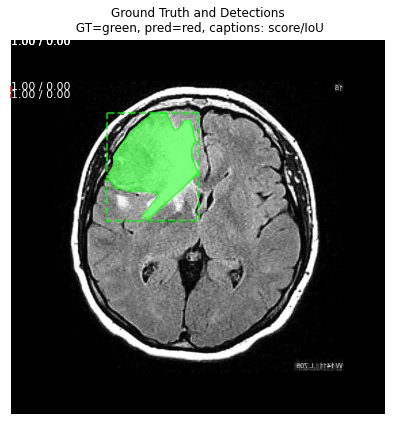

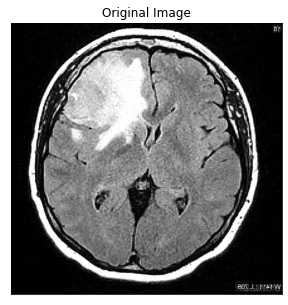

In [2]:
from mrcnn import visualize

def predict_and_plot_differences(dataset, img_id):
    original_image, image_meta, gt_class_id, gt_box, gt_mask =\
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    visualize.display_differences(
        original_image,
        gt_box, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        class_names=['tumor'], title="", ax=get_ax(),
        show_mask=True, show_box=True)
    

def display_image(dataset, ind):
    plt.figure(figsize=(5,5))
    plt.imshow(dataset.load_image(ind))
    plt.xticks([])
    plt.yticks([])
    plt.title('Original Image')
    plt.show()

# Validation Set
ind =10
display_image(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind)


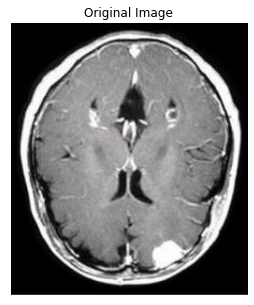

Polygon: {'name': 'ellipse', 'cx': 167, 'cy': 248, 'rx': 17, 'ry': 11.853, 'theta': -0.483}
Invalid polygon format: {'name': 'ellipse', 'cx': 167, 'cy': 248, 'rx': 17, 'ry': 11.853, 'theta': -0.483}


ValueError: cannot reshape array of size 0 into shape (0)

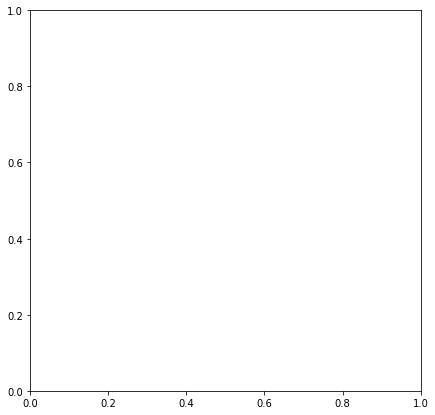

In [6]:

dataset_test = BrainScanDataset()
dataset_test.load_brain_scan(DATASET_DIR, 'TEST')
dataset_test.prepare()
ind = 10
display_image(dataset_test, ind)
predict_and_plot_differences(dataset_test, ind)

In [ ]:
# from mrcnn import visualize

# def predict_and_plot_differences(dataset, img_id):
#     original_image, image_meta, gt_class_id, gt_box, gt_mask =\
#         modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

#     results = model.detect([original_image], verbose=0)
#     r = results[0]

#     visualize.display_differences(
#         original_image,
#         gt_box, gt_class_id, gt_mask,
#         r['rois'], r['class_ids'], r['scores'], r['masks'],
#         class_names=['tumor'], title="", ax=get_ax(),
#         show_mask=True, show_box=True)
    

# def display_image(dataset, ind):
#     plt.figure(figsize=(5,5))
#     plt.imshow(dataset.load_image(ind))
#     plt.xticks([])
#     plt.yticks([])
#     plt.title('Original Image')
#     plt.show()

# # Validation Set
# ind =10
# predict_and_plot_differences(dataset_val, ind)
# display_image(dataset_val, ind)------------------ as same as following shows the original image, original image to applying the normalization and median filter, after median filter using segmentation of fuzzy c means clustering, and then segmentation image using to apply mask rcnn algorithm

Polygon: {'name': 'polygon', 'all_points_x': [245, 237, 221, 199, 178, 163, 175, 193, 222, 235], 'all_points_y': [213, 185, 169, 167, 190, 206, 233, 251, 250, 237]}


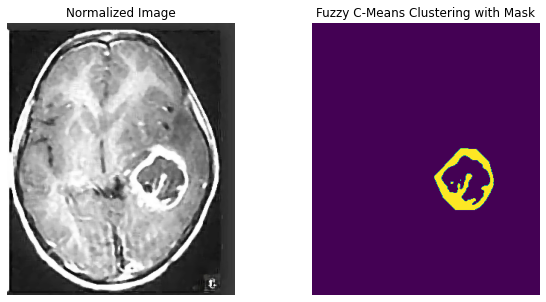

In [21]:
def apply_fuzzy_c_means_mask(image, mask):
    # Get coordinates of non-zero values in the mask
    nonzero_indices = np.transpose(np.nonzero(mask))

    # Extract patches centered at the non-zero mask coordinates
    patch_size = (3, 3)  # Define the patch size
    patches = []
    for y, x in nonzero_indices:
        # Calculate patch boundaries
        y_start = max(0, y - patch_size[0]//2)
        y_end = min(image.shape[0], y + patch_size[0]//2 + 1)
        x_start = max(0, x - patch_size[1]//2)
        x_end = min(image.shape[1], x + patch_size[1]//2 + 1)

        # Extract patch
        patch = image[y_start:y_end, x_start:x_end]
        patches.append(patch)

    # Convert patches to a 2D array
    patches_flat = np.array(patches).reshape(len(patches), -1)

    # Apply fuzzy c-means clustering
    fcm = KMeans(n_clusters=2)
    fcm.fit(patches_flat)

    # Reshape labels to the mask shape
    fcm_labels = np.zeros_like(mask, dtype=np.int32)
    for label, (y, x) in zip(fcm.labels_, nonzero_indices):
        fcm_labels[y, x] = label

    return fcm_labels

# Example usage
ind = 20  # Index of the image in the dataset
original_image = dataset_val.load_image(ind)

# Apply normalization and noise reduction
normalized_image = original_image.astype(np.float32) / 255.0
normalized_image = ndimage.median_filter(normalized_image, size=5)

# Apply Fuzzy C-Means Clustering with Mask
mask = dataset_val.load_mask(ind)[0][:, :, 0]  # Assuming binary mask for simplicity
fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, mask)

# Display results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(normalized_image)
plt.title('Normalized Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(fcm_mask_labels, cmap='viridis')
plt.title('Fuzzy C-Means Clustering with Mask')
plt.axis('off')

plt.show()


In [22]:
# def apply_fuzzy_c_means_mask(image, mask):
#     # Get coordinates of non-zero values in the mask
#     nonzero_indices = np.transpose(np.nonzero(mask))

#     # Extract patches centered at the non-zero mask coordinates
#     patch_size = (3, 3)  # Define the patch size
#     patches = []
#     for y, x in nonzero_indices:
#         # Calculate patch boundaries
#         y_start = max(0, y - patch_size[0]//2)
#         y_end = min(image.shape[0], y + patch_size[0]//2 + 1)
#         x_start = max(0, x - patch_size[1]//2)
#         x_end = min(image.shape[1], x + patch_size[1]//2 + 1)

#         # Extract patch
#         patch = image[y_start:y_end, x_start:x_end]
#         patches.append(patch)

#     # Convert patches to a 2D array
#     patches_flat = np.array(patches).reshape(len(patches), -1)

#     # Apply fuzzy c-means clustering
#     fcm = KMeans(n_clusters=2)
#     fcm.fit(patches_flat)

#     # Reshape labels to the mask shape
#     fcm_labels = np.zeros_like(mask, dtype=np.int32)
#     for label, (y, x) in zip(fcm.labels_, nonzero_indices):
#         fcm_labels[y, x] = label

#     return fcm_labels

# # Example usage
# ind = 11  # Index of the image in the dataset
# original_image = dataset_val.load_image(ind)

# # Apply normalization and noise reduction
# normalized_image = original_image.astype(np.float32) / 255.0
# normalized_image = ndimage.median_filter(normalized_image, size=5)

# # Apply Fuzzy C-Means Clustering with Mask
# mask = dataset_val.load_mask(ind)[0][:, :, 0]  # Assuming binary mask for simplicity
# fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, mask)

# # Display results
# plt.figure(figsize=(10, 5))
# plt.subplot(1, 2, 1)
# plt.imshow(normalized_image)
# plt.title('Normalized Image')
# plt.axis('off')

# plt.subplot(1, 2, 2)
# plt.imshow(fcm_mask_labels, cmap='gray')
# plt.title('Fuzzy C-Means Clustering with Mask')
# plt.axis('off')

# plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


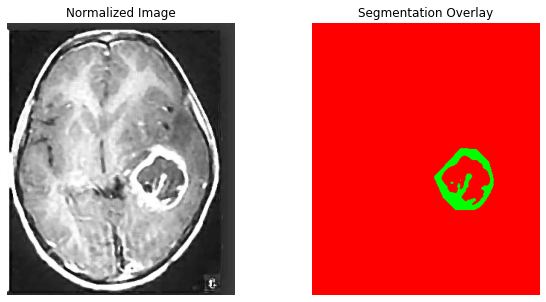

In [23]:
# Define a function to overlay the segmented regions on the original image
def overlay_segmentation(image, segmentation_labels):
    # Create a copy of the original image
    overlaid_image = np.copy(image)

    # Define colors for segmentation regions
    colors = {0: [255, 0, 0], 1: [0, 255, 0]}

    # Overlay segmentation on the image
    for label, color in colors.items():
        overlaid_image[segmentation_labels == label] = color

    return overlaid_image

# Overlay segmentation on the original image
segmented_image = overlay_segmentation(normalized_image, fcm_mask_labels)

# Display the results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(normalized_image)
plt.title('Normalized Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(segmented_image,cmap='gray')
plt.title('Segmentation Overlay')
plt.axis('off')

plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


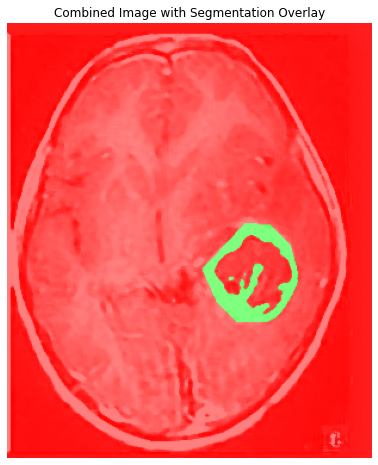

In [24]:
# Define a function to blend the original image with the segmentation overlay
def blend_images(image, overlay, alpha=0.5):
    blended_image = cv2.addWeighted(image, 1 - alpha, overlay, alpha, 0)
    return blended_image

# Blend the original image with the segmentation overlay
alpha = 0.5  # Set the transparency level
combined_image = blend_images(normalized_image, segmented_image, alpha)

# Display the combined image
plt.figure(figsize=(8, 8))
plt.imshow(combined_image)
plt.title('Combined Image with Segmentation Overlay')
plt.axis('off')
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


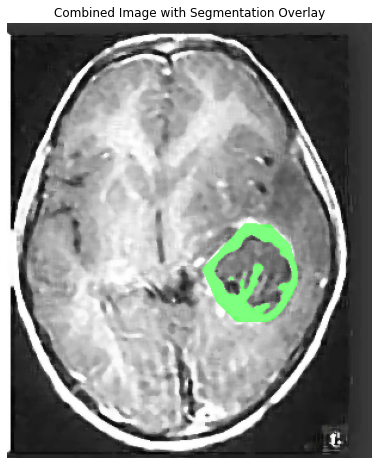

In [25]:
# Define a function to blend the original image with the segmentation overlay using masking
def blend_images_with_mask(image, overlay, mask, alpha=0.5):
    # Create a copy of the original image
    blended_image = np.copy(image)

    # Create a mask for the overlay
    overlay_mask = np.zeros_like(mask)
    overlay_mask[mask != 0] = 255

    # Apply the overlay with transparency only where the mask is non-zero
    blended_image[overlay_mask != 0] = cv2.addWeighted(
        blended_image[overlay_mask != 0], 1 - alpha, overlay[overlay_mask != 0], alpha, 0
    )

    return blended_image

# Blend the original image with the segmentation overlay using masking
alpha = 0.5  # Set the transparency level
combined_image = blend_images_with_mask(normalized_image, segmented_image, fcm_mask_labels, alpha)

# Display the combined image
plt.figure(figsize=(8, 8))
plt.imshow(combined_image)
plt.title('Combined Image with Segmentation Overlay')
plt.axis('off')
plt.show()


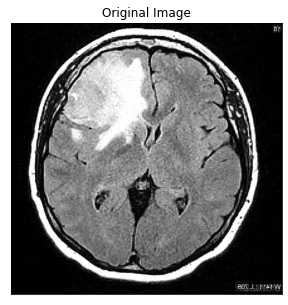

Polygon: {'name': 'polygon', 'all_points_x': [120, 137, 168, 225, 231, 195, 206, 256, 281, 316, 302, 302, 310, 298, 285, 274, 265, 245, 216, 188, 163, 137, 132], 'all_points_y': [205, 230, 236, 239, 245, 290, 298, 254, 231, 198, 166, 143, 130, 83, 85, 101, 107, 68, 70, 93, 119, 156, 186]}
No tumor detected.


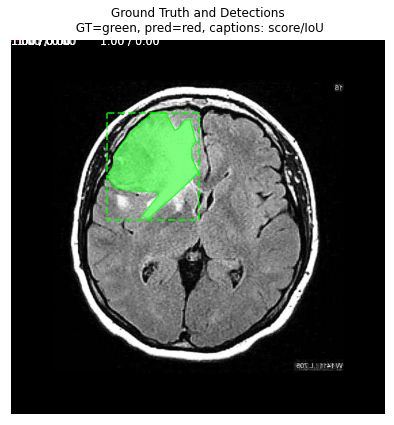

In [31]:
from mrcnn import visualize

def predict_and_plot_differences(dataset, img_id):
    original_image, image_meta, gt_class_id, gt_box, gt_mask =\
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    visualize.display_differences(
        original_image,
        gt_box, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        class_names=['tumor'], title="", ax=get_ax(),
        show_mask=True, show_box=True)
    
    # Extract the mask for the detected tumor region
    detected_mask = r['masks'][:, :, 0]  # Assuming there's only one instance (tumor)
    
    # Check if the detected mask is empty
    if np.sum(detected_mask) == 0:
        print("No tumor detected.")
        return
    
    # Apply fuzzy c-means clustering to the detected tumor mask
    fcm_labels = apply_fuzzy_c_means_mask(original_image, detected_mask)

    # Plot the original image, the differences, and the fuzzy c-means clustering segmentation
    plt.figure(figsize=(15, 5))

    # Original image
    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title('Original Image')
    plt.axis('off')

    # Differences between ground truth and predicted masks
    plt.subplot(1, 3, 2)
    visualize.display_differences(
        original_image,
        gt_box, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        class_names=['tumor'], title="Differences", ax=get_ax(),
        show_mask=True, show_box=True)
    plt.title('Differences')
    plt.axis('off')

    # Fuzzy C-Means Clustering segmentation
    plt.subplot(1, 3, 3)
    plt.imshow(fcm_labels, cmap='gray')
    plt.title('Fuzzy C-Means Clustering Segmentation')
    plt.axis('off')

    plt.show()

def display_image(dataset, ind):
    plt.figure(figsize=(5,5))
    plt.imshow(dataset.load_image(ind))
    plt.xticks([])
    plt.yticks([])
    plt.title('Original Image')
    plt.show()

# Validation Set
ind = 10
display_image(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind)


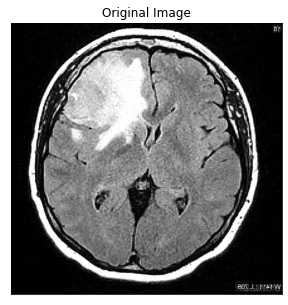

Polygon: {'name': 'polygon', 'all_points_x': [120, 137, 168, 225, 231, 195, 206, 256, 281, 316, 302, 302, 310, 298, 285, 274, 265, 245, 216, 188, 163, 137, 132], 'all_points_y': [205, 230, 236, 239, 245, 290, 298, 254, 231, 198, 166, 143, 130, 83, 85, 101, 107, 68, 70, 93, 119, 156, 186]}
No tumor detected.


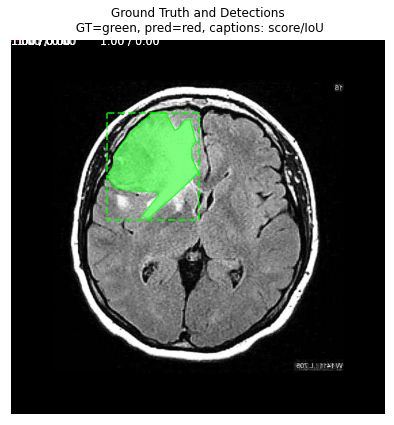

In [32]:
from mrcnn import visualize

def predict_and_plot_differences(dataset, img_id):
    original_image, image_meta, gt_class_id, gt_box, gt_mask =\
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    visualize.display_differences(
        original_image,
        gt_box, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        class_names=['tumor'], title="", ax=get_ax(),
        show_mask=True, show_box=True)
    
    # Extract the mask for the detected tumor region
    detected_mask = r['masks'][:, :, 0]  # Assuming there's only one instance (tumor)
    
    # Check if the detected mask is empty
    if np.sum(detected_mask) == 0:
        print("No tumor detected.")
        return
    
    # Apply fuzzy c-means clustering to the detected tumor mask
    fcm_labels = apply_fuzzy_c_means_mask(original_image, detected_mask)

    # Plot the original image, the differences, and the fuzzy c-means clustering segmentation
    plt.figure(figsize=(15, 5))

    # Original image
    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title('Original Image')
    plt.axis('off')

    # Differences between ground truth and predicted masks
    plt.subplot(1, 3, 2)
    visualize.display_differences(
        original_image,
        gt_box, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        class_names=['tumor'], title="Differences", ax=get_ax(),
        show_mask=True, show_box=True)
    plt.title('Differences')
    plt.axis('off')

    # Fuzzy C-Means Clustering segmentation
    plt.subplot(1, 3, 3)
    plt.imshow(fcm_labels, cmap='gray')
    plt.title('Fuzzy C-Means Clustering Segmentation')
    plt.axis('off')

    plt.show()

def display_image(dataset, ind):
    plt.figure(figsize=(5,5))
    plt.imshow(dataset.load_image(ind))
    plt.xticks([])
    plt.yticks([])
    plt.title('Original Image')
    plt.show()

# Validation Set
ind = 10
display_image(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind)


Polygon: {'name': 'polygon', 'all_points_x': [188, 176, 171, 164, 156, 134, 110, 102, 99, 102, 103, 112, 130, 142, 154, 167, 177, 184, 188], 'all_points_y': [136, 127, 117, 111, 110, 114, 113, 115, 142, 172, 196, 208, 208, 204, 195, 182, 171, 157, 146]}


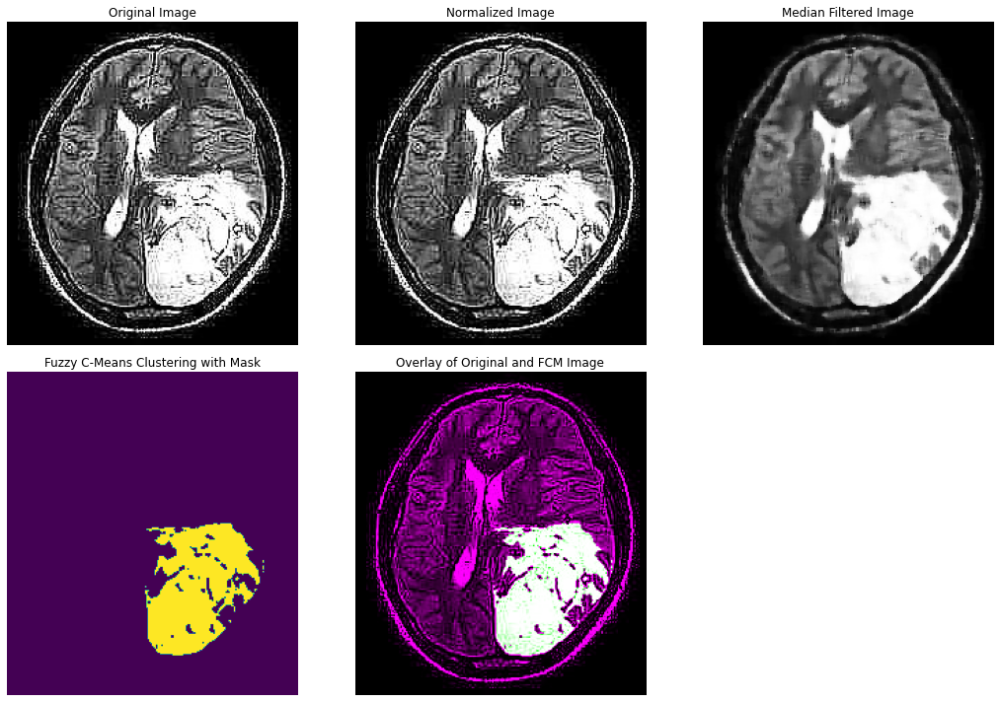

In [42]:
import matplotlib.pyplot as plt
import scipy.ndimage as ndimage
from sklearn.cluster import KMeans

def apply_fuzzy_c_means_mask(image, mask):
    # Get coordinates of non-zero values in the mask
    nonzero_indices = np.transpose(np.nonzero(mask))

    # Extract patches centered at the non-zero mask coordinates
    patch_size = (3, 3)  # Define the patch size
    patches = []
    for y, x in nonzero_indices:
        # Calculate patch boundaries
        y_start = max(0, y - patch_size[0]//2)
        y_end = min(image.shape[0], y + patch_size[0]//2 + 1)
        x_start = max(0, x - patch_size[1]//2)
        x_end = min(image.shape[1], x + patch_size[1]//2 + 1)

        # Extract patch
        patch = image[y_start:y_end, x_start:x_end]
        patches.append(patch)

    # Convert patches to a 2D array
    patches_flat = np.array(patches).reshape(len(patches), -1)

    # Apply fuzzy c-means clustering
    fcm = KMeans(n_clusters=2)
    fcm.fit(patches_flat)

    # Reshape labels to the mask shape
    fcm_labels = np.zeros_like(mask, dtype=np.int32)
    for label, (y, x) in zip(fcm.labels_, nonzero_indices):
        fcm_labels[y, x] = label

    return fcm_labels

# Example usage
ind = 1  # Index of the image in the dataset
original_image = dataset_val.load_image(ind)

# Apply normalization and noise reduction
normalized_image = original_image.astype(np.float32) / 255.0
median_filtered_image = ndimage.median_filter(normalized_image, size=5)

# Apply Fuzzy C-Means Clustering with Mask
mask = dataset_val.load_mask(ind)[0][:, :, 0]  # Assuming binary mask for simplicity
fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, mask)

# Display results
plt.figure(figsize=(15, 10))

# Plot Original Image
plt.subplot(2, 3, 1)
plt.imshow(original_image)
plt.title('Original Image')
plt.axis('off')

# Plot Normalized Image
plt.subplot(2, 3, 2)
plt.imshow(normalized_image)
plt.title('Normalized Image')
plt.axis('off')

# Plot Median Filtered Image
plt.subplot(2, 3, 3)
plt.imshow(median_filtered_image)
plt.title('Median Filtered Image')
plt.axis('off')

# Plot Fuzzy C-Means Clustering Image
plt.subplot(2, 3, 4)
plt.imshow(fcm_mask_labels, cmap='viridis')
plt.title('Fuzzy C-Means Clustering with Mask')
plt.axis('off')

# Plot Overlay of Original and Fuzzy C-Means Clustering Image
overlay_image = np.zeros_like(original_image)
overlay_image[:,:,0] = original_image[:,:,0]
overlay_image[:,:,1] = fcm_mask_labels*255
overlay_image[:,:,2] = original_image[:,:,0]
plt.subplot(2, 3, 5)
plt.imshow(overlay_image.astype(np.uint8),cmap="gray")
plt.title('Overlay of Original and FCM Image')
plt.axis('off')

plt.tight_layout()
plt.show()


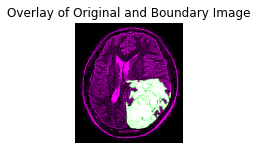

In [43]:
import cv2

# Apply dilation to the FCM clustering result to create boundaries
boundary_image = cv2.dilate(fcm_mask_labels.astype(np.uint8), kernel=np.ones((3, 3), np.uint8), iterations=1)

# Display overlay of Original and Boundary Image
overlay_boundary_image = np.zeros_like(original_image)
overlay_boundary_image[:, :, 0] = original_image[:, :, 0]
overlay_boundary_image[:, :, 1] = boundary_image * 255  # Set boundary pixels to white
overlay_boundary_image[:, :, 2] = original_image[:, :, 0]

plt.subplot(2, 3, 6)
plt.imshow(overlay_boundary_image.astype(np.uint8), cmap="gray")
plt.title('Overlay of Original and Boundary Image')
plt.axis('off')

plt.tight_layout()
plt.show()


Polygon: {'name': 'polygon', 'all_points_x': [188, 176, 171, 164, 156, 134, 110, 102, 99, 102, 103, 112, 130, 142, 154, 167, 177, 184, 188], 'all_points_y': [136, 127, 117, 111, 110, 114, 113, 115, 142, 172, 196, 208, 208, 204, 195, 182, 171, 157, 146]}


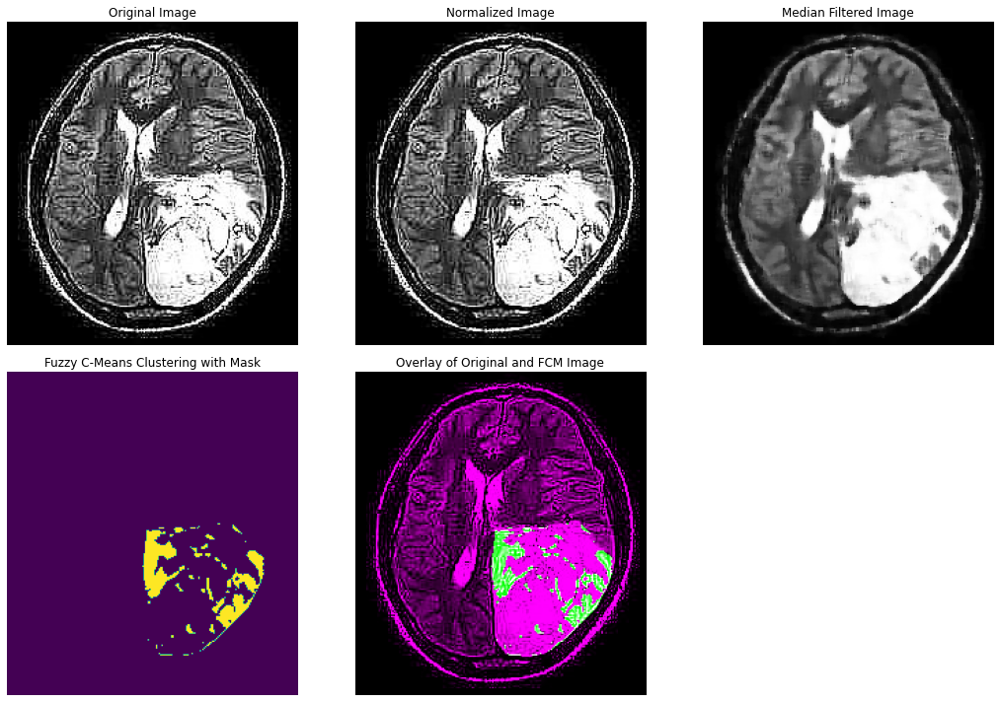

In [39]:
from mrcnn import visualize

def predict_and_plot_differences(dataset, img_id):
    original_image, image_meta, gt_class_id, gt_box, gt_mask =\
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    visualize.display_differences(
        original_image,
        gt_box, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        class_names=['tumor'], title="", ax=get_ax(),
        show_mask=True, show_box=True)
    
    # Extract the mask for the detected tumor region
    detected_mask = r['masks'][:, :, 0]  # Assuming there's only one instance (tumor)
    
    # Check if the detected mask is empty
    if np.sum(detected_mask) == 0:
        print("No tumor detected.")
        return
    
    # Apply fuzzy c-means clustering to the detected tumor mask
    fcm_labels = apply_fuzzy_c_means_mask(original_image, detected_mask)

    # Plot the original image, the differences, and the fuzzy c-means clustering segmentation
    plt.figure(figsize=(15, 5))

    # Original image
    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title('Original Image')
    plt.axis('off')

    # Differences between ground truth and predicted masks
    plt.subplot(1, 3, 2)
    visualize.display_differences(
        original_image,
        gt_box, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        class_names=['tumor'], title="Differences", ax=get_ax(),
        show_mask=True, show_box=True)
    plt.title('Differences')
    plt.axis('off')

    # Fuzzy C-Means Clustering segmentation
    plt.subplot(1, 3, 3)
    plt.imshow(fcm_labels, cmap='gray')
    plt.title('Fuzzy C-Means Clustering Segmentation')
    plt.axis('off')

    plt.show()

def display_image(dataset, ind):
    plt.figure(figsize=(5,5))
    plt.imshow(dataset.load_image(ind))
    plt.xticks([])
    plt.yticks([])
    plt.title('Original Image')
    plt.show()

# Validation Set
ind = 10
display_image(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind)


In [2]:
import os
import sys
import skimage.io
import numpy as np
import json
import skimage.draw
import matplotlib.pyplot as plt
import ssl
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
import scipy.ndimage as ndimage
import skimage.filters as filters
from mrcnn import visualize
# Root directory of the project
ROOT_DIR = os.path.abspath("D:/Mask_RCNN-master/")
sys.path.append(ROOT_DIR)

# Create directory for logs and trained weights if it doesn't exist
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

ssl._create_default_https_context = ssl._create_unverified_context
sys.path.append(os.path.join(ROOT_DIR, 'samples/coco/'))
plt.rcParams['figure.facecolor'] = 'white'


def get_ax(rows=1, cols=1, size=7):
    _, ax = plt.subplots(rows, cols, figsize=(size * cols, size * rows))
    return ax


# Import Mask RCNN COCO trained weights
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

DATASET_DIR = "D:/Mask_RCNN-master/Br35H-Mask-RCNN/"


class TumorConfig(Config):
    NAME = 'tumor_detector'
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 1  # background + tumor
    DETECTION_MIN_CONFIDENCE = 0.85
    STEPS_PER_EPOCH = 5
    LEARNING_RATE = 0.001


config = TumorConfig()


class BrainScanDataset(utils.Dataset):
    def load_brain_scan(self, dataset_dir, subset):
        self.add_class("tumor", 1, "tumor")
        assert subset in ["TRAIN", "VAL", "TEST"]
        dataset_dir = os.path.join(dataset_dir, subset)
        annotations = json.load(open(os.path.join(DATASET_DIR, subset, 'annotations_' + subset + '.json')))
        annotations = list(annotations.values())
        annotations = [a for a in annotations if a['regions']]
        for a in annotations:
            if type(a['regions']) is dict:
                polygons = [r['shape_attributes'] for r in a['regions'].values()]
            else:
                polygons = [r['shape_attributes'] for r in a['regions']]
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)
            image = image.astype(np.float32) / 255.0
            image = ndimage.median_filter(image, size=3)
            image = filters.unsharp_mask(image, radius=1.0, amount=1.5)
            height, width = image.shape[:2]
            self.add_image(
                "tumor",
                image_id=a['filename'],
                path=image_path,
                width=width,
                height=height,
                polygons=polygons
            )

    def load_mask(self, image_id):
        image_info = self.image_info[image_id]
        if image_info["source"] != "tumor":
            return super(self.__class__, self).load_mask(image_id)
        info = self.image_info[image_id]
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):
            print("Polygon:", p)
            if 'all_points_y' not in p or 'all_points_x' not in p:
                print("Invalid polygon format:", p)
                continue
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            mask[rr, cc, i] = 1
        return mask.astype(np.bool), np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        info = self.image_info[image_id]
        if info["source"] == "tumor":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)


In [3]:

dataset_train = BrainScanDataset()
dataset_train.load_brain_scan(DATASET_DIR, 'TRAIN')
dataset_train.prepare()

dataset_val = BrainScanDataset()
dataset_val.load_brain_scan(DATASET_DIR, 'VAL')
dataset_val.prepare()


In [4]:
model = modellib.MaskRCNN(
    mode='training',
    config=config,
    model_dir=MODEL_DIR
)

model.load_weights(
    COCO_MODEL_PATH,
    by_name=True,
    exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"]
)







Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Instructions for updating:
box_ind is deprecated, use box_indices instead








In [5]:

print("Training network heads")
model.train(
    dataset_train,
    dataset_val,
    learning_rate=config.LEARNING_RATE,
    epochs=1,
    layers='heads'
)


Training network heads

Starting at epoch 0. LR=0.001

Checkpoint Path: D:\Mask_RCNN-master\logs\tumor_detector20240522T2051\mask_rcnn_tumor_detector_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_con

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "






Epoch 1/1
Polygon: {'name': 'polygon', 'all_points_x': [159, 147, 133, 123, 121, 119, 119, 124, 133, 146, 153, 164, 169, 175, 172], 'all_points_y': [115, 109, 109, 125, 139, 151, 165, 183, 191, 187, 173, 163, 157, 143, 125]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/5 [=====>........................] - ETA: 3:21 - loss: 3.9810 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.4588 - mrcnn_class_loss: 1.4878 - mrcnn_bbox_loss: 1.2052 - mrcnn_mask_loss: 0.8252Polygon: {'name': 'polygon', 'all_points_x': [164, 146, 129, 117, 110, 120, 129, 146, 160, 178, 191, 205, 221, 224, 212, 194, 180], 'all_points_y': [188, 190, 196, 207, 223, 242, 263, 260, 260, 273, 268, 249, 230, 212, 198, 186, 185]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2/5 [===========>..................] - ETA: 2:09 - loss: 3.4042 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2376 - mrcnn_class_loss: 1.1366 - mrcnn_bbox_loss: 1.1051 - mrcnn_mask_loss: 0.9209Polygon: {'name': 'polygon', 'all_points_x': [121, 121, 115, 99, 91, 86, 86, 95, 110, 117], 'all_points_y': [269, 255, 241, 234, 241, 254, 263, 271, 273, 273]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3/5 [=================>............] - ETA: 1:22 - loss: 2.9037 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.2562 - mrcnn_class_loss: 0.8079 - mrcnn_bbox_loss: 1.0691 - mrcnn_mask_loss: 0.7605Polygon: {'name': 'polygon', 'all_points_x': [30, 37, 40, 46, 50, 54, 59, 67, 71, 75, 78, 80, 75, 63, 56, 49, 41, 36, 33, 34, 35, 31, 29, 28, 26, 25, 24, 23, 26, 22, 21, 23, 25, 27, 28, 32], 'all_points_y': [89, 89, 92, 91, 97, 95, 92, 100, 107, 114, 122, 133, 144, 152, 154, 152, 151, 148, 142, 136, 133, 131, 135, 142, 144, 136, 130, 124, 120, 113, 113, 105, 96, 92, 89, 89]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4/5 [=======================>......] - ETA: 40s - loss: 2.6607 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.2484 - mrcnn_class_loss: 0.6181 - mrcnn_bbox_loss: 1.0931 - mrcnn_mask_loss: 0.6915 Polygon: {'name': 'polygon', 'all_points_x': [98, 98, 89, 77, 63, 50, 49, 54, 66, 58, 60, 69, 84, 89, 94, 102, 104, 102, 98], 'all_points_y': [211, 227, 235, 234, 227, 218, 204, 195, 192, 182, 173, 163, 163, 166, 174, 181, 191, 206, 212]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 116, 'cy': 206, 'rx': 23.333, 'ry': 20.667, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 116, 'cy': 206, 'rx': 23.333, 'ry': 20.667, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [172, 146, 125, 107, 77, 85, 108, 136, 164, 183, 188], 'all_points_y': [87, 94, 81, 87, 130, 149, 167, 167, 164, 148, 128]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [25, 44, 66, 82, 92, 90, 81, 57, 40, 28, 25, 27], 'all_points_y': [187, 175, 177, 189, 205, 225, 246, 249, 246, 245, 226, 210]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [218, 197, 169, 159, 166, 177, 204, 220, 229, 233, 209, 212], 'all_points_y': [189, 185, 202, 237, 243, 271, 255, 243, 227, 208, 197, 193]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [111, 184, 241, 283, 293, 262, 200, 132, 107, 99, 89], 'all_points_y': [301, 301, 334, 405, 479, 551, 601, 611, 677, 493, 388]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 99, 'cy': 209, 'rx': 39, 'ry': 42, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 99, 'cy': 209, 'rx': 39, 'ry': 42, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 180, 'cy': 165, 'rx': 21, 'ry': 24, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 180, 'cy': 165, 'rx': 21, 'ry': 24, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [210, 183, 158, 149, 176, 207, 214, 220, 227, 217], 'all_points_y': [117, 105, 123, 164, 192, 196, 181, 183, 160, 131]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [330, 311, 271, 258, 240, 246, 212, 200, 190, 143, 134, 145, 199, 225, 226, 259, 262, 285, 288, 316, 344, 341, 331, 346, 340], 'all_points_y': [188, 179, 196, 168, 156, 134, 121, 134, 161, 180, 230, 245, 248, 275, 311, 318, 297, 287, 304, 304, 281, 241, 231, 211, 199]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [196, 177, 168, 181, 217, 237, 233, 216], 'all_points_y': [131, 153, 200, 220, 225, 193, 149, 149]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [404, 371, 384, 371, 349, 317, 298, 299, 309, 315, 327, 365, 394, 403], 'all_points_y': [359, 341, 333, 323, 327, 348, 388, 404, 409, 435, 450, 431, 399, 375]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [99, 98, 104, 99, 87, 70, 56, 50, 46, 58, 80, 91], 'all_points_y': [29, 48, 65, 84, 97, 97, 81, 63, 48, 34, 28, 25]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [49, 65, 67, 52, 31, 39], 'all_points_y': [230, 213, 199, 190, 198, 214]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 338, 'cy': 295, 'rx': 37, 'ry': 24.083, 'theta': -0.083}
Invalid polygon format: {'name': 'ellipse', 'cx': 338, 'cy': 295, 'rx': 37, 'ry': 24.083, 'theta': -0.083}
Polygon: {'name': 'polygon', 'all_points_x': [259, 233, 194, 216, 205, 146, 159, 151, 159, 164, 175, 191, 220, 244], 'all_points_y': [112, 127, 129, 158, 161, 101, 88, 66, 43, 42, 56, 27, 48, 74]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 184, 'cy': 702, 'rx': 99.936, 'ry': 106.233, 'theta': 2.423}
Invalid polygon format: {'name': 'ellipse', 'cx': 184, 'cy': 702, 'rx': 99.936, 'ry': 106.233, 'theta': 2.423}
Polygon: {'name': 'polygon', 'all_points_x': [143, 163, 171, 176, 145, 129, 132, 119, 117, 127], 'all_points_y': [34, 61, 65, 87, 116, 115, 105, 97, 59, 34]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [224, 193, 182, 166, 151, 135, 130, 102, 93, 100, 141, 158, 158, 179, 186, 198, 201, 220, 238, 235, 241, 235], 'all_points_y': [123, 142, 114, 90, 84, 109, 118, 122, 161, 172, 175, 194, 217, 225, 207, 203, 214, 213, 197, 163, 146, 132]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [54, 75, 102, 111, 111, 80, 58, 29, 33, 41, 51, 46], 'all_points_y': [72, 80, 108, 117, 147, 170, 181, 177, 148, 115, 106, 88]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 310, 'cy': 302, 'rx': 52.498, 'ry': 73, 'theta': 2.437}
Invalid polygon format: {'name': 'ellipse', 'cx': 310, 'cy': 302, 'rx': 52.498, 'ry': 73, 'theta': 2.437}
Polygon: {'name': 'ellipse', 'cx': 329, 'cy': 332, 'rx': 58.009, 'ry': 79, 'theta': 3.124}
Invalid polygon format: {'name': 'ellipse', 'cx': 329, 'cy': 332, 'rx': 58.009, 'ry': 79, 'theta': 3.124}
Polygon: {'name': 'polygon', 'all_points_x': [24, 36, 56, 100, 116, 113, 109, 91, 45, 34], 'all_points_y': [149, 127, 108, 114, 138, 170, 203, 211, 185, 169]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 202, 'cy': 180, 'rx': 35, 'ry': 45, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 202, 'cy': 180, 'rx': 35, 'ry': 45, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 138, 'cy': 400, 'rx': 20, 'ry': 25.239, 'theta': -0.588}
Invalid polygon format: {'name': 'ellipse', 'cx': 138, 'cy': 400, 'rx': 20, 'ry': 25.239, 'theta': -0.588}
Polygon: {'name': 'polygon', 'all_points_x': [106, 141, 125, 148, 169, 200, 215, 211, 200, 187, 150, 122, 109], 'all_points_y': [360, 343, 335, 322, 331, 351, 391, 405, 430, 449, 432, 409, 381]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [75, 93, 93, 102, 110, 110, 100, 98, 89, 78, 68, 60, 57, 67], 'all_points_y': [207, 206, 212, 215, 233, 245, 247, 257, 264, 266, 251, 239, 229, 219]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 369, 'cy': 634, 'rx': 44.503, 'ry': 42.277, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 369, 'cy': 634, 'rx': 44.503, 'ry': 42.277, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [999, 930, 854, 828, 770, 732, 712, 761, 826, 881, 952, 990, 970, 995, 1004], 'all_points_y': [289, 254, 256, 303, 300, 332, 412, 485, 534, 547, 501, 427, 409, 360, 327]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 397, 'cy': 695, 'rx': 36.674, 'ry': 43.868, 'theta': 3.062}
Invalid polygon format: {'name': 'ellipse', 'cx': 397, 'cy': 695, 'rx': 36.674, 'ry': 43.868, 'theta': 3.062}
Polygon: {'name': 'ellipse', 'cx': 211, 'cy': 195, 'rx': 28, 'ry': 29, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 211, 'cy': 195, 'rx': 28, 'ry': 29, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 173, 'cy': 133, 'rx': 27.463, 'ry': 33.333, 'theta': 0.097}
Invalid polygon format: {'name': 'ellipse', 'cx': 173, 'cy': 133, 'rx': 27.463, 'ry': 33.333, 'theta': 0.097}
Polygon: {'name': 'ellipse', 'cx': 199, 'cy': 181, 'rx': 32, 'ry': 46.872, 'theta': -2.948}
Invalid polygon format: {'name': 'ellipse', 'cx': 199, 'cy': 181, 'rx': 32, 'ry': 46.872, 'theta': -2.948}
Polygon: {'name': 'ellipse', 'cx': 202, 'cy': 194, 'rx': 24, 'ry': 23.259, 'theta': -2.697}
Invalid polygon format: {'name': 'ellipse', 'cx': 202, 'cy': 194, 'rx': 24, 'ry': 23.259, 'theta': -2.697}
Polygon: {'

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [89, 95, 94, 83, 71, 70, 53, 60, 73, 77, 67, 69, 78], 'all_points_y': [88, 103, 132, 165, 163, 148, 137, 127, 126, 121, 115, 99, 89]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [237, 209, 177, 138, 131, 140, 149, 173, 195, 213, 224], 'all_points_y': [143, 169, 173, 161, 121, 65, 41, 32, 49, 71, 104]}
Polygon: {'name': 'ellipse', 'cx': 116, 'cy': 196, 'rx': 17.333, 'ry': 16, 'theta': -3.142}
Invalid polygon format: {'name': 'ellipse', 'cx': 116, 'cy': 196, 'rx': 17.333, 'ry': 16, 'theta': -3.142}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 124, 'cy': 225, 'rx': 25, 'ry': 24, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 124, 'cy': 225, 'rx': 25, 'ry': 24, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [99, 128, 118, 106, 78, 46, 23, 37, 59, 79], 'all_points_y': [31, 88, 128, 147, 159, 137, 101, 62, 34, 30]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [96, 167, 168, 146, 115, 99, 87, 69, 79, 74, 77], 'all_points_y': [179, 203, 240, 297, 305, 293, 285, 247, 231, 217, 195]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 204, 'cy': 263, 'rx': 38.275, 'ry': 45, 'theta': -0.347}
Invalid polygon format: {'name': 'ellipse', 'cx': 204, 'cy': 263, 'rx': 38.275, 'ry': 45, 'theta': -0.347}
Polygon: {'name': 'ellipse', 'cx': 74, 'cy': 226, 'rx': 38, 'ry': 50.636, 'theta': -2.983}
Invalid polygon format: {'name': 'ellipse', 'cx': 74, 'cy': 226, 'rx': 38, 'ry': 50.636, 'theta': -2.983}
Polygon: {'name': 'polygon', 'all_points_x': [34, 49, 71, 89, 103, 130, 136, 116, 97, 85, 63, 50, 37], 'all_points_y': [140, 158, 171, 174, 166, 122, 106, 68, 49, 42, 63, 94, 123]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 600, 'cy': 700, 'rx': 95.939, 'ry': 104.795, 'theta': -2.532}
Invalid polygon format: {'name': 'ellipse', 'cx': 600, 'cy': 700, 'rx': 95.939, 'ry': 104.795, 'theta': -2.532}
Polygon: {'name': 'polygon', 'all_points_x': [586, 526, 535, 548, 538, 510, 492, 487, 479, 516, 550, 574, 626, 657, 685, 743, 789, 850, 828, 813, 794, 773, 727, 674], 'all_points_y': [85, 83, 115, 173, 214, 209, 241, 310, 396, 423, 407, 415, 423, 454, 521, 516, 510, 529, 419, 366, 312, 224, 158, 115]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 285, 'cy': 164, 'rx': 16.155, 'ry': 11, 'theta': 2.761}
Invalid polygon format: {'name': 'ellipse', 'cx': 285, 'cy': 164, 'rx': 16.155, 'ry': 11, 'theta': 2.761}
Polygon: {'name': 'polygon', 'all_points_x': [309, 291, 276, 252, 255, 281, 312, 331, 330, 321], 'all_points_y': [122, 127, 119, 161, 185, 197, 193, 172, 146, 133]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 216, 'cy': 301, 'rx': 53.038, 'ry': 70, 'theta': 0.772}
Invalid polygon format: {'name': 'ellipse', 'cx': 216, 'cy': 301, 'rx': 53.038, 'ry': 70, 'theta': 0.772}
Polygon: {'name': 'polygon', 'all_points_x': [161, 143, 76, 72, 87, 71, 158, 165, 156], 'all_points_y': [180, 163, 160, 174, 194, 221, 224, 213, 203]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 219, 'cy': 100, 'rx': 24, 'ry': 21, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 219, 'cy': 100, 'rx': 24, 'ry': 21, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [280, 264, 260, 232, 200, 189, 195, 204, 224, 245, 264], 'all_points_y': [82, 108, 137, 151, 132, 113, 61, 47, 50, 57, 69]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 69, 'cy': 134, 'rx': 29, 'ry': 32.016, 'theta': 0.031}
Invalid polygon format: {'name': 'ellipse', 'cx': 69, 'cy': 134, 'rx': 29, 'ry': 32.016, 'theta': 0.031}
Polygon: {'name': 'ellipse', 'cx': 154, 'cy': 93, 'rx': 26, 'ry': 28, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 154, 'cy': 93, 'rx': 26, 'ry': 28, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 204, 'cy': 226, 'rx': 40.05, 'ry': 57, 'theta': -3.092}
Invalid polygon format: {'name': 'ellipse', 'cx': 204, 'cy': 226, 'rx': 40.05, 'ry': 57, 'theta': -3.092}
Polygon: {'name': 'ellipse', 'cx': 398, 'cy': 695, 'rx': 38, 'ry': 44, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 398, 'cy': 695, 'rx': 38, 'ry': 44, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [116, 128, 121, 114, 53, 62, 72, 84, 84, 103, 113], 'all_points_y': [151, 159, 211, 215, 196, 145, 143, 153, 166, 167, 161]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [57, 49, 47, 93, 110, 108, 100, 87, 70], 'all_points_y': [50, 65, 91, 122, 110, 78, 46, 33, 37]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 188, 'cy': 172, 'rx': 22, 'ry': 26.571, 'theta': 0.346}
Invalid polygon format: {'name': 'ellipse', 'cx': 188, 'cy': 172, 'rx': 22, 'ry': 26.571, 'theta': 0.346}
Polygon: {'name': 'polygon', 'all_points_x': [205, 161, 147, 150, 172, 179, 197, 198, 209, 216, 213, 209], 'all_points_y': [113, 121, 169, 213, 234, 223, 228, 211, 210, 193, 158, 131]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [211, 233, 251, 249, 252, 226, 184, 176, 178, 164, 161, 176, 186, 198], 'all_points_y': [199, 207, 241, 275, 294, 305, 297, 266, 244, 233, 221, 219, 223, 203]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [249, 227, 216, 211, 192, 159, 151, 165, 163, 142, 135, 139, 169, 195, 196, 203, 205, 224, 227, 235, 245], 'all_points_y': [172, 189, 202, 230, 253, 232, 207, 195, 177, 154, 144, 121, 98, 102, 131, 133, 118, 115, 127, 129, 148]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [253, 215, 195, 195, 171, 169, 156, 152, 129, 113, 119, 111, 133, 165, 169, 167, 183, 184, 199, 213, 219, 248, 257], 'all_points_y': [168, 172, 193, 215, 224, 211, 201, 212, 211, 192, 164, 145, 124, 143, 133, 115, 113, 93, 83, 96, 117, 120, 144]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 126, 'cy': 110, 'rx': 33.333, 'ry': 33.333, 'theta': 3.142}
Invalid polygon format: {'name': 'ellipse', 'cx': 126, 'cy': 110, 'rx': 33.333, 'ry': 33.333, 'theta': 3.142}
Polygon: {'name': 'ellipse', 'cx': 209, 'cy': 234, 'rx': 23.419, 'ry': 30, 'theta': -0.086}
Invalid polygon format: {'name': 'ellipse', 'cx': 209, 'cy': 234, 'rx': 23.419, 'ry': 30, 'theta': -0.086}
Polygon: {'name': 'polygon', 'all_points_x': [454, 406, 320, 277, 283, 282, 316, 372, 452, 518, 562, 544, 500], 'all_points_y': [306, 254, 267, 316, 378, 433, 497, 543, 536, 484, 409, 340, 295]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [49, 69, 67, 53, 31, 40], 'all_points_y': [232, 211, 196, 190, 197, 215]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 202, 'cy': 195, 'rx': 22, 'ry': 22, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 202, 'cy': 195, 'rx': 22, 'ry': 22, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 588, 'cy': 280, 'rx': 78, 'ry': 99, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 588, 'cy': 280, 'rx': 78, 'ry': 99, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [530, 550, 526, 514, 492, 497, 482, 494, 482, 505, 506, 540, 625, 682, 703, 704, 674, 681, 711, 818, 805, 797, 775, 735, 693, 609], 'all_points_y': [105, 182, 224, 208, 240, 291, 310, 355, 393, 423, 423, 406, 419, 519, 516, 431, 414, 391, 393, 377, 348, 307, 225, 173, 115, 93]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 176, 'cy': 167, 'rx': 33, 'ry': 23.601, 'theta': 2.507}
Invalid polygon format: {'name': 'ellipse', 'cx': 176, 'cy': 167, 'rx': 33, 'ry': 23.601, 'theta': 2.507}
Polygon: {'name': 'polygon', 'all_points_x': [188, 212, 216, 201, 202, 179, 156, 171, 177, 160, 145, 154, 169], 'all_points_y': [135, 165, 190, 207, 222, 244, 238, 231, 212, 195, 181, 155, 143]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [255, 229, 210, 194, 192, 196, 217, 246, 256, 257, 259], 'all_points_y': [185, 177, 181, 198, 220, 240, 248, 249, 243, 216, 201]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [108, 83, 71, 74, 86, 107, 120, 108, 100, 103, 114], 'all_points_y': [208, 206, 220, 256, 287, 292, 286, 258, 252, 230, 221]}
Polygon: {'name': 'ellipse', 'cx': 130, 'cy': 199, 'rx': 18, 'ry': 19, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 130, 'cy': 199, 'rx': 18, 'ry': 19, 'theta': 0}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 64, 'cy': 249, 'rx': 16.125, 'ry': 14, 'theta': 0.519}
Invalid polygon format: {'name': 'ellipse', 'cx': 64, 'cy': 249, 'rx': 16.125, 'ry': 14, 'theta': 0.519}
Polygon: {'name': 'polygon', 'all_points_x': [94, 107, 109, 115, 103, 79, 53, 64, 39, 46, 62, 76], 'all_points_y': [281, 265, 250, 247, 212, 195, 200, 206, 219, 244, 262, 273]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [430, 363, 309, 269, 264, 293, 340, 375, 410, 428, 420, 435, 437, 463, 476, 459], 'all_points_y': [551, 549, 580, 623, 676, 728, 754, 761, 767, 746, 707, 683, 652, 635, 605, 576]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 125, 'cy': 59, 'rx': 20, 'ry': 24, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 125, 'cy': 59, 'rx': 20, 'ry': 24, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [169, 142, 137, 124, 91, 87, 97, 103, 109, 129, 149, 161, 169], 'all_points_y': [89, 101, 113, 110, 95, 73, 49, 48, 27, 27, 37, 55, 71]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 184, 'cy': 174, 'rx': 19, 'ry': 22, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 184, 'cy': 174, 'rx': 19, 'ry': 22, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [203, 177, 158, 140, 145, 155, 171, 176, 195, 214, 214], 'all_points_y': [111, 120, 120, 166, 202, 221, 233, 225, 229, 203, 162]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [181, 162, 126, 97, 82, 77, 100, 122, 151, 168, 177], 'all_points_y': [102, 128, 159, 144, 104, 88, 43, 29, 39, 62, 81]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 54, 'cy': 171, 'rx': 19.6, 'ry': 28.98, 'theta': 2.684}
Invalid polygon format: {'name': 'ellipse', 'cx': 54, 'cy': 171, 'rx': 19.6, 'ry': 28.98, 'theta': 2.684}
Polygon: {'name': 'polygon', 'all_points_x': [41, 61, 79, 87, 98, 92, 82, 69, 60, 42, 44, 31, 28, 24, 27, 36, 44, 34, 36], 'all_points_y': [111, 118, 119, 136, 178, 209, 222, 231, 223, 229, 214, 208, 198, 182, 158, 142, 135, 128, 117]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [360, 369, 358, 306, 277, 279, 245, 240, 220, 216, 192, 162, 164, 169, 159, 185, 219, 237, 239, 258, 262, 289, 306, 316], 'all_points_y': [178, 232, 244, 249, 277, 310, 319, 294, 288, 302, 306, 281, 242, 231, 211, 176, 198, 203, 178, 156, 133, 117, 141, 166]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 217, 'cy': 302, 'rx': 51.624, 'ry': 69, 'theta': 0.772}
Invalid polygon format: {'name': 'ellipse', 'cx': 217, 'cy': 302, 'rx': 51.624, 'ry': 69, 'theta': 0.772}
Polygon: {'name': 'ellipse', 'cx': 75, 'cy': 94, 'rx': 25.06, 'ry': 33, 'theta': 0.499}
Invalid polygon format: {'name': 'ellipse', 'cx': 75, 'cy': 94, 'rx': 25.06, 'ry': 33, 'theta': 0.499}
Polygon: {'name': 'polygon', 'all_points_x': [188, 176, 171, 164, 156, 134, 110, 102, 99, 102, 103, 112, 130, 142, 154, 167, 177, 184, 188], 'all_points_y': [136, 127, 117, 111, 110, 114, 113, 115, 142, 172, 196, 208, 208, 204, 195, 182, 171, 157, 146]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 126, 'cy': 170, 'rx': 8, 'ry': 10.088, 'theta': -3.009}
Invalid polygon format: {'name': 'ellipse', 'cx': 126, 'cy': 170, 'rx': 8, 'ry': 10.088, 'theta': -3.009}
Polygon: {'name': 'ellipse', 'cx': 72, 'cy': 125, 'rx': 20.667, 'ry': 20, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 72, 'cy': 125, 'rx': 20.667, 'ry': 20, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 137, 'cy': 67, 'rx': 42, 'ry': 44.553, 'theta': 0.801}
Invalid polygon format: {'name': 'ellipse', 'cx': 137, 'cy': 67, 'rx': 42, 'ry': 44.553, 'theta': 0.801}
Polygon: {'name': 'polygon', 'all_points_x': [67, 83, 92, 102, 102, 90, 80, 67, 51, 44, 47, 55], 'all_points_y': [244, 239, 215, 182, 149, 136, 140, 134, 145, 164, 206, 226]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 221, 'cy': 126, 'rx': 22, 'ry': 20, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 221, 'cy': 126, 'rx': 22, 'ry': 20, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 219, 'cy': 125, 'rx': 21, 'ry': 19, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 219, 'cy': 125, 'rx': 21, 'ry': 19, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 113, 'cy': 119, 'rx': 41, 'ry': 53, 'theta': 3.142}
Invalid polygon format: {'name': 'ellipse', 'cx': 113, 'cy': 119, 'rx': 41, 'ry': 53, 'theta': 3.142}
Polygon: {'name': 'polygon', 'all_points_x': [193, 175, 155, 141, 136, 149, 171, 187, 219, 238, 233, 217, 209], 'all_points_y': [41, 49, 65, 93, 109, 129, 143, 173, 163, 141, 112, 77, 61]}
Polygon: {'name': 'ellipse', 'cx': 118, 'cy': 195, 'rx': 17, 'ry': 17, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 118, 'cy': 195, 'rx': 17, 'ry': 17, 'theta': 0}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5/5 [==============================] - 762s 152s/step - loss: 2.6606 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.3257 - mrcnn_class_loss: 0.5068 - mrcnn_bbox_loss: 1.0629 - mrcnn_mask_loss: 0.7566 - val_loss: 3.5683 - val_rpn_class_loss: 0.0217 - val_rpn_bbox_loss: 2.0597 - val_mrcnn_class_loss: 0.0608 - val_mrcnn_bbox_loss: 0.8257 - val_mrcnn_mask_loss: 0.6004



In [7]:
class InferenceConfig(TumorConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1


inference_config = InferenceConfig()


In [8]:
model = modellib.MaskRCNN(
    mode="inference",
    config=inference_config,
    model_dir=MODEL_DIR
)





Instructions for updating:
Use `tf.cast` instead.


In [13]:
model_path = model.find_last()


FileNotFoundError: [Errno 2] Could not find weight files in D:\Mask_RCNN-master\logs\tumor_detector20240521T1720

In [14]:
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)



NameError: name 'model_path' is not defined

In [9]:
def predict_and_plot_differences(dataset, img_id):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    visualize.display_differences(
        original_image,
        gt_box, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        class_names=['tumor'], title="", ax=get_ax(),
        show_mask=True, show_box=True)


In [10]:
def display_image(dataset, ind):
    plt.figure(figsize=(5, 5))
    plt.imshow(dataset.load_image(ind))
    plt.xticks([])
    plt.yticks([])
    plt.title('Original Image')
    plt.show()


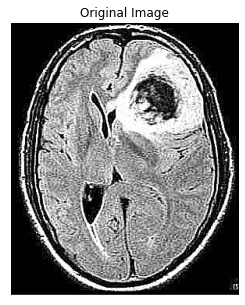

Polygon: {'name': 'ellipse', 'cx': 186, 'cy': 96, 'rx': 34, 'ry': 32.757, 'theta': -0.215}
Invalid polygon format: {'name': 'ellipse', 'cx': 186, 'cy': 96, 'rx': 34, 'ry': 32.757, 'theta': -0.215}
Polygon: {'name': 'polygon', 'all_points_x': [246, 238, 209, 164, 135, 134, 149, 164, 192, 209, 232, 245], 'all_points_y': [123, 134, 143, 145, 125, 97, 84, 50, 36, 40, 68, 100]}


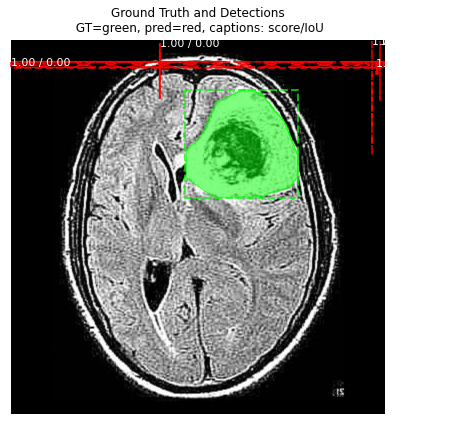

In [11]:
from mrcnn import visualize

ind = 8
display_image(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind)


In [12]:
import skimage.filters as filters
from sklearn.cluster import KMeans

Polygon: {'name': 'polygon', 'all_points_x': [120, 137, 168, 225, 231, 195, 206, 256, 281, 316, 302, 302, 310, 298, 285, 274, 265, 245, 216, 188, 163, 137, 132], 'all_points_y': [205, 230, 236, 239, 245, 290, 298, 254, 231, 198, 166, 143, 130, 83, 85, 101, 107, 68, 70, 93, 119, 156, 186]}


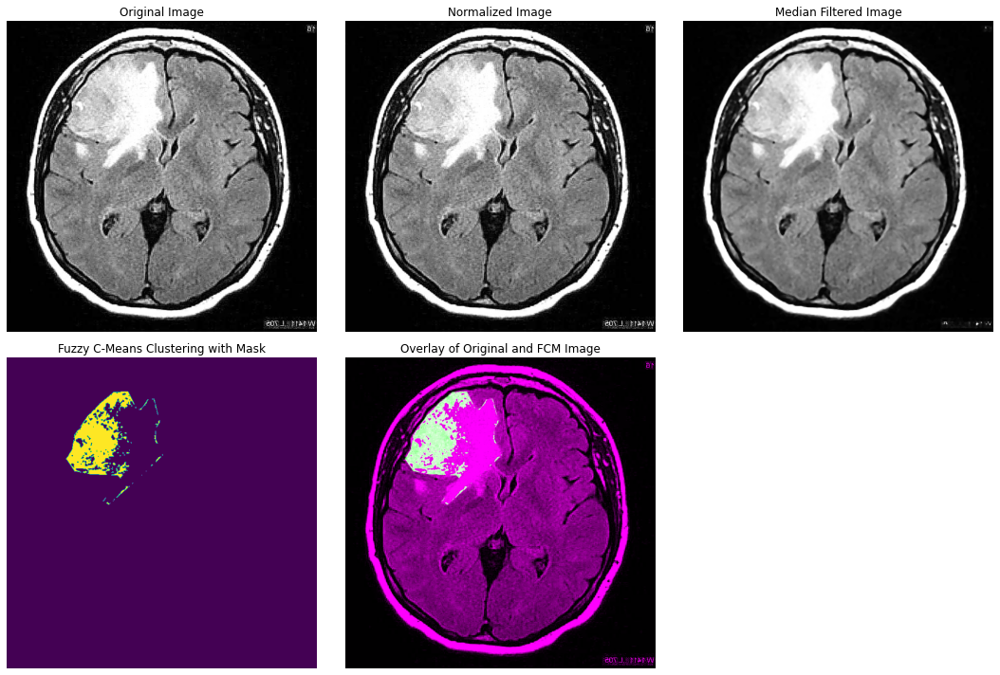

In [13]:
def apply_fuzzy_c_means_mask(image, mask):
    # Get coordinates of non-zero values in the mask
    nonzero_indices = np.transpose(np.nonzero(mask))

    # Extract patches centered at the non-zero mask coordinates
    patch_size = (3, 3)  # Define the patch size
    patches = []
    for y, x in nonzero_indices:
        # Calculate patch boundaries
        y_start = max(0, y - patch_size[0]//2)
        y_end = min(image.shape[0], y + patch_size[0]//2 + 1)
        x_start = max(0, x - patch_size[1]//2)
        x_end = min(image.shape[1], x + patch_size[1]//2 + 1)

        # Extract patch
        patch = image[y_start:y_end, x_start:x_end]
        patches.append(patch.flatten())

    # Convert patches to a 2D array
    patches_flat = np.array(patches)

    # Apply fuzzy c-means clustering (using KMeans here as a proxy)
    fcm = KMeans(n_clusters=2)
    fcm.fit(patches_flat)

    # Reshape labels to the mask shape
    fcm_labels = np.zeros_like(mask, dtype=np.int32)
    for label, (y, x) in zip(fcm.labels_, nonzero_indices):
        fcm_labels[y, x] = label

    return fcm_labels


def predict_and_plot_differences(dataset, img_id):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    visualize.display_differences(
        original_image,
        gt_box, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        class_names=['tumor'], title="", ax=get_ax(),
        show_mask=True, show_box=True)


def display_image(dataset, ind):
    plt.figure(figsize=(5, 5))
    plt.imshow(dataset.load_image(ind))
    plt.xticks([])
    plt.yticks([])
    plt.title('Original Image')
    plt.show()


def process_and_cluster_image(ind):
    # Load the image and mask
    original_image = dataset_val.load_image(ind)
    mask, _ = dataset_val.load_mask(ind)
    mask = mask[:, :, 0]  # Assuming binary mask for simplicity

    # Apply normalization and noise reduction
    normalized_image = original_image.astype(np.float32) / 255.0
    median_filtered_image = ndimage.median_filter(normalized_image, size=5)

    # Apply Fuzzy C-Means Clustering with Mask
    fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, mask)

    # Display results
    plt.figure(figsize=(15, 10))

    # Plot Original Image
    plt.subplot(2, 3, 1)
    plt.imshow(original_image)
    plt.title('Original Image')
    plt.axis('off')

    # Plot Normalized Image
    plt.subplot(2, 3, 2)
    plt.imshow(normalized_image, cmap='gray')
    plt.title('Normalized Image')
    plt.axis('off')

    # Plot Median Filtered Image
    plt.subplot(2, 3, 3)
    plt.imshow(median_filtered_image, cmap='gray')
    plt.title('Median Filtered Image')
    plt.axis('off')

    # Plot Fuzzy C-Means Clustering Image
    plt.subplot(2, 3, 4)
    plt.imshow(fcm_mask_labels, cmap='viridis')
    plt.title('Fuzzy C-Means Clustering with Mask')
    plt.axis('off')

    # Plot Overlay of Original and Fuzzy C-Means Clustering Image
    overlay_image = np.zeros_like(original_image)
    overlay_image[:,:,0] = original_image[:,:,0]
    overlay_image[:,:,1] = fcm_mask_labels * 255
    overlay_image[:,:,2] = original_image[:,:,0]
    plt.subplot(2, 3, 5)
    plt.imshow(overlay_image.astype(np.uint8), cmap="gray")
    plt.title('Overlay of Original and FCM Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


# Example usage
ind = 10
process_and_cluster_image(ind)



Polygon: {'name': 'polygon', 'all_points_x': [120, 137, 168, 225, 231, 195, 206, 256, 281, 316, 302, 302, 310, 298, 285, 274, 265, 245, 216, 188, 163, 137, 132], 'all_points_y': [205, 230, 236, 239, 245, 290, 298, 254, 231, 198, 166, 143, 130, 83, 85, 101, 107, 68, 70, 93, 119, 156, 186]}


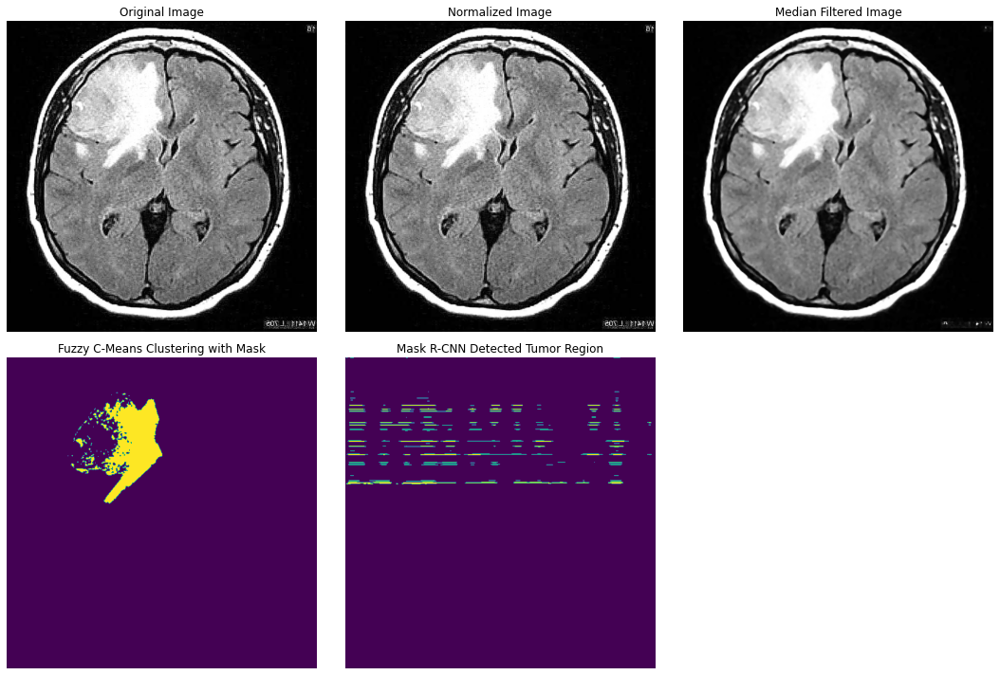

In [14]:
def detect_tumor_region(image):
    # Use Mask R-CNN to detect tumor region
    results = model.detect([image], verbose=0)
    r = results[0]
    masks = r['masks']

    # Combine masks if there are multiple instances
    combined_mask = np.zeros_like(masks[:, :, 0], dtype=bool)
    for i in range(masks.shape[2]):
        combined_mask |= masks[:, :, i]

    return combined_mask

def process_and_cluster_image_with_detection(ind):
    # Load the image and mask
    original_image = dataset_val.load_image(ind)
    mask, _ = dataset_val.load_mask(ind)
    mask = mask[:, :, 0]  # Assuming binary mask for simplicity

    # Apply normalization and noise reduction
    normalized_image = original_image.astype(np.float32) / 255.0
    median_filtered_image = ndimage.median_filter(normalized_image, size=5)

    # Apply Fuzzy C-Means Clustering with Mask
    fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, mask)

    # Detect tumor region using Mask R-CNN
    tumor_mask_rcnn = detect_tumor_region(original_image)

    # Display results
    plt.figure(figsize=(15, 10))

    # Plot Original Image
    plt.subplot(2, 3, 1)
    plt.imshow(original_image)
    plt.title('Original Image')
    plt.axis('off')

    # Plot Normalized Image
    plt.subplot(2, 3, 2)
    plt.imshow(normalized_image, cmap='gray')
    plt.title('Normalized Image')
    plt.axis('off')

    # Plot Median Filtered Image
    plt.subplot(2, 3, 3)
    plt.imshow(median_filtered_image, cmap='gray')
    plt.title('Median Filtered Image')
    plt.axis('off')

    # Plot Fuzzy C-Means Clustering Image
    plt.subplot(2, 3, 4)
    plt.imshow(fcm_mask_labels, cmap='viridis')
    plt.title('Fuzzy C-Means Clustering with Mask')
    plt.axis('off')

    # Plot Mask R-CNN Detected Tumor Region
    plt.subplot(2, 3, 5)
    plt.imshow(tumor_mask_rcnn, cmap='viridis')
    plt.title('Mask R-CNN Detected Tumor Region')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


# Example usage
ind = 10
process_and_cluster_image_with_detection(ind)


In [13]:
# def process_and_cluster_image_with_detection(ind):
#     # Load the image and mask
#     original_image = dataset_val.load_image(ind)
#     mask, _ = dataset_val.load_mask(ind)
#     mask = mask[:, :, 0]  # Assuming binary mask for simplicity

#     # Apply normalization and noise reduction
#     normalized_image = original_image.astype(np.float32) / 255.0
#     median_filtered_image = ndimage.median_filter(normalized_image, size=5)

#     # Apply Fuzzy C-Means Clustering with Mask
#     fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, mask)

#     # Detect tumor region using Mask R-CNN
#     results = model.detect([original_image], verbose=0)
#     r = results[0]

#     # Class names including background
#     class_names = ['BG', 'tumor']

#     # Overlay Mask R-CNN detection on fuzzy C-means clustering result
#     plt.figure(figsize=(15, 10))

#     # Plot Original Image
#     plt.subplot(2, 3, 1)
#     plt.imshow(original_image)
#     plt.title('Original Image')
#     plt.axis('off')

#     # Plot Fuzzy C-Means Clustering Image
#     plt.subplot(2, 3, 2)
#     plt.imshow(fcm_mask_labels, cmap='viridis')
#     plt.title('Fuzzy C-Means Clustering with Mask')
#     plt.axis('off')

#     # Plot Overlay of Fuzzy C-Means Clustering and Mask R-CNN Detection
#     plt.subplot(2, 3, 3)
#     plt.imshow(original_image)
#     plt.imshow(fcm_mask_labels, alpha=0.5, cmap='viridis')
#     visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'],
#                                 class_names, r['scores'], ax=plt.gca(),
#                                 show_mask=False, show_bbox=False)
#     plt.title('Overlay of FCM and Mask R-CNN')
#     plt.axis('off')

#     plt.tight_layout()
#     plt.show()


# # Example usage
# ind = 10
# process_and_cluster_image_with_detection(ind)


Polygon: {'name': 'polygon', 'all_points_x': [120, 137, 168, 225, 231, 195, 206, 256, 281, 316, 302, 302, 310, 298, 285, 274, 265, 245, 216, 188, 163, 137, 132], 'all_points_y': [205, 230, 236, 239, 245, 290, 298, 254, 231, 198, 166, 143, 130, 83, 85, 101, 107, 68, 70, 93, 119, 156, 186]}


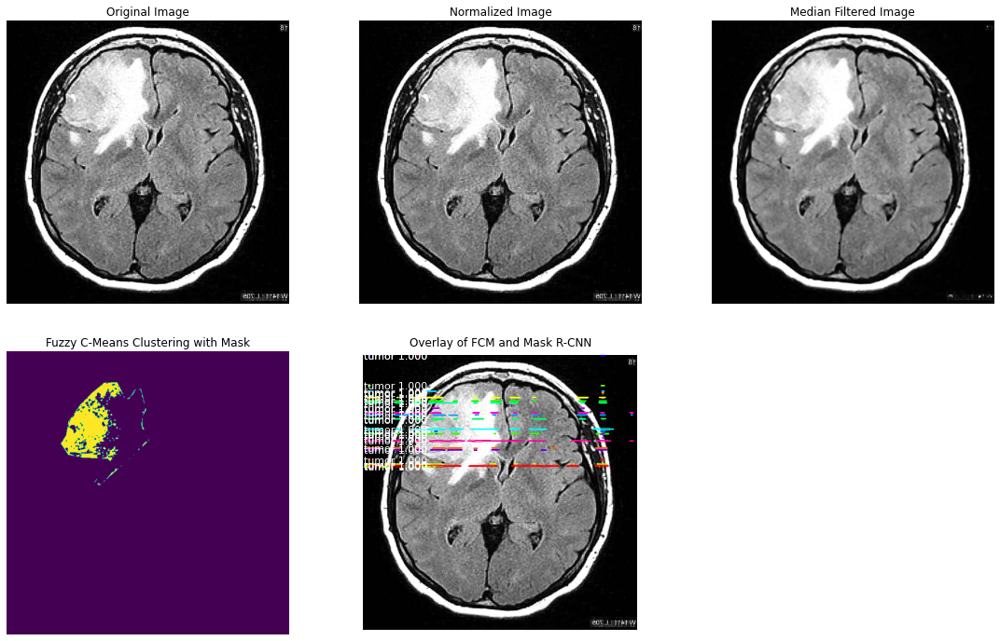

In [22]:
def apply_fuzzy_c_means_mask(image, mask):
    # Get coordinates of non-zero values in the mask
    nonzero_indices = np.transpose(np.nonzero(mask))

    # Extract patches centered at the non-zero mask coordinates
    patch_size = (3, 3)  # Define the patch size
    patches = []
    for y, x in nonzero_indices:
        # Calculate patch boundaries
        y_start = max(0, y - patch_size[0] // 2)
        y_end = min(image.shape[0], y + patch_size[0] // 2 + 1)
        x_start = max(0, x - patch_size[1] // 2)
        x_end = min(image.shape[1], x + patch_size[1] // 2 + 1)

        # Extract patch
        patch = image[y_start:y_end, x_start:x_end]
        patches.append(patch.flatten())

    # Convert patches to a 2D array
    patches_flat = np.array(patches)

    # Apply fuzzy c-means clustering (using KMeans here as a proxy)
    fcm = KMeans(n_clusters=2)
    fcm.fit(patches_flat)

    # Reshape labels to the mask shape
    fcm_labels = np.zeros_like(mask, dtype=np.int32)
    for label, (y, x) in zip(fcm.labels_, nonzero_indices):
        fcm_labels[y, x] = label

    return fcm_labels


def predict_and_plot_differences(dataset, img_id):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    visualize.display_differences(
        original_image,
        gt_box, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        class_names=['BG', 'tumor'], title="", ax=get_ax(),
        show_mask=True, show_box=True)


def display_image(dataset, ind):
    plt.figure(figsize=(5, 5))
    plt.imshow(dataset.load_image(ind))
    plt.xticks([])
    plt.yticks([])
    plt.title('Original Image')
    plt.show()


def process_and_cluster_image_with_detection(ind):
    # Load the image and mask
    original_image = dataset_val.load_image(ind)
    mask, _ = dataset_val.load_mask(ind)
    mask = mask[:, :, 0]  # Assuming binary mask for simplicity

    # Apply normalization and noise reduction
    normalized_image = original_image.astype(np.float32) / 255.0
    median_filtered_image = ndimage.median_filter(normalized_image, size=5)

    # Apply Fuzzy C-Means Clustering with Mask
    fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, mask)

    # Detect tumor region using Mask R-CNN
    results = model.detect([original_image], verbose=0)
    r = results[0]

    # Class names including background
    class_names = ['BG', 'tumor']

    # Overlay Mask R-CNN detection on fuzzy C-means clustering result
    plt.figure(figsize=(15, 10))

    # Plot Original Image
    plt.subplot(2, 3, 1)
    plt.imshow(original_image)
    plt.title('Original Image')
    plt.axis('off')

    # Plot Normalized Image
    plt.subplot(2, 3, 2)
    plt.imshow(normalized_image, cmap='gray')
    plt.title('Normalized Image')
    plt.axis('off')

    # Plot Median Filtered Image
    plt.subplot(2, 3, 3)
    plt.imshow(median_filtered_image, cmap='gray')
    plt.title('Median Filtered Image')
    plt.axis('off')

    # Plot Fuzzy C-Means Clustering Image
    plt.subplot(2, 3, 4)
    plt.imshow(fcm_mask_labels, cmap='viridis')
    plt.title('Fuzzy C-Means Clustering with Mask')
    plt.axis('off')

    # Plot Overlay of Fuzzy C-Means Clustering and Mask R-CNN Detection
    plt.subplot(2, 3, 5)
    # plt.imshow(original_image)
    plt.imshow(fcm_mask_labels, alpha=0.5, cmap='viridis')
    visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'],
                                class_names, r['scores'], ax=plt.gca(),
                                show_mask=False, show_bbox=False)
    plt.title('Overlay of FCM and Mask R-CNN')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


# Example usage
ind = 10
process_and_cluster_image_with_detection(ind)

Polygon: {'name': 'polygon', 'all_points_x': [120, 137, 168, 225, 231, 195, 206, 256, 281, 316, 302, 302, 310, 298, 285, 274, 265, 245, 216, 188, 163, 137, 132], 'all_points_y': [205, 230, 236, 239, 245, 290, 298, 254, 231, 198, 166, 143, 130, 83, 85, 101, 107, 68, 70, 93, 119, 156, 186]}


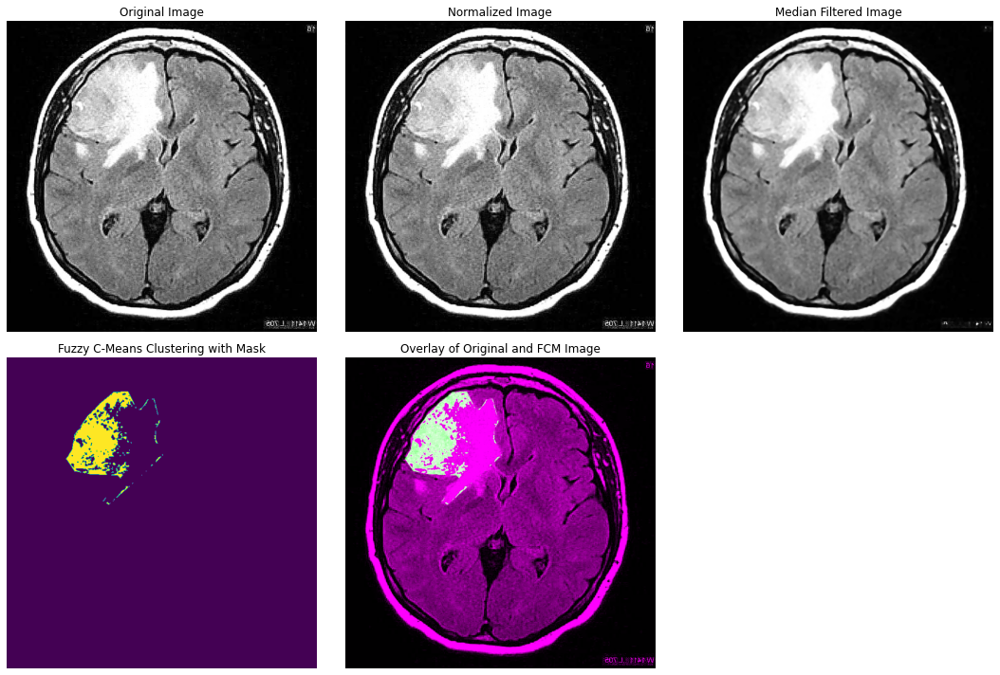

Polygon: {'name': 'polygon', 'all_points_x': [120, 137, 168, 225, 231, 195, 206, 256, 281, 316, 302, 302, 310, 298, 285, 274, 265, 245, 216, 188, 163, 137, 132], 'all_points_y': [205, 230, 236, 239, 245, 290, 298, 254, 231, 198, 166, 143, 130, 83, 85, 101, 107, 68, 70, 93, 119, 156, 186]}


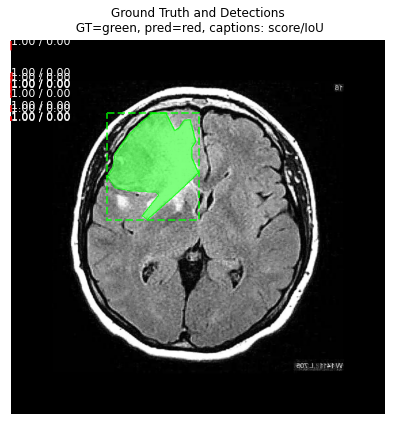

In [22]:
def apply_fuzzy_c_means_mask(image, mask):
    nonzero_indices = np.transpose(np.nonzero(mask))
    patch_size = (3, 3)
    patches = []

    for y, x in nonzero_indices:
        y_start = max(0, y - patch_size[0]//2)
        y_end = min(image.shape[0], y + patch_size[0]//2 + 1)
        x_start = max(0, x - patch_size[1]//2)
        x_end = min(image.shape[1], x + patch_size[1]//2 + 1)

        patch = image[y_start:y_end, x_start:x_end]
        patches.append(patch.flatten())

    patches_flat = np.array(patches)
    fcm = KMeans(n_clusters=2)
    fcm.fit(patches_flat)

    fcm_labels = np.zeros_like(mask, dtype=np.int32)
    for label, (y, x) in zip(fcm.labels_, nonzero_indices):
        fcm_labels[y, x] = label

    return fcm_labels

def predict_and_plot_differences(dataset, img_id, fcm_mask_labels):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    visualize.display_differences(
        original_image,
        gt_box, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        class_names=['tumor'], title="", ax=get_ax(),
        show_mask=True, show_box=True)

def process_and_cluster_image(dataset, ind):
    original_image = dataset.load_image(ind)
    mask, _ = dataset.load_mask(ind)
    mask = mask[:, :, 0]

    normalized_image = original_image.astype(np.float32) / 255.0
    median_filtered_image = ndimage.median_filter(normalized_image, size=5)
    fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, mask)

    plt.figure(figsize=(15, 10))
    plt.subplot(2, 3, 1)
    plt.imshow(original_image)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(normalized_image, cmap='gray')
    plt.title('Normalized Image')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(median_filtered_image, cmap='gray')
    plt.title('Median Filtered Image')
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.imshow(fcm_mask_labels, cmap='viridis')
    plt.title('Fuzzy C-Means Clustering with Mask')
    plt.axis('off')

    overlay_image = np.zeros_like(original_image)
    overlay_image[:,:,0] = original_image[:,:,0]
    overlay_image[:,:,1] = fcm_mask_labels * 255
    overlay_image[:,:,2] = original_image[:,:,0]
    plt.subplot(2, 3, 5)
    plt.imshow(overlay_image.astype(np.uint8), cmap="gray")
    plt.title('Overlay of Original and FCM Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    return fcm_mask_labels

# Example usage
ind = 10
fcm_mask_labels = process_and_cluster_image(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind, fcm_mask_labels)

Polygon: {'name': 'polygon', 'all_points_x': [120, 137, 168, 225, 231, 195, 206, 256, 281, 316, 302, 302, 310, 298, 285, 274, 265, 245, 216, 188, 163, 137, 132], 'all_points_y': [205, 230, 236, 239, 245, 290, 298, 254, 231, 198, 166, 143, 130, 83, 85, 101, 107, 68, 70, 93, 119, 156, 186]}


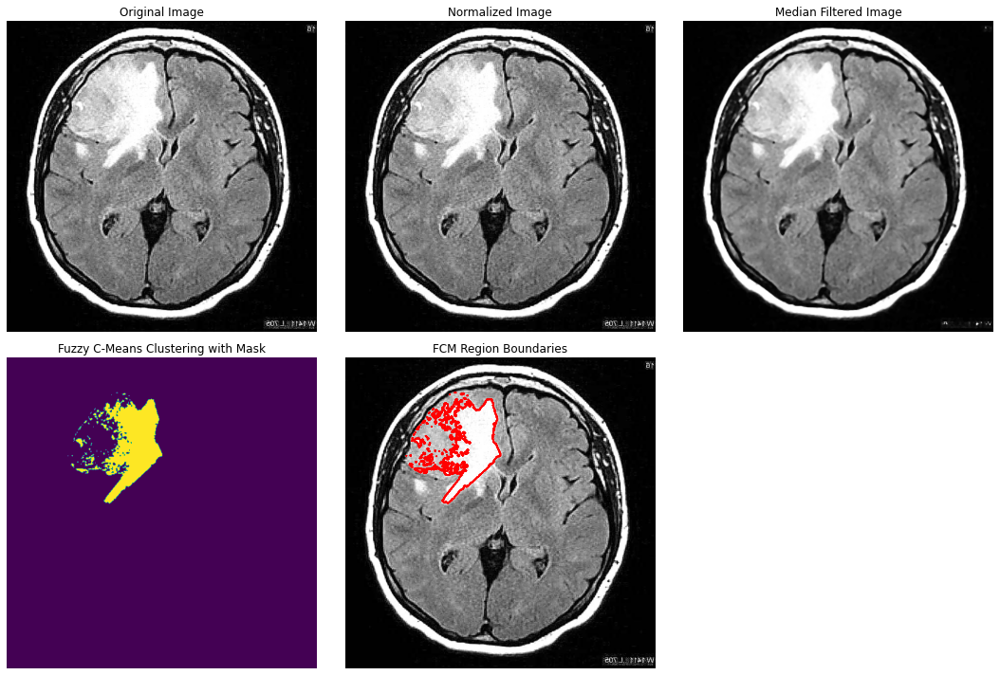

TypeError: predict_and_plot_differences() takes 2 positional arguments but 3 were given

In [15]:
from skimage.segmentation import find_boundaries

def process_and_cluster_image(dataset, ind):
    original_image = dataset.load_image(ind)
    mask, _ = dataset.load_mask(ind)
    mask = mask[:, :, 0]

    normalized_image = original_image.astype(np.float32) / 255.0
    median_filtered_image = ndimage.median_filter(normalized_image, size=5)
    fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, mask)

    # Find boundaries of the regions identified by FCM
    fcm_boundaries = find_boundaries(fcm_mask_labels, mode='inner')

    # Plotting
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 3, 1)
    plt.imshow(original_image)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(normalized_image, cmap='gray')
    plt.title('Normalized Image')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(median_filtered_image, cmap='gray')
    plt.title('Median Filtered Image')
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.imshow(fcm_mask_labels, cmap='viridis')
    plt.title('Fuzzy C-Means Clustering with Mask')
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.imshow(original_image)
    plt.contour(fcm_boundaries, colors='red', linewidths=1)
    plt.title('FCM Region Boundaries')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    return fcm_mask_labels

# Example usage
ind = 10
fcm_mask_labels = process_and_cluster_image(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind, fcm_mask_labels)


In [65]:
def predict_and_plot_differences(dataset, img_id, fcm_mask_labels, fcm_boundaries):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    plt.figure(figsize=(12, 6))
    
    # Plot original image
    plt.subplot(1, 2, 1)
    visualize.display_instances(
        original_image,
        gt_box, gt_mask, gt_class_id,
        dataset.class_names,r['scores'], ax=plt.gca(),
        title="Ground Truth")

    # Overlay FCM boundaries on predicted masks
    plt.subplot(1, 2, 2)
    overlaid_masks = np.zeros_like(r['masks'][:, :, 0])
    for boundary in fcm_boundaries:
        overlaid_masks[boundary[0], boundary[1]] = 1
    
    # Combine masks and boundary masks
    combined_masks = np.logical_or(r['masks'], overlaid_masks[..., None])

    plt.show()


Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}


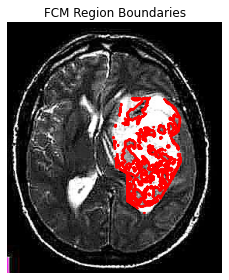

Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}


NameError: name 'overlaid_masks' is not defined

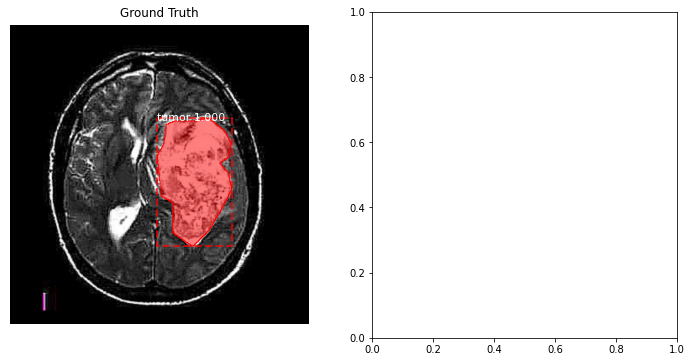

In [67]:


def process_and_cluster_image(dataset, ind):
    original_image = dataset.load_image(ind)
    mask, _ = dataset.load_mask(ind)
    mask = mask[:, :, 0]

    normalized_image = original_image.astype(np.float32) / 255.0
    median_filtered_image = ndimage.median_filter(normalized_image, size=5)
    fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, mask)

    # Find boundaries of the regions identified by FCM
    fcm_boundaries = find_boundaries(fcm_mask_labels, mode='inner')

    # Debugging information and plotting
    print(f"Original Image Shape: {original_image.shape}")
    print(f"Normalized Image Shape: {normalized_image.shape}")
    print(f"Median Filtered Image Shape: {median_filtered_image.shape}")
    print(f"FCM Mask Labels Shape: {fcm_mask_labels.shape}")

    plt.figure(figsize=(15, 10))
    plt.subplot(2, 3, 1)
    plt.imshow(original_image)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(normalized_image, cmap='gray')
    plt.title('Normalized Image')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(median_filtered_image, cmap='gray')
    plt.title('Median Filtered Image')
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.imshow(fcm_mask_labels, cmap='viridis')
    plt.title('Fuzzy C-Means Clustering with Mask')
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.imshow(original_image)
    plt.contour(fcm_boundaries, colors='red', linewidths=1)
    plt.title('FCM Region Boundaries')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    return fcm_mask_labels, fcm_boundaries

# Example usage
ind = 9
fcm_mask_labels, fcm_boundaries = process_and_cluster_image(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind, fcm_mask_labels, fcm_boundaries)


Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}


TypeError: Input z must be 2D, not 3D

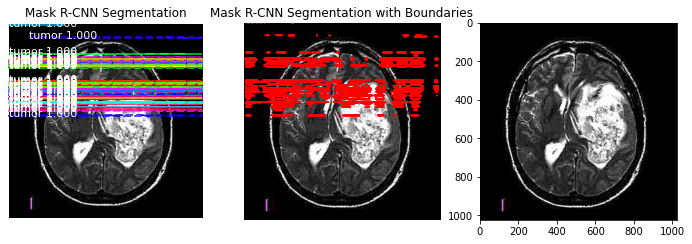

In [75]:
def predict_and_plot_differences(dataset, img_id):
    original_image, _, _, _, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    plt.figure(figsize=(12, 6))
    
    # Plot original image
    plt.subplot(1, 3, 1)
    visualize.display_instances(
        original_image,
        r['rois'], r['masks'], r['class_ids'],
        dataset.class_names, r['scores'], ax=plt.gca(),
        title="Mask R-CNN Segmentation")

    # Find boundaries of the regions identified by Mask R-CNN
    mask_boundaries = np.logical_or.reduce([find_boundaries(r['masks'][:, :, i]) for i in range(r['masks'].shape[-1])])

    # Combine Mask R-CNN masks and boundaries
    combined_masks = np.logical_or(r['masks'], mask_boundaries[..., None])

    # Display the combined masks with boundaries
    plt.subplot(1, 3, 2)
    plt.imshow(original_image)
    plt.contour(mask_boundaries, colors='red', linewidths=1)
    plt.title('Mask R-CNN Segmentation with Boundaries')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(original_image)
    plt.contour(r['masks'], colors='blue', linewidths=1)
    plt.title('Mask R-CNN Segmentation')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Usage
ind = 9
predict_and_plot_differences(dataset_val, ind)


Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}
Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}


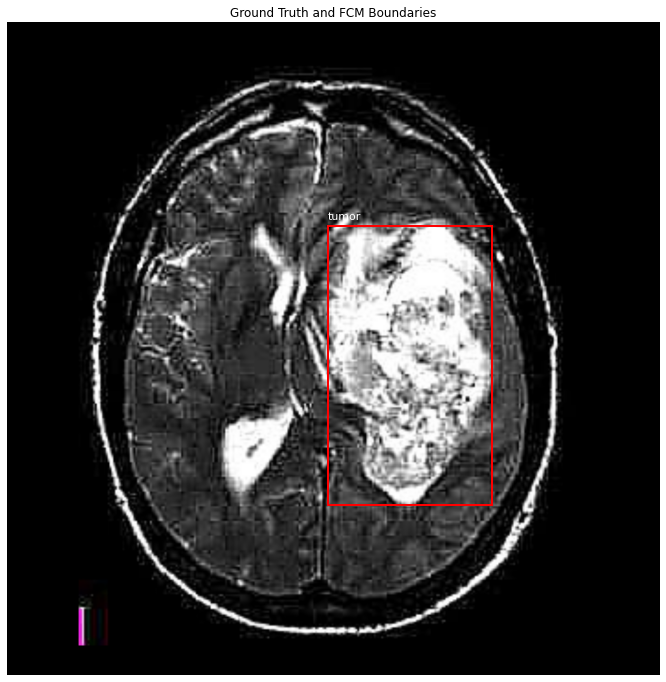

In [49]:
import matplotlib.pyplot as plt
from skimage.segmentation import find_boundaries
import numpy as np
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def display_instances(image, boxes, masks, class_ids, class_names,
                      scores=None, title="",
                      figsize=(16, 16), ax=None,
                      show_mask=True, show_bbox=True,
                      colors=None, captions=None):
    """
    Modified version of display_instances from Mask R-CNN.
    Displays the image, bounding boxes, and masks with different colors.
    """
    # Number of instances
    N = boxes.shape[0]
    if not N:
        print("\n*** No instances to display *** \n")
    else:
        assert boxes.shape[0] == masks.shape[-1] == class_ids.shape[0]

    # Generate random colors
    if colors is None:
        colors = visualize.random_colors(N)

    # If no axis is passed, create one and plot the image
    if not ax:
        _, ax = plt.subplots(1, figsize=figsize)

    # Show the image
    ax.imshow(image.astype(np.uint8))

    # Show bounding boxes
    for i, box in enumerate(boxes):
        if show_bbox:
            color = colors[i]
            ax.add_patch(patches.Rectangle((box[1], box[0]), box[3] - box[1], box[2] - box[0], linewidth=2,
                                           edgecolor=color, facecolor='none'))

        # Add class names and scores
        if not captions:
            class_id = class_ids[i]
            score = scores[i] if scores is not None else None
            label = class_names[class_id]
            caption = "{} {:.2f}".format(label, score) if score else label
        else:
            caption = captions[i]
        ax.text(box[1], box[0] - 10, caption, color='w', size=11, backgroundcolor="none")

    # Show masks
    if show_mask:
        mask = masks[:, :, 0]
        masked_image = image.astype(np.uint32).copy()
        for i in range(N):
            color = colors[i]
            masked_image = visualize.apply_mask(masked_image, mask, color)
        ax.imshow(masked_image.astype(np.uint8))

    # Title
    plt.title(title)
    plt.axis('off')

def process_and_predict_with_fcm(dataset, img_id):
    # Load and preprocess the image
    original_image = dataset.load_image(img_id)
    mask, _ = dataset.load_mask(img_id)
    mask = mask[:, :, 0]

    normalized_image = original_image.astype(np.float32) / 255.0
    median_filtered_image = ndimage.median_filter(normalized_image, size=5)
    fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, mask)

    # Find boundaries of the regions identified by FCM
    fcm_boundaries = find_boundaries(fcm_mask_labels, mode='inner')

    # Load ground truth and predictions
    original_image, image_meta, gt_class_id, gt_box, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    # Visualize ground truth with FCM boundaries
    plt.figure(figsize=(12, 12))
    
    # plt.subplot(2, 1, 1)
    ax = plt.gca()
    display_instances(
        original_image,
        gt_box, np.zeros_like(gt_mask), gt_class_id,  # Pass empty mask for no mask display
        dataset.class_names, ax=ax,
        title="Ground Truth and FCM Boundaries")
    # plt.contour(fcm_boundaries, colors='red', linewidths=1)

    plt.show()

# Example usage
img_id = 9
process_and_predict_with_fcm(dataset_val, img_id)


In [ ]:


def process_and_cluster_image(dataset, ind):
    original_image = dataset.load_image(ind)
    mask, _ = dataset.load_mask(ind)
    mask = mask[:, :, 0]

    normalized_image = original_image.astype(np.float32) / 255.0
    median_filtered_image = ndimage.median_filter(normalized_image, size=5)
    fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, mask)

    # Find boundaries of the regions identified by FCM
    fcm_boundaries = find_boundaries(fcm_mask_labels, mode='inner')

    plt.imshow(original_image)
    plt.contour(fcm_boundaries, colors='red', linewidths=1)
    plt.title('FCM Region Boundaries')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    return fcm_mask_labels, fcm_boundaries

# Example usage
ind = 9
fcm_mask_labels, fcm_boundaries = process_and_cluster_image(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind, fcm_mask_labels, fcm_boundaries)


In [66]:
def process_and_cluster_image(dataset, ind):
    original_image = dataset.load_image(ind)
    mask, _ = dataset.load_mask(ind)
    mask = mask[:, :, 0]

    normalized_image = original_image.astype(np.float32) / 255.0
    median_filtered_image = ndimage.median_filter(normalized_image, size=5)
    fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, mask)

    # Find boundaries of the regions identified by FCM
    fcm_boundaries = find_boundaries(fcm_mask_labels, mode='inner')

    return fcm_boundaries

def predict_and_plot_differences(dataset, img_id, fcm_boundaries):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    plt.figure(figsize=(12, 6))
    
    # Plot original image
    plt.subplot(1, 2, 1)
    visualize.display_instances(
        original_image,
        gt_box, gt_mask, gt_class_id,
        dataset.class_names,r['scores'],ax=plt.gca(),
        title="Ground Truth")

    # Overlay FCM boundaries on predicted masks
    overlaid_masks = np.zeros_like(r['masks'][:, :, 0])
    for boundary in fcm_boundaries:
        overlaid_masks[boundary[0], boundary[1]] = 1
    
    # Combine masks and boundary masks
    combined_masks = np.logical_or(r['masks'], overlaid_masks[..., None])

    plt.show()



# Example usage
ind = 9
fcm_boundaries = process_and_cluster_image(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind, fcm_boundaries)


Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  This is separate from the ipykernel package so we can avoid doing imports until


Masked image shape: (9761, 3)
Masked coords shape: (9761, 2)
Shape of u: (2, 29283)
Expected mask sum: 9761


ValueError: Size mismatch: labels size 29283 does not match mask sum 9761

In [58]:
import skfuzzy as fuzz
from skimage.color import rgb2gray 

In [65]:
def process_and_cluster_image(dataset, ind):
    original_image = dataset.load_image(ind)
    mask, _ = dataset.load_mask(ind)
    mask = mask[:, :, 0]

    normalized_image = original_image.astype(np.float32) / 255.0
    median_filtered_image = ndimage.median_filter(normalized_image, size=5)
    fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, mask)

    # Find boundaries of the regions identified by FCM
    fcm_boundaries = find_boundaries(fcm_mask_labels, mode='inner')

    return fcm_boundaries

def predict_and_plot_differences(dataset, img_id, fcm_boundaries):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    plt.figure(figsize=(12, 6))
    
    # Plot original image
    plt.subplot(1, 2, 1)
    visualize.display_instances(
        original_image,
        gt_box, gt_mask, gt_class_id,
        dataset.class_names,r['scores'],ax=plt.gca(),
        title="Ground Truth")

    # Overlay FCM boundaries on predicted masks
    overlaid_masks = np.zeros_like(r['masks'][:, :, 0])
    for boundary in fcm_boundaries:
        overlaid_masks[boundary[0], boundary[1]] = 1
    
    # Combine masks and boundary masks
    combined_masks = np.logical_or(r['masks'], overlaid_masks[..., None])

    plt.show()



# Example usage
ind = 9
fcm_boundaries = process_and_cluster_image(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind, fcm_boundaries)


Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  This is separate from the ipykernel package so we can avoid doing imports until


Masked image shape: (9761, 3)
Masked coords shape: (9761, 2)
Shape of u: (2, 29283)
Expected mask sum: 9761


ValueError: Size mismatch: labels size 29283 does not match mask sum 9761

In [1]:
import os
import sys
import skimage.io
import numpy as np
import json
import skimage.draw
import matplotlib.pyplot as plt
import ssl
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
import scipy.ndimage as ndimage
import skimage.filters as filters
from mrcnn import visualize
# Root directory of the project
ROOT_DIR = os.path.abspath("D:/Mask_RCNN-master/")
sys.path.append(ROOT_DIR)

# Create directory for logs and trained weights if it doesn't exist
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

ssl._create_default_https_context = ssl._create_unverified_context
sys.path.append(os.path.join(ROOT_DIR, 'samples/coco/'))
plt.rcParams['figure.facecolor'] = 'white'


def get_ax(rows=1, cols=1, size=7):
    _, ax = plt.subplots(rows, cols, figsize=(size * cols, size * rows))
    return ax


# Import Mask RCNN COCO trained weights
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

DATASET_DIR = "D:/Mask_RCNN-master/Br35H-Mask-RCNN/"


class TumorConfig(Config):
    NAME = 'tumor_detector'
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 1  # background + tumor
    DETECTION_MIN_CONFIDENCE = 0.85
    STEPS_PER_EPOCH = 5
    LEARNING_RATE = 0.001


config = TumorConfig()


class BrainScanDataset(utils.Dataset):
    def load_brain_scan(self, dataset_dir, subset):
        self.add_class("tumor", 1, "tumor")
        assert subset in ["TRAIN", "VAL", "TEST"]
        dataset_dir = os.path.join(dataset_dir, subset)
        annotations = json.load(open(os.path.join(DATASET_DIR, subset, 'annotations_' + subset + '.json')))
        annotations = list(annotations.values())
        annotations = [a for a in annotations if a['regions']]
        for a in annotations:
            if type(a['regions']) is dict:
                polygons = [r['shape_attributes'] for r in a['regions'].values()]
            else:
                polygons = [r['shape_attributes'] for r in a['regions']]
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)
            image = image.astype(np.float32) / 255.0
            image = ndimage.median_filter(image, size=3)
            image = filters.unsharp_mask(image, radius=1.0, amount=1.5)
            height, width = image.shape[:2]
            self.add_image(
                "tumor",
                image_id=a['filename'],
                path=image_path,
                width=width,
                height=height,
                polygons=polygons
            )

    def load_mask(self, image_id):
        image_info = self.image_info[image_id]
        if image_info["source"] != "tumor":
            return super(self.__class__, self).load_mask(image_id)
        info = self.image_info[image_id]
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):
            print("Polygon:", p)
            if 'all_points_y' not in p or 'all_points_x' not in p:
                print("Invalid polygon format:", p)
                continue
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            mask[rr, cc, i] = 1
        return mask.astype(np.bool), np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        info = self.image_info[image_id]
        if info["source"] == "tumor":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)

dataset_train = BrainScanDataset()
dataset_train.load_brain_scan(DATASET_DIR, 'TRAIN')
dataset_train.prepare()

dataset_val = BrainScanDataset()
dataset_val.load_brain_scan(DATASET_DIR, 'VAL')
dataset_val.prepare()

model = modellib.MaskRCNN(
    mode='training',
    config=config,
    model_dir=MODEL_DIR
)

model.load_weights(
    COCO_MODEL_PATH,
    by_name=True,
    exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"]
)


Using TensorFlow backend.








Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Instructions for updating:
box_ind is deprecated, use box_indices instead








In [2]:

print("Training network heads")
model.train(
    dataset_train,
    dataset_val,
    learning_rate=config.LEARNING_RATE,
    epochs=1,
    layers='heads'
)
class InferenceConfig(TumorConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1


inference_config = InferenceConfig()


Training network heads

Starting at epoch 0. LR=0.001

Checkpoint Path: D:\Mask_RCNN-master\logs\tumor_detector20240522T0941\mask_rcnn_tumor_detector_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_con

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "






Epoch 1/1
Polygon: {'name': 'ellipse', 'cx': 436, 'cy': 272, 'rx': 55, 'ry': 53, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 436, 'cy': 272, 'rx': 55, 'ry': 53, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [515, 489, 467, 439, 454, 427, 391, 371, 381, 373, 335, 314, 319, 354, 380, 388, 418, 444, 449, 492, 497, 503, 512, 515, 524], 'all_points_y': [220, 220, 210, 209, 187, 177, 178, 203, 231, 253, 271, 299, 333, 358, 379, 403, 375, 387, 403, 402, 372, 343, 315, 277, 250]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/5 [=====>........................] - ETA: 2:47 - loss: 3.1387 - rpn_class_loss: 0.0659 - rpn_bbox_loss: 0.8463 - mrcnn_class_loss: 0.2730 - mrcnn_bbox_loss: 1.2399 - mrcnn_mask_loss: 0.7136Polygon: {'name': 'polygon', 'all_points_x': [184, 176, 168, 165, 165, 163, 172, 185, 197, 210, 215, 216, 209, 201, 195, 189], 'all_points_y': [47, 54, 64, 69, 77, 91, 107, 109, 105, 103, 93, 83, 72, 61, 56, 51]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2/5 [===========>..................] - ETA: 1:55 - loss: 4.4639 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.5457 - mrcnn_class_loss: 0.1856 - mrcnn_bbox_loss: 1.1533 - mrcnn_mask_loss: 0.5247Polygon: {'name': 'ellipse', 'cx': 102, 'cy': 284, 'rx': 40.05, 'ry': 38, 'theta': 3.092}
Invalid polygon format: {'name': 'ellipse', 'cx': 102, 'cy': 284, 'rx': 40.05, 'ry': 38, 'theta': 3.092}
Polygon: {'name': 'polygon', 'all_points_x': [50, 51, 57, 76, 100, 127, 141, 144, 143, 138, 123, 103, 88, 70, 63, 57], 'all_points_y': [280, 260, 246, 230, 224, 227, 239, 259, 283, 302, 318, 327, 328, 314, 301, 290]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3/5 [=================>............] - ETA: 1:14 - loss: 3.9284 - rpn_class_loss: 0.0437 - rpn_bbox_loss: 2.1237 - mrcnn_class_loss: 0.1475 - mrcnn_bbox_loss: 0.9498 - mrcnn_mask_loss: 0.6637Polygon: {'name': 'polygon', 'all_points_x': [38, 61, 76, 74, 61, 43, 32, 25, 25, 34], 'all_points_y': [158, 158, 170, 193, 211, 218, 215, 196, 179, 172]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4/5 [=======================>......] - ETA: 36s - loss: 3.5406 - rpn_class_loss: 0.0351 - rpn_bbox_loss: 1.8132 - mrcnn_class_loss: 0.1868 - mrcnn_bbox_loss: 0.9164 - mrcnn_mask_loss: 0.5892 Polygon: {'name': 'polygon', 'all_points_x': [29, 48, 64, 77, 90, 101, 111, 113, 113, 106, 98, 90, 75, 61, 55, 47, 45, 39, 35, 30], 'all_points_y': [152, 148, 151, 156, 165, 177, 188, 200, 215, 225, 233, 243, 252, 256, 257, 245, 228, 213, 189, 166]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [360, 369, 358, 306, 277, 279, 245, 240, 220, 216, 192, 162, 164, 169, 159, 185, 219, 237, 239, 258, 262, 289, 306, 316], 'all_points_y': [178, 232, 244, 249, 277, 310, 319, 294, 288, 302, 306, 281, 242, 231, 211, 176, 198, 203, 178, 156, 133, 117, 141, 166]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 152, 'cy': 92, 'rx': 25, 'ry': 28, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 152, 'cy': 92, 'rx': 25, 'ry': 28, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 186, 'cy': 96, 'rx': 34, 'ry': 32.757, 'theta': -0.215}
Invalid polygon format: {'name': 'ellipse', 'cx': 186, 'cy': 96, 'rx': 34, 'ry': 32.757, 'theta': -0.215}
Polygon: {'name': 'polygon', 'all_points_x': [246, 238, 209, 164, 135, 134, 149, 164, 192, 209, 232, 245], 'all_points_y': [123, 134, 143, 145, 125, 97, 84, 50, 36, 40, 68, 100]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 310, 'cy': 302, 'rx': 52.498, 'ry': 73, 'theta': 2.437}
Invalid polygon format: {'name': 'ellipse', 'cx': 310, 'cy': 302, 'rx': 52.498, 'ry': 73, 'theta': 2.437}
Polygon: {'name': 'ellipse', 'cx': 107, 'cy': 97, 'rx': 32, 'ry': 32, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 107, 'cy': 97, 'rx': 32, 'ry': 32, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [44, 71, 127, 149, 167, 140, 128, 103, 75, 57, 47], 'all_points_y': [125, 143, 143, 137, 101, 81, 49, 33, 45, 75, 97]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [34, 49, 71, 89, 103, 130, 136, 116, 97, 85, 63, 50, 37], 'all_points_y': [140, 158, 171, 174, 166, 122, 106, 68, 49, 42, 63, 94, 123]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [252, 224, 204, 203, 179, 155, 135, 125, 130, 129, 149, 157, 171, 199, 213, 227, 241], 'all_points_y': [174, 189, 196, 209, 203, 199, 174, 142, 115, 93, 70, 53, 50, 50, 67, 92, 129]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [323, 271, 248, 260, 267, 261, 273, 280, 296, 327, 347, 315], 'all_points_y': [264, 244, 261, 303, 312, 380, 389, 363, 347, 301, 288, 275]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [143, 163, 171, 176, 145, 129, 132, 119, 117, 127], 'all_points_y': [34, 61, 65, 87, 116, 115, 105, 97, 59, 34]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [134, 136, 116, 109, 91, 82, 70, 93, 118], 'all_points_y': [19, 64, 72, 88, 88, 59, 37, 16, 14]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 164, 'cy': 161, 'rx': 42.45, 'ry': 33, 'theta': 0.752}
Invalid polygon format: {'name': 'ellipse', 'cx': 164, 'cy': 161, 'rx': 42.45, 'ry': 33, 'theta': 0.752}
Polygon: {'name': 'polygon', 'all_points_x': [181, 162, 126, 97, 82, 77, 100, 122, 151, 168, 177], 'all_points_y': [102, 128, 159, 144, 104, 88, 43, 29, 39, 62, 81]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 73, 'cy': 163, 'rx': 20, 'ry': 24, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 73, 'cy': 163, 'rx': 20, 'ry': 24, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 51, 'cy': 139, 'rx': 9, 'ry': 10, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 51, 'cy': 139, 'rx': 9, 'ry': 10, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [25, 38, 42, 61, 79, 93, 88, 63, 43, 31, 25], 'all_points_y': [181, 178, 193, 195, 188, 166, 143, 126, 114, 128, 151]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [89, 95, 94, 83, 71, 70, 53, 60, 73, 77, 67, 69, 78], 'all_points_y': [88, 103, 132, 165, 163, 148, 137, 127, 126, 121, 115, 99, 89]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 249, 'cy': 179, 'rx': 32.985, 'ry': 44, 'theta': -0.245}
Invalid polygon format: {'name': 'ellipse', 'cx': 249, 'cy': 179, 'rx': 32.985, 'ry': 44, 'theta': -0.245}
Polygon: {'name': 'polygon', 'all_points_x': [259, 233, 194, 216, 205, 146, 159, 151, 159, 164, 175, 191, 220, 244], 'all_points_y': [112, 127, 129, 158, 161, 101, 88, 66, 43, 42, 56, 27, 48, 74]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 205, 'cy': 91, 'rx': 25, 'ry': 30, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 205, 'cy': 91, 'rx': 25, 'ry': 30, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [182, 163, 139, 132, 139, 150, 165, 174, 191, 193, 181, 179], 'all_points_y': [75, 67, 83, 111, 123, 125, 143, 142, 129, 119, 103, 87]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [183, 195, 204, 212, 204, 174, 147, 125, 139, 138, 107, 118, 145], 'all_points_y': [450, 440, 407, 402, 359, 333, 323, 335, 339, 345, 361, 396, 428]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [100, 83, 54, 35, 31, 38, 53, 69, 92, 100, 92, 92, 98], 'all_points_y': [95, 86, 87, 115, 130, 151, 169, 179, 171, 157, 148, 132, 128]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 224, 'cy': 214, 'rx': 35, 'ry': 38, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 224, 'cy': 214, 'rx': 35, 'ry': 38, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [47, 66, 100, 105, 100, 100, 106, 96, 75, 58, 17, 17, 23, 28, 38], 'all_points_y': [132, 139, 141, 159, 182, 198, 206, 219, 219, 210, 178, 169, 162, 149, 146]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [25, 44, 66, 82, 92, 90, 81, 57, 40, 28, 25, 27], 'all_points_y': [187, 175, 177, 189, 205, 225, 246, 249, 246, 245, 226, 210]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [235, 212, 193, 178, 156, 159, 176, 180, 182, 202, 222, 238, 247, 245, 223, 224], 'all_points_y': [229, 215, 209, 187, 213, 249, 275, 309, 321, 316, 302, 287, 265, 254, 237, 229]}
Polygon: {'name': 'ellipse', 'cx': 205, 'cy': 270, 'rx': 29.275, 'ry': 41, 'theta': -0.137}
Invalid polygon format: {'name': 'ellipse', 'cx': 205, 'cy': 270, 'rx': 29.275, 'ry': 41, 'theta': -0.137}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [224, 193, 182, 166, 151, 135, 130, 102, 93, 100, 141, 158, 158, 179, 186, 198, 201, 220, 238, 235, 241, 235], 'all_points_y': [123, 142, 114, 90, 84, 109, 118, 122, 161, 172, 175, 194, 217, 225, 207, 203, 214, 213, 197, 163, 146, 132]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [116, 128, 121, 114, 53, 62, 72, 84, 84, 103, 113], 'all_points_y': [151, 159, 211, 215, 196, 145, 143, 153, 166, 167, 161]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 72, 'cy': 137, 'rx': 16, 'ry': 15, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 72, 'cy': 137, 'rx': 16, 'ry': 15, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 40, 'cy': 119, 'rx': 15, 'ry': 13, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 40, 'cy': 119, 'rx': 15, 'ry': 13, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 295, 'cy': 292, 'rx': 36, 'ry': 31.064, 'theta': 0.064}
Invalid polygon format: {'name': 'ellipse', 'cx': 295, 'cy': 292, 'rx': 36, 'ry': 31.064, 'theta': 0.064}
Polygon: {'name': 'ellipse', 'cx': 202, 'cy': 180, 'rx': 35, 'ry': 45, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 202, 'cy': 180, 'rx': 35, 'ry': 45, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [253, 215, 195, 195, 171, 169, 156, 152, 129, 113, 119, 111, 133, 165, 169, 167, 183, 184, 199, 213, 219, 248, 257], 'all_points_y': [168, 172, 193, 215, 224, 211, 201, 212, 211, 192, 164, 145, 124, 143, 133, 115, 113, 

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [150, 143, 126, 110, 94, 87, 92, 103, 115, 124, 138, 148], 'all_points_y': [150, 130, 122, 122, 131, 145, 157, 161, 158, 168, 165, 156]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [439, 505, 577, 603, 574, 530, 454, 435, 444, 429, 422, 406, 387, 404, 441], 'all_points_y': [551, 555, 599, 665, 728, 757, 769, 742, 710, 682, 644, 636, 606, 578, 565]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [181, 162, 158, 165, 178, 185, 189], 'all_points_y': [75, 98, 111, 117, 111, 99, 87]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [240, 214, 192, 189, 143, 106, 120, 119, 146, 179, 201, 217, 230], 'all_points_y': [178, 185, 194, 206, 197, 141, 121, 91, 56, 69, 68, 103, 136]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [96, 167, 168, 146, 115, 99, 87, 69, 79, 74, 77], 'all_points_y': [179, 203, 240, 297, 305, 293, 285, 247, 231, 217, 195]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 164, 'cy': 124, 'rx': 54, 'ry': 42.012, 'theta': -3.118}
Invalid polygon format: {'name': 'ellipse', 'cx': 164, 'cy': 124, 'rx': 54, 'ry': 42.012, 'theta': -3.118}
Polygon: {'name': 'ellipse', 'cx': 126, 'cy': 110, 'rx': 33.333, 'ry': 33.333, 'theta': 3.142}
Invalid polygon format: {'name': 'ellipse', 'cx': 126, 'cy': 110, 'rx': 33.333, 'ry': 33.333, 'theta': 3.142}
Polygon: {'name': 'polygon', 'all_points_x': [443, 428, 401, 383, 378, 377, 408, 447, 456, 450, 464, 466, 445], 'all_points_y': [222, 200, 200, 229, 270, 299, 304, 296, 275, 246, 236, 220, 223]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [193, 175, 155, 141, 136, 149, 171, 187, 219, 238, 233, 217, 209], 'all_points_y': [41, 49, 65, 93, 109, 129, 143, 173, 163, 141, 112, 77, 61]}
Polygon: {'name': 'ellipse', 'cx': 118, 'cy': 195, 'rx': 17, 'ry': 17, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 118, 'cy': 195, 'rx': 17, 'ry': 17, 'theta': 0}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 72, 'cy': 125, 'rx': 20.667, 'ry': 20, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 72, 'cy': 125, 'rx': 20.667, 'ry': 20, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 183, 'cy': 138, 'rx': 17, 'ry': 13, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 183, 'cy': 138, 'rx': 17, 'ry': 13, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 205, 'cy': 118, 'rx': 12, 'ry': 12, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 205, 'cy': 118, 'rx': 12, 'ry': 12, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [404, 371, 384, 371, 349, 317, 298, 299, 309, 315, 327, 365, 394, 403], 'all_points_y': [359, 341, 333, 323, 327, 348, 388, 404, 409, 435, 450, 431, 399, 375]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [141, 125, 108, 95, 102, 107, 124, 134, 143, 142, 144], 'all_points_y': [106, 103, 99, 113, 136, 156, 168, 169, 153, 129, 117]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 128, 'cy': 84, 'rx': 46.69, 'ry': 59, 'theta': -0.172}
Invalid polygon format: {'name': 'ellipse', 'cx': 128, 'cy': 84, 'rx': 46.69, 'ry': 59, 'theta': -0.172}
Polygon: {'name': 'polygon', 'all_points_x': [49, 69, 67, 53, 31, 40], 'all_points_y': [232, 211, 196, 190, 197, 215]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 185, 'cy': 171, 'rx': 19, 'ry': 28.97, 'theta': 0.371}
Invalid polygon format: {'name': 'ellipse', 'cx': 185, 'cy': 171, 'rx': 19, 'ry': 28.97, 'theta': 0.371}
Polygon: {'name': 'polygon', 'all_points_x': [204, 184, 177, 162, 150, 142, 146, 152, 173, 177, 197, 206, 212, 217, 214, 210], 'all_points_y': [112, 116, 120, 121, 144, 172, 199, 218, 233, 225, 229, 227, 207, 187, 161, 130]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 124, 'cy': 225, 'rx': 25, 'ry': 24, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 124, 'cy': 225, 'rx': 25, 'ry': 24, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 516, 'cy': 696, 'rx': 37, 'ry': 41, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 516, 'cy': 696, 'rx': 37, 'ry': 41, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [202, 184, 177, 159, 149, 140, 144, 151, 172, 174, 197, 217, 216, 216, 211], 'all_points_y': [112, 116, 120, 120, 142, 159, 191, 217, 234, 225, 230, 206, 173, 156, 133]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [196, 177, 168, 181, 217, 237, 233, 216], 'all_points_y': [131, 153, 200, 220, 225, 193, 149, 149]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 116, 'cy': 101, 'rx': 19, 'ry': 16, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 116, 'cy': 101, 'rx': 19, 'ry': 16, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [153, 131, 102, 96, 103, 109, 102, 106, 128, 124, 154, 158], 'all_points_y': [88, 88, 90, 102, 128, 133, 155, 170, 154, 121, 116, 105]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 173, 'cy': 134, 'rx': 29.333, 'ry': 32.007, 'theta': 0.021}
Invalid polygon format: {'name': 'ellipse', 'cx': 173, 'cy': 134, 'rx': 29.333, 'ry': 32.007, 'theta': 0.021}
Polygon: {'name': 'ellipse', 'cx': 227, 'cy': 223, 'rx': 40, 'ry': 52, 'theta': 3.142}
Invalid polygon format: {'name': 'ellipse', 'cx': 227, 'cy': 223, 'rx': 40, 'ry': 52, 'theta': 3.142}
Polygon: {'name': 'polygon', 'all_points_x': [110, 75, 69, 50, 54, 49, 59, 79, 98, 107, 115], 'all_points_y': [137, 124, 117, 140, 159, 167, 193, 211, 207, 188, 161]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 348, 'cy': 244, 'rx': 35, 'ry': 37.054, 'theta': -0.054}
Invalid polygon format: {'name': 'ellipse', 'cx': 348, 'cy': 244, 'rx': 35, 'ry': 37.054, 'theta': -0.054}
Polygon: {'name': 'ellipse', 'cx': 110, 'cy': 335, 'rx': 58.181, 'ry': 74, 'theta': -2.64}
Invalid polygon format: {'name': 'ellipse', 'cx': 110, 'cy': 335, 'rx': 58.181, 'ry': 74, 'theta': -2.64}
Polygon: {'name': 'polygon', 'all_points_x': [330, 311, 271, 258, 240, 246, 212, 200, 190, 143, 134, 145, 199, 225, 226, 259, 262, 285, 288, 316, 344, 341, 331, 346, 340], 'all_points_y': [188, 179, 196, 168, 156, 134, 121, 134, 161, 180, 230, 245, 248, 275, 311, 318, 297, 287, 304, 304, 281, 241, 231, 211, 199]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [108, 83, 71, 74, 86, 107, 120, 108, 100, 103, 114], 'all_points_y': [208, 206, 220, 256, 287, 292, 286, 258, 252, 230, 221]}
Polygon: {'name': 'ellipse', 'cx': 130, 'cy': 199, 'rx': 18, 'ry': 19, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 130, 'cy': 199, 'rx': 18, 'ry': 19, 'theta': 0}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [319, 264, 237, 245, 269, 320, 327, 312, 322], 'all_points_y': [153, 142, 150, 190, 207, 207, 197, 170, 160]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 369, 'cy': 634, 'rx': 44.503, 'ry': 42.277, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 369, 'cy': 634, 'rx': 44.503, 'ry': 42.277, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [999, 930, 854, 828, 770, 732, 712, 761, 826, 881, 952, 990, 970, 995, 1004], 'all_points_y': [289, 254, 256, 303, 300, 332, 412, 485, 534, 547, 501, 427, 409, 360, 327]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [67, 83, 92, 102, 102, 90, 80, 67, 51, 44, 47, 55], 'all_points_y': [244, 239, 215, 182, 149, 136, 140, 134, 145, 164, 206, 226]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 184, 'cy': 174, 'rx': 19, 'ry': 22, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 184, 'cy': 174, 'rx': 19, 'ry': 22, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [203, 177, 158, 140, 145, 155, 171, 176, 195, 214, 214], 'all_points_y': [111, 120, 120, 166, 202, 221, 233, 225, 229, 203, 162]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [148, 131, 119, 133, 141, 154, 175, 184, 178, 177], 'all_points_y': [100, 112, 151, 181, 204, 204, 169, 162, 140, 117]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 67, 'cy': 131, 'rx': 32.028, 'ry': 41.333, 'theta': 3.1}
Invalid polygon format: {'name': 'ellipse', 'cx': 67, 'cy': 131, 'rx': 32.028, 'ry': 41.333, 'theta': 3.1}
Polygon: {'name': 'ellipse', 'cx': 606, 'cy': 699, 'rx': 98.937, 'ry': 112.428, 'theta': -2.498}
Invalid polygon format: {'name': 'ellipse', 'cx': 606, 'cy': 699, 'rx': 98.937, 'ry': 112.428, 'theta': -2.498}
Polygon: {'name': 'ellipse', 'cx': 113, 'cy': 119, 'rx': 41, 'ry': 53, 'theta': 3.142}
Invalid polygon format: {'name': 'ellipse', 'cx': 113, 'cy': 119, 'rx': 41, 'ry': 53, 'theta': 3.142}
Polygon: {'name': 'polygon', 'all_points_x': [141, 122, 108, 96, 102, 113, 130, 142, 142], 'all_points_y': [104, 105, 99, 112, 139, 157, 170, 162, 136]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [129, 156, 140, 120, 123, 98, 67, 52, 59, 57, 83, 105], 'all_points_y': [94, 148, 187, 195, 226, 249, 213, 178, 149, 116, 94, 96]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 202, 'cy': 195, 'rx': 22, 'ry': 22, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 202, 'cy': 195, 'rx': 22, 'ry': 22, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [237, 209, 177, 138, 131, 140, 149, 173, 195, 213, 224], 'all_points_y': [143, 169, 173, 161, 121, 65, 41, 32, 49, 71, 104]}
Polygon: {'name': 'ellipse', 'cx': 116, 'cy': 196, 'rx': 17.333, 'ry': 16, 'theta': -3.142}
Invalid polygon format: {'name': 'ellipse', 'cx': 116, 'cy': 196, 'rx': 17.333, 'ry': 16, 'theta': -3.142}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 182, 'cy': 184, 'rx': 25.08, 'ry': 31, 'theta': 0.08}
Invalid polygon format: {'name': 'ellipse', 'cx': 182, 'cy': 184, 'rx': 25.08, 'ry': 31, 'theta': 0.08}
Polygon: {'name': 'ellipse', 'cx': 398, 'cy': 698, 'rx': 35.095, 'ry': 45.354, 'theta': -0.363}
Invalid polygon format: {'name': 'ellipse', 'cx': 398, 'cy': 698, 'rx': 35.095, 'ry': 45.354, 'theta': -0.363}
Polygon: {'name': 'polygon', 'all_points_x': [161, 143, 76, 72, 87, 71, 158, 165, 156], 'all_points_y': [180, 163, 160, 174, 194, 221, 224, 213, 203]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [69, 100, 128, 129, 96, 57, 69], 'all_points_y': [137, 137, 159, 200, 203, 187, 156]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [29, 48, 66, 90, 113, 114, 91, 76, 53, 40, 32], 'all_points_y': [176, 181, 179, 162, 144, 115, 90, 79, 72, 118, 153]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [115, 139, 154, 165, 165, 170, 163, 149, 131, 91, 92, 63, 41, 49, 61, 66, 77, 91, 97], 'all_points_y': [39, 56, 78, 98, 119, 139, 165, 188, 201, 208, 197, 187, 174, 145, 112, 92, 73, 58, 48]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5/5 [==============================] - 768s 154s/step - loss: 3.1627 - rpn_class_loss: 0.0286 - rpn_bbox_loss: 1.5140 - mrcnn_class_loss: 0.1624 - mrcnn_bbox_loss: 0.8768 - mrcnn_mask_loss: 0.5809 - val_loss: 3.5757 - val_rpn_class_loss: 0.0179 - val_rpn_bbox_loss: 2.1204 - val_mrcnn_class_loss: 0.0912 - val_mrcnn_bbox_loss: 0.8054 - val_mrcnn_mask_loss: 0.5407



In [3]:
import skimage.filters as filters
from sklearn.cluster import KMeans


def predict_and_plot_differences(dataset, img_id):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    visualize.display_differences(
        original_image,
        gt_box, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        class_names=['BG', 'tumor'], title="", ax=get_ax(),
        show_mask=True, show_box=True)


def display_image(dataset, ind):
    plt.figure(figsize=(5, 5))
    plt.imshow(dataset.load_image(ind))
    plt.xticks([])
    plt.yticks([])
    plt.title('Original Image')
    plt.show()



In [4]:
def predict_and_plot_differences(dataset, img_id, fcm_mask_labels, fcm_boundaries):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    plt.figure(figsize=(12, 6))
    
    # Plot original image
    plt.subplot(1, 2, 1)
    visualize.display_instances(
        original_image,
        gt_box, gt_mask, gt_class_id,
        dataset.class_names, ax=plt.gca(),
        title="Ground Truth")

    # Overlay FCM boundaries on predicted masks
    plt.subplot(1, 2, 2)
    overlaid_masks = np.zeros_like(r['masks'][:, :, 0])
    for boundary in fcm_boundaries:
        overlaid_masks[boundary[0], boundary[1]] = 1
    
    # Combine masks and boundary masks
    combined_masks = np.logical_or(r['masks'], overlaid_masks[..., None])

    visualize.display_instances(
        original_image,
        r['rois'], combined_masks, r['class_ids'],
        dataset.class_names, r['scores'], ax=plt.gca(),
        title="Predictions with FCM Boundaries",
        show_mask=True)

    plt.show()
    

def process_and_cluster_image(dataset, ind):
    original_image = dataset.load_image(ind)
    mask, _ = dataset.load_mask(ind)
    mask = mask[:, :, 0]

    normalized_image = original_image.astype(np.float32) / 255.0
    median_filtered_image = ndimage.median_filter(normalized_image, size=5)
    fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, mask)

    # Find boundaries of the regions identified by FCM
    fcm_boundaries = find_boundaries(fcm_mask_labels, mode='inner')

    # Debugging information and plotting
    print(f"Original Image Shape: {original_image.shape}")
    print(f"Normalized Image Shape: {normalized_image.shape}")
    print(f"Median Filtered Image Shape: {median_filtered_image.shape}")
    print(f"FCM Mask Labels Shape: {fcm_mask_labels.shape}")

    plt.figure(figsize=(15, 10))
    plt.subplot(2, 3, 1)
    plt.imshow(original_image)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(normalized_image, cmap='gray')
    plt.title('Normalized Image')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(median_filtered_image, cmap='gray')
    plt.title('Median Filtered Image')
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.imshow(fcm_mask_labels, cmap='viridis')
    plt.title('Fuzzy C-Means Clustering with Mask')
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.imshow(original_image)
    plt.contour(fcm_boundaries, colors='red', linewidths=1)
    plt.title('FCM Region Boundaries')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    return fcm_mask_labels, fcm_boundaries

# Example usage
ind = 9
fcm_mask_labels, fcm_boundaries = process_and_cluster_image(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind, fcm_mask_labels, fcm_boundaries)



Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}


NameError: name 'apply_fuzzy_c_means_mask' is not defined

Polygon: {'name': 'polygon', 'all_points_x': [37, 61, 84, 87, 127, 148, 161, 163, 159, 158, 132, 105, 93, 78, 62, 55, 44], 'all_points_y': [173, 183, 197, 205, 202, 183, 150, 126, 113, 90, 55, 63, 77, 64, 90, 117, 147]}


AssertionError: Create model in inference mode.

In [6]:
def predict_and_plot_differences(dataset, img_id):
    original_image, _, _, _, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    plt.figure(figsize=(12, 6))
    
    # Plot original image
    plt.subplot(1, 3, 1)
    visualize.display_instances(
        original_image,
        r['rois'], r['masks'], r['class_ids'],
        dataset.class_names, r['scores'], ax=plt.gca(),
        title="Mask R-CNN Segmentation")

    # Find boundaries of the regions identified by Mask R-CNN
    mask_boundaries = np.logical_or.reduce([find_boundaries(r['masks'][:, :, i]) for i in range(r['masks'].shape[-1])])

    # Combine Mask R-CNN masks and boundaries
    combined_masks = np.logical_or(r['masks'], mask_boundaries[..., None])

    # Display the combined masks with boundaries
    plt.subplot(1, 3, 2)
    plt.imshow(original_image)
    plt.contour(mask_boundaries, colors='red', linewidths=1)
    plt.title('Mask R-CNN Segmentation with Boundaries')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(original_image)
    plt.contour(r['masks'], colors='blue', linewidths=1)
    plt.title('Mask R-CNN Segmentation')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Usage
ind = 9
predict_and_plot_differences(dataset_val, ind)


Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}


AssertionError: Create model in inference mode.

In [ ]:
import os
import sys
import json
import ssl
import skimage.io
import numpy as np
import matplotlib.pyplot as plt
import scipy.ndimage as ndimage
import skimage.filters as filters
import skimage.draw
import skfuzzy as fuzz
from skimage import measure, color

# Mask R-CNN imports
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize

# Root directory of the project
ROOT_DIR = os.path.abspath("D:/Mask_RCNN-master/")
sys.path.append(ROOT_DIR)

# Create directory for logs and trained weights if it doesn't exist
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

ssl._create_default_https_context = ssl._create_unverified_context
sys.path.append(os.path.join(ROOT_DIR, 'samples/coco/'))
plt.rcParams['figure.facecolor'] = 'white'

def get_ax(rows=1, cols=1, size=7):
    _, ax = plt.subplots(rows, cols, figsize=(size * cols, size * rows))
    return ax

COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

DATASET_DIR = "D:/Mask_RCNN-master/Br35H-Mask-RCNN/"

class TumorConfig(Config):
    NAME = 'tumor_detector'
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 1  # background + tumor
    DETECTION_MIN_CONFIDENCE = 0.85
    STEPS_PER_EPOCH = 5
    LEARNING_RATE = 0.001

config = TumorConfig()

class BrainScanDataset(utils.Dataset):
    def load_brain_scan(self, dataset_dir, subset):
        self.add_class("tumor", 1, "tumor")
        assert subset in ["TRAIN", "VAL", "TEST"]
        dataset_dir = os.path.join(dataset_dir, subset)
        annotations = json.load(open(os.path.join(DATASET_DIR, subset, 'annotations_' + subset + '.json')))
        annotations = list(annotations.values())
        annotations = [a for a in annotations if a['regions']]
        for a in annotations:
            if type(a['regions']) is dict:
                polygons = [r['shape_attributes'] for r in a['regions'].values()]
            else:
                polygons = [r['shape_attributes'] for r in a['regions']]
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)

            # Apply preprocessing steps
            original_image = image.copy()
            image = image.astype(np.float32) / 255.0  # Normalize
            normalized_image = image.copy()
            image = ndimage.median_filter(image, size=3)  # Median filter
            median_filtered_image = image.copy()
            image = self.apply_fcm(image)  # Apply FCM
            fcm_image = image.copy()
            boundaries_image = self.find_boundaries(image)  # Find boundaries
            segmented_image = filters.unsharp_mask(image, radius=1.0, amount=1.5)  # Unsharp masking

            height, width = image.shape[:2]
            self.add_image(
                "tumor",
                image_id=a['filename'],
                path=image_path,
                width=width,
                height=height,
                polygons=polygons,
                original_image=original_image,
                normalized_image=normalized_image,
                median_filtered_image=median_filtered_image,
                fcm_image=fcm_image,
                boundaries_image=boundaries_image,
                segmented_image=segmented_image
            )

    def apply_fcm(self, image):
        # Reshape the image for FCM
        image_reshaped = image.reshape((-1, 1))
        # Apply FCM
        cntr, u, _, _, _, _, _ = fuzz.cluster.cmeans(image_reshaped.T, 2, 2, error=0.005, maxiter=1000, init=None)
        # Get the fuzzy membership values for each pixel
        cluster_membership = np.argmax(u, axis=0)
        # Reshape back to the original image shape
        segmented_image = cluster_membership.reshape(image.shape)
        return segmented_image

    def find_boundaries(self, image):
        boundaries = measure.find_contours(image, 0.5)
        return boundaries

    def load_mask(self, image_id):
        image_info = self.image_info[image_id]
        if image_info["source"] != "tumor":
            return super(self.__class__, self).load_mask(image_id)
        info = self.image_info[image_id]
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):
            if 'all_points_y' not in p or 'all_points_x' not in p:
                continue
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            mask[rr, cc, i] = 1
        return mask.astype(np.bool), np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        info = self.image_info[image_id]
        if info["source"] == "tumor":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)

# Load datasets
dataset_train = BrainScanDataset()
dataset_train.load_brain_scan(DATASET_DIR, 'TRAIN')
dataset_train.prepare()

dataset_val = BrainScanDataset()
dataset_val.load_brain_scan(DATASET_DIR, 'VAL')
dataset_val.prepare()

# Initialize and load model
model = modellib.MaskRCNN(
    mode='training',
    config=config,
    model_dir=MODEL_DIR
)

model.load_weights(
    COCO_MODEL_PATH,
    by_name=True,
    exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"]
)
print("Training network heads")
model.train(
    dataset_train,
    dataset_val,
    learning_rate=config.LEARNING_RATE,
    epochs=1,
    layers='heads'
)

# Predict and plot differences
def predict_and_plot_differences(dataset, img_id):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    visualize.display_differences(
        original_image,
        gt_box, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        class_names=['tumor'], title="", ax=get_ax(),
        show_mask=True, show_box=True)

# Display preprocessing steps and Mask R-CNN results
def display_preprocessing_steps(dataset, ind):
    image_info = dataset.image_info[ind]
    original_image = image_info['original_image']
    normalized_image = image_info['normalized_image']
    median_filtered_image = image_info['median_filtered_image']
    fcm_image = image_info['fcm_image']
    boundaries_image = image_info['boundaries_image']
    segmented_image = image_info['segmented_image']

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes[0, 0].imshow(original_image)
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')

    axes[0, 1].imshow(normalized_image, cmap='gray')
    axes[0, 1].set_title('Normalized Image')
    axes[0, 1].axis('off')

    axes[0, 2].imshow(median_filtered_image, cmap='gray')
    axes[0, 2].set_title('Median Filtered Image')
    axes[0, 2].axis('off')

    axes[1, 0].imshow(fcm_image, cmap='gray')
    axes[1, 0].set_title('FCM Image')
    axes[1, 0].axis('off')

    axes[1, 1].imshow(boundaries_image, cmap='gray')
    axes[1, 1].set_title('Boundaries Image')
    axes[1, 1].axis('off')

    axes[1, 2].imshow(segmented_image, cmap='gray')
    axes[1, 2].set_title('Segmented Image')
    axes[1, 2].axis('off')

    plt.show()

# Example usage
ind = 8
display_preprocessing_steps(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind)


In [31]:
import os
import sys
import skimage.io
import numpy as np
import json
import skimage.draw
import matplotlib.pyplot as plt
import ssl
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
import scipy.ndimage as ndimage
import skimage.filters as filters
from mrcnn import visualize
from mrcnn import visualize
# Root directory of the project
ROOT_DIR = os.path.abspath("D:/Mask_RCNN-master/")
sys.path.append(ROOT_DIR)

# Create directory for logs and trained weights if it doesn't exist
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

ssl._create_default_https_context = ssl._create_unverified_context
sys.path.append(os.path.join(ROOT_DIR, 'samples/coco/'))
plt.rcParams['figure.facecolor'] = 'white'


def get_ax(rows=1, cols=1, size=7):
    _, ax = plt.subplots(rows, cols, figsize=(size * cols, size * rows))
    return ax


# Import Mask RCNN COCO trained weights
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

DATASET_DIR = "D:/Mask_RCNN-master/Br35H-Mask-RCNN/"


class TumorConfig(Config):
    NAME = 'tumor_detector'
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 1  # background + tumor
    DETECTION_MIN_CONFIDENCE = 0.85
    STEPS_PER_EPOCH = 5
    LEARNING_RATE = 0.001


config = TumorConfig()


class BrainScanDataset(utils.Dataset):
    def load_brain_scan(self, dataset_dir, subset):
        self.add_class("tumor", 1, "tumor")
        assert subset in ["TRAIN", "VAL", "TEST"]
        dataset_dir = os.path.join(dataset_dir, subset)
        annotations = json.load(open(os.path.join(DATASET_DIR, subset, 'annotations_' + subset + '.json')))
        annotations = list(annotations.values())
        annotations = [a for a in annotations if a['regions']]
        for a in annotations:
            if type(a['regions']) is dict:
                polygons = [r['shape_attributes'] for r in a['regions'].values()]
            else:
                polygons = [r['shape_attributes'] for r in a['regions']]
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)
            image = image.astype(np.float32) / 255.0
            image = ndimage.median_filter(image, size=3)
            image = filters.unsharp_mask(image, radius=1.0, amount=1.5)
            height, width = image.shape[:2]
            self.add_image(
                "tumor",
                image_id=a['filename'],
                path=image_path,
                width=width,
                height=height,
                polygons=polygons
            )

    def load_mask(self, image_id):
        image_info = self.image_info[image_id]
        if image_info["source"] != "tumor":
            return super(self.__class__, self).load_mask(image_id)
        info = self.image_info[image_id]
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):
            print("Polygon:", p)
            if 'all_points_y' not in p or 'all_points_x' not in p:
                print("Invalid polygon format:", p)
                continue
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            mask[rr, cc, i] = 1
        return mask.astype(np.bool), np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        info = self.image_info[image_id]
        if info["source"] == "tumor":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)


In [32]:

# Load datasets
dataset_train = BrainScanDataset()
dataset_train.load_brain_scan(DATASET_DIR, 'TRAIN')
dataset_train.prepare()

dataset_val = BrainScanDataset()
dataset_val.load_brain_scan(DATASET_DIR, 'VAL')
dataset_val.prepare()



FileNotFoundError: No such file: 'D:\Mask_RCNN-master\Br35H-Mask-RCNN\TRAIN\TRAIN\y0.jpg'

In [1]:
import os
import sys
import skimage.io
import numpy as np
import json
import skimage.draw
import matplotlib.pyplot as plt
import ssl
from sklearn.cluster import KMeans
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
import scipy.ndimage as ndimage
import skimage.filters as filters
from mrcnn import visualize
from mrcnn import visualize
# Root directory of the project
ROOT_DIR = os.path.abspath("D:/Mask_RCNN-master/")
sys.path.append(ROOT_DIR)

# Create directory for logs and trained weights if it doesn't exist
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

ssl._create_default_https_context = ssl._create_unverified_context
sys.path.append(os.path.join(ROOT_DIR, 'samples/coco/'))
plt.rcParams['figure.facecolor'] = 'white'


def get_ax(rows=1, cols=1, size=7):
    _, ax = plt.subplots(rows, cols, figsize=(size * cols, size * rows))
    return ax


# Import Mask RCNN COCO trained weights
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

DATASET_DIR = "D:/Mask_RCNN-master/Br35H-Mask-RCNN/"


class TumorConfig(Config):
    NAME = 'tumor_detector'
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 1  # background + tumor
    DETECTION_MIN_CONFIDENCE = 0.85
    STEPS_PER_EPOCH = 5
    LEARNING_RATE = 0.001


config = TumorConfig()


class BrainScanDataset(utils.Dataset):
    def load_brain_scan(self, dataset_dir, subset):
        self.add_class("tumor", 1, "tumor")
        assert subset in ["TRAIN", "VAL", "TEST"]
        dataset_dir = os.path.join(dataset_dir, subset)
        annotations = json.load(open(os.path.join(DATASET_DIR, subset, 'annotations_' + subset + '.json')))
        annotations = list(annotations.values())
        annotations = [a for a in annotations if a['regions']]
        for a in annotations:
            if type(a['regions']) is dict:
                polygons = [r['shape_attributes'] for r in a['regions'].values()]
            else:
                polygons = [r['shape_attributes'] for r in a['regions']]
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)
            image = image.astype(np.float32) / 255.0
            image = ndimage.median_filter(image, size=3)
            image = filters.unsharp_mask(image, radius=1.0, amount=1.5)
            height, width = image.shape[:2]
            self.add_image(
                "tumor",
                image_id=a['filename'],
                path=image_path,
                width=width,
                height=height,
                polygons=polygons
            )

    def load_mask(self, image_id):
        image_info = self.image_info[image_id]
        if image_info["source"] != "tumor":
            return super(self.__class__, self).load_mask(image_id)
        info = self.image_info[image_id]
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):
            print("Polygon:", p)
            if 'all_points_y' not in p or 'all_points_x' not in p:
                print("Invalid polygon format:", p)
                continue
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            mask[rr, cc, i] = 1
        return mask.astype(np.bool), np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        info = self.image_info[image_id]
        if info["source"] == "tumor":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)


Using TensorFlow backend.


In [2]:

dataset_train = BrainScanDataset()
dataset_train.load_brain_scan(DATASET_DIR, 'TRAIN')
dataset_train.prepare()

dataset_val = BrainScanDataset()
dataset_val.load_brain_scan(DATASET_DIR, 'VAL')
dataset_val.prepare()


D:/Mask_RCNN-master/Br35H-Mask-RCNN/VAL\y509.jpg
Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}


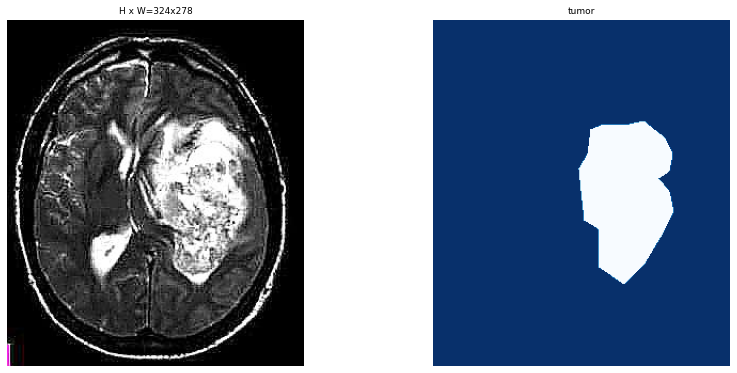

In [28]:
print(dataset_val.image_reference(9))
image = dataset_val.load_image(9)
mask, class_ids = dataset_val.load_mask(9)
visualize.display_top_masks(image, mask, class_ids, dataset_val.class_names, limit=1)

D:/Mask_RCNN-master/Br35H-Mask-RCNN/VAL\y540.jpg
Polygon: {'name': 'polygon', 'all_points_x': [224, 193, 182, 166, 151, 135, 130, 102, 93, 100, 141, 158, 158, 179, 186, 198, 201, 220, 238, 235, 241, 235], 'all_points_y': [123, 142, 114, 90, 84, 109, 118, 122, 161, 172, 175, 194, 217, 225, 207, 203, 214, 213, 197, 163, 146, 132]}


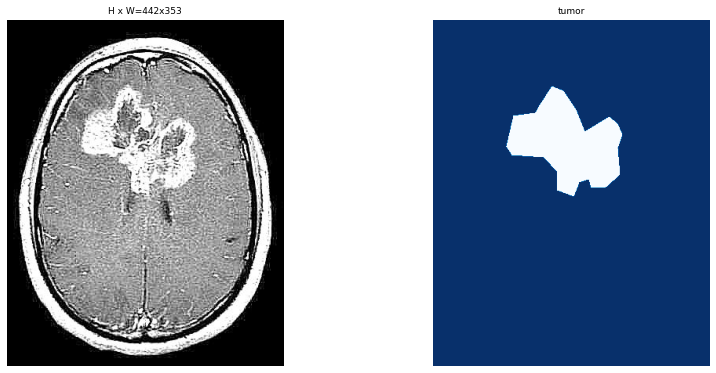

In [25]:
print(dataset_val.image_reference(40))
image = dataset_val.load_image(40)
mask, class_ids = dataset_val.load_mask(40)
visualize.display_top_masks(image, mask, class_ids, dataset_val.class_names, limit=1)

D:/Mask_RCNN-master/Br35H-Mask-RCNN/VAL\y510.jpg
Polygon: {'name': 'polygon', 'all_points_x': [120, 137, 168, 225, 231, 195, 206, 256, 281, 316, 302, 302, 310, 298, 285, 274, 265, 245, 216, 188, 163, 137, 132], 'all_points_y': [205, 230, 236, 239, 245, 290, 298, 254, 231, 198, 166, 143, 130, 83, 85, 101, 107, 68, 70, 93, 119, 156, 186]}


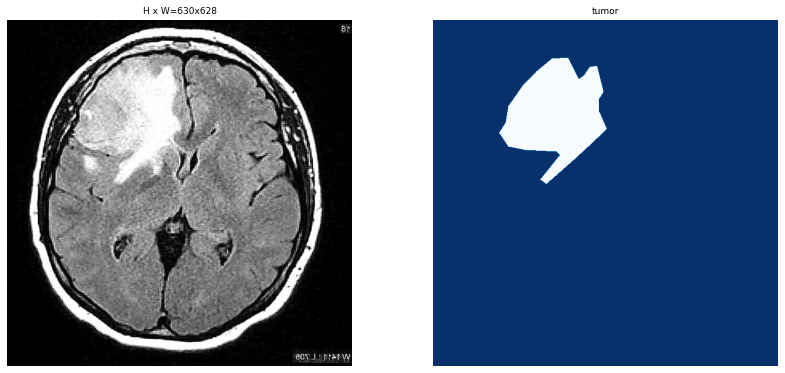

In [29]:
print(dataset_val.image_reference(10))
image = dataset_val.load_image(10)
mask, class_ids = dataset_val.load_mask(10)
visualize.display_top_masks(image, mask, class_ids, dataset_val.class_names, limit=1)

D:/Mask_RCNN-master/Br35H-Mask-RCNN/VAL\y506.jpg
Polygon: {'name': 'polygon', 'all_points_x': [249, 227, 216, 211, 192, 159, 151, 165, 163, 142, 135, 139, 169, 195, 196, 203, 205, 224, 227, 235, 245], 'all_points_y': [172, 189, 202, 230, 253, 232, 207, 195, 177, 154, 144, 121, 98, 102, 131, 133, 118, 115, 127, 129, 148]}


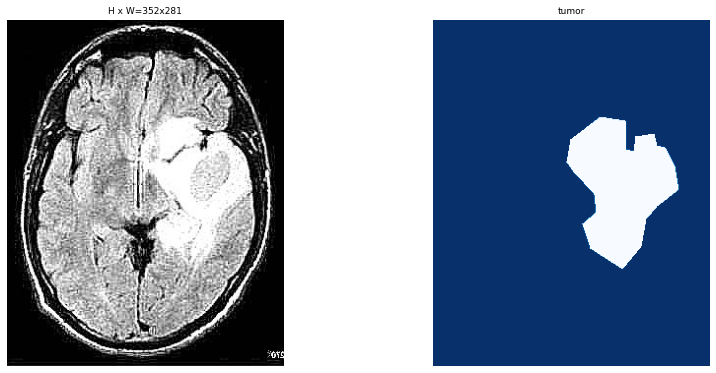

In [36]:
print(dataset_val.image_reference(6))
image = dataset_val.load_image(6)
mask, class_ids = dataset_val.load_mask(6)
visualize.display_top_masks(image, mask, class_ids, dataset_val.class_names, limit=1)

D:/Mask_RCNN-master/Br35H-Mask-RCNN/VAL\y551.jpg
Polygon: {'name': 'polygon', 'all_points_x': [430, 363, 309, 269, 264, 293, 340, 375, 410, 428, 420, 435, 437, 463, 476, 459], 'all_points_y': [551, 549, 580, 623, 676, 728, 754, 761, 767, 746, 707, 683, 652, 635, 605, 576]}


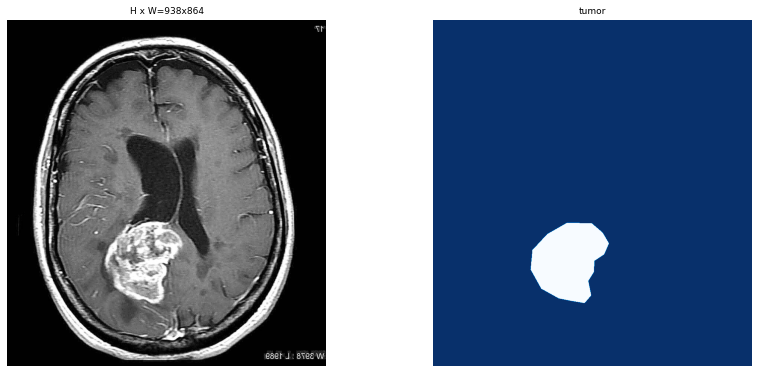

In [32]:
print(dataset_val.image_reference(51))
image = dataset_val.load_image(51)
mask, class_ids = dataset_val.load_mask(51)
visualize.display_top_masks(image, mask, class_ids, dataset_val.class_names, limit=1)

D:/Mask_RCNN-master/Br35H-Mask-RCNN/TRAIN\y78.jpg
Polygon: {'name': 'polygon', 'all_points_x': [185, 176, 165, 149, 129, 129, 132, 139, 150, 159, 166, 175, 181, 184], 'all_points_y': [153, 143, 136, 136, 143, 159, 175, 185, 193, 193, 186, 178, 173, 164]}


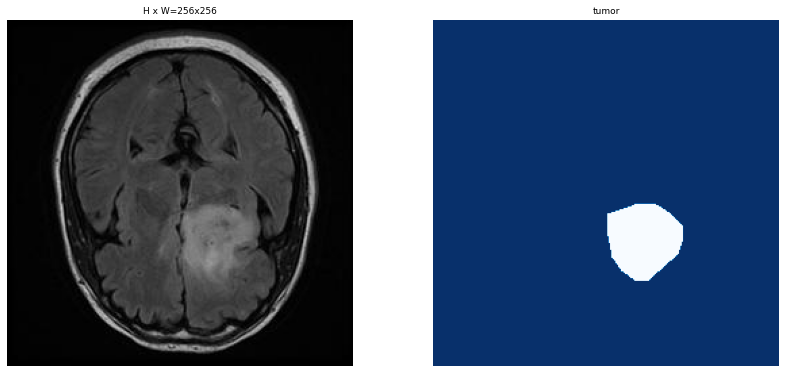

In [38]:
print(dataset_train.image_reference(78))
image = dataset_train.load_image(78)
mask, class_ids = dataset_train.load_mask(78)
visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names, limit=1)
    

D:/Mask_RCNN-master/Br35H-Mask-RCNN/TRAIN\y14.jpg
Polygon: {'name': 'polygon', 'all_points_x': [166, 164, 158, 151, 145, 148, 152, 157, 154, 151, 150, 149, 153, 159, 161, 162, 175, 184, 186, 188, 187, 187, 189, 188, 186, 185, 183, 182, 181, 179, 174, 168], 'all_points_y': [60, 68, 73, 73, 78, 81, 82, 81, 86, 91, 97, 105, 110, 112, 114, 117, 121, 122, 120, 115, 111, 106, 100, 96, 90, 85, 80, 76, 72, 65, 62, 59]}


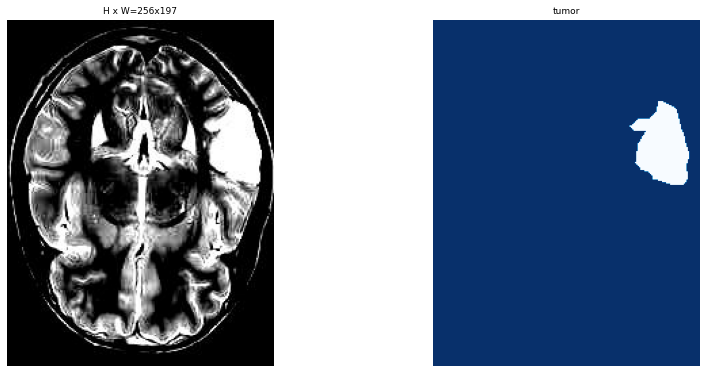

In [33]:
print(dataset_train.image_reference(14))
image = dataset_train.load_image(14)
mask, class_ids = dataset_train.load_mask(14)
visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names, limit=1)
    

D:/Mask_RCNN-master/Br35H-Mask-RCNN/TRAIN\y113.jpg
Polygon: {'name': 'polygon', 'all_points_x': [261, 255, 241, 226, 212, 200, 195, 191, 188, 188, 194, 203, 206, 222, 237, 236, 246, 255, 257, 259, 262], 'all_points_y': [155, 150, 148, 143, 140, 138, 143, 158, 171, 187, 199, 197, 182, 181, 187, 198, 206, 203, 186, 168, 156]}


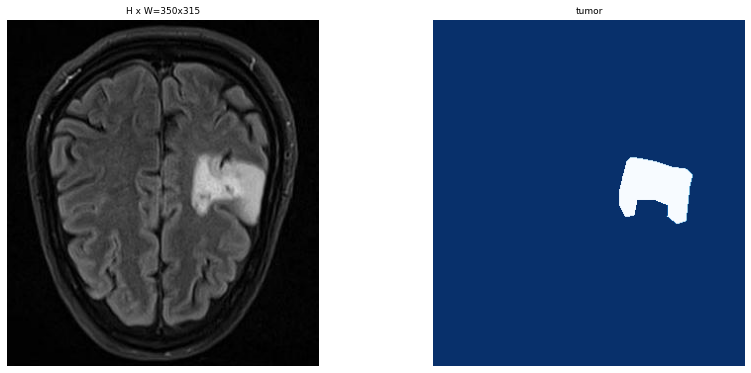

In [35]:
print(dataset_train.image_reference(113))
image = dataset_train.load_image(113)
mask, class_ids = dataset_train.load_mask(113)
visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names, limit=1)
    

D:/Mask_RCNN-master/Br35H-Mask-RCNN/TRAIN\y181.jpg
Polygon: {'name': 'polygon', 'all_points_x': [509, 488, 459, 433, 406, 387, 375, 374, 375, 388, 395, 421, 440, 459, 477, 492, 496, 495, 508], 'all_points_y': [417, 402, 392, 388, 394, 401, 426, 439, 458, 472, 496, 503, 522, 521, 497, 473, 459, 444, 428]}


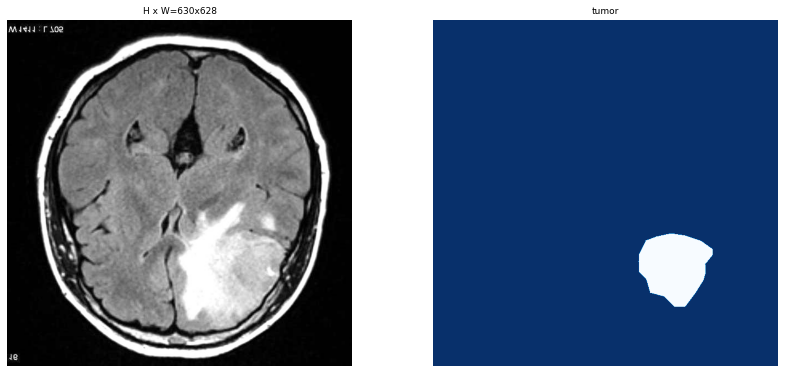

In [36]:
print(dataset_train.image_reference(181))
image = dataset_train.load_image(181)
mask, class_ids = dataset_train.load_mask(181)
visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names, limit=1)
    

In [ ]:
# # Display images and masks
# image_ids = [6, 38, 78, 14, 113, 181]

# for image_id in image_ids:
#     print(dataset_train.image_reference(image_id))
#     image = dataset_train.load_image(image_id)

In [ ]:
#     mask, class_ids = dataset_train.load_mask(image_id)
#     visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names, limit=1)

In [3]:
model = modellib.MaskRCNN(
    mode='training',
    config=config,
    model_dir=MODEL_DIR
)

model.load_weights(
    COCO_MODEL_PATH,
    by_name=True,
    exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"]
)







Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Instructions for updating:
box_ind is deprecated, use box_indices instead








In [4]:
history = model.train(
    dataset_train,
    dataset_val,
    learning_rate=config.LEARNING_RATE,
    epochs=1,
    layers='heads',
)


Starting at epoch 0. LR=0.001

Checkpoint Path: D:\Mask_RCNN-master\logs\tumor_detector20240603T0924\mask_rcnn_tumor_detector_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistribut

C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "






Epoch 1/1
Polygon: {'name': 'polygon', 'all_points_x': [29, 39, 49, 63, 77, 85, 95, 103, 103, 98, 94, 87, 79, 69, 53, 41, 32, 27, 25, 23, 23, 25], 'all_points_y': [103, 97, 93, 92, 99, 107, 111, 122, 137, 149, 155, 162, 172, 177, 180, 178, 179, 173, 164, 152, 137, 123]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1/5 [=====>........................] - ETA: 2:32 - loss: 3.6549 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.5925 - mrcnn_class_loss: 0.6534 - mrcnn_bbox_loss: 1.2680 - mrcnn_mask_loss: 1.1344Polygon: {'name': 'ellipse', 'cx': 101, 'cy': 339, 'rx': 51, 'ry': 62.394, 'theta': 3.029}
Invalid polygon format: {'name': 'ellipse', 'cx': 101, 'cy': 339, 'rx': 51, 'ry': 62.394, 'theta': 3.029}
Polygon: {'name': 'ellipse', 'cx': 231, 'cy': 122, 'rx': 37, 'ry': 51.01, 'theta': -0.02}
Invalid polygon format: {'name': 'ellipse', 'cx': 231, 'cy': 122, 'rx': 37, 'ry': 51.01, 'theta': -0.02}
Polygon: {'name': 'polygon', 'all_points_x': [193, 179, 160, 153, 160, 158, 168, 188, 193, 205, 199], 'all_points_y': [98, 104, 105, 120, 143, 161, 170, 160, 141, 118, 104]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2/5 [===========>..................] - ETA: 1:48 - loss: 3.4545 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.4887 - mrcnn_class_loss: 0.5183 - mrcnn_bbox_loss: 1.3737 - mrcnn_mask_loss: 1.0688Polygon: {'name': 'polygon', 'all_points_x': [27, 36, 57, 75, 74, 64, 58, 42, 28], 'all_points_y': [180, 163, 157, 169, 191, 202, 213, 217, 193]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3/5 [=================>............] - ETA: 1:09 - loss: 4.5595 - rpn_class_loss: 0.0120 - rpn_bbox_loss: 2.5514 - mrcnn_class_loss: 0.3678 - mrcnn_bbox_loss: 0.9158 - mrcnn_mask_loss: 0.7125Polygon: {'name': 'polygon', 'all_points_x': [118, 103, 86, 79, 73, 73, 82, 96, 110, 120, 132, 147, 146, 126, 124, 113], 'all_points_y': [48, 43, 53, 74, 90, 121, 129, 131, 132, 119, 116, 121, 89, 83, 53, 47]}
Polygon: {'name': 'ellipse', 'cx': 127, 'cy': 139, 'rx': 15, 'ry': 19.416, 'theta': 0.207}
Invalid polygon format: {'name': 'ellipse', 'cx': 127, 'cy': 139, 'rx': 15, 'ry': 19.416, 'theta': 0.207}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4/5 [=======================>......] - ETA: 34s - loss: 4.1430 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 2.1736 - mrcnn_class_loss: 0.2932 - mrcnn_bbox_loss: 0.9278 - mrcnn_mask_loss: 0.7381 Polygon: {'name': 'polygon', 'all_points_x': [258, 227, 227, 194, 146, 137, 144, 174, 188, 206, 222, 245, 243, 262, 263, 287, 308, 332, 343, 333, 342, 341, 324, 289, 286, 268, 258], 'all_points_y': [313, 319, 353, 380, 386, 414, 452, 463, 463, 501, 512, 491, 471, 465, 438, 434, 450, 442, 417, 396, 371, 352, 327, 325, 338, 336, 328]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 186, 'cy': 96, 'rx': 34, 'ry': 32.757, 'theta': -0.215}
Invalid polygon format: {'name': 'ellipse', 'cx': 186, 'cy': 96, 'rx': 34, 'ry': 32.757, 'theta': -0.215}
Polygon: {'name': 'polygon', 'all_points_x': [246, 238, 209, 164, 135, 134, 149, 164, 192, 209, 232, 245], 'all_points_y': [123, 134, 143, 145, 125, 97, 84, 50, 36, 40, 68, 100]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 219, 'cy': 125, 'rx': 21, 'ry': 19, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 219, 'cy': 125, 'rx': 21, 'ry': 19, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 202, 'cy': 194, 'rx': 24, 'ry': 23.259, 'theta': -2.697}
Invalid polygon format: {'name': 'ellipse', 'cx': 202, 'cy': 194, 'rx': 24, 'ry': 23.259, 'theta': -2.697}
Polygon: {'name': 'polygon', 'all_points_x': [34, 49, 71, 89, 103, 130, 136, 116, 97, 85, 63, 50, 37], 'all_points_y': [140, 158, 171, 174, 166, 122, 106, 68, 49, 42, 63, 94, 123]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [11, 35, 46, 45, 34, 29, 20, 9, 11], 'all_points_y': [135, 141, 150, 164, 189, 196, 192, 160, 147]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 94, 'cy': 105, 'rx': 15.333, 'ry': 19.743, 'theta': -0.204}
Invalid polygon format: {'name': 'ellipse', 'cx': 94, 'cy': 105, 'rx': 15.333, 'ry': 19.743, 'theta': -0.204}
Polygon: {'name': 'polygon', 'all_points_x': [259, 233, 194, 216, 205, 146, 159, 151, 159, 164, 175, 191, 220, 244], 'all_points_y': [112, 127, 129, 158, 161, 101, 88, 66, 43, 42, 56, 27, 48, 74]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [150, 143, 126, 110, 94, 87, 92, 103, 115, 124, 138, 148], 'all_points_y': [150, 130, 122, 122, 131, 145, 157, 161, 158, 168, 165, 156]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [25, 44, 66, 82, 92, 90, 81, 57, 40, 28, 25, 27], 'all_points_y': [187, 175, 177, 189, 205, 225, 246, 249, 246, 245, 226, 210]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 99, 'cy': 209, 'rx': 39, 'ry': 42, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 99, 'cy': 209, 'rx': 39, 'ry': 42, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [111, 123, 119, 114, 83, 64, 53, 39, 37, 58, 85], 'all_points_y': [172, 198, 228, 265, 282, 273, 261, 236, 205, 179, 174]}
Polygon: {'name': 'polygon', 'all_points_x': [191, 200, 192, 176, 160, 158, 163], 'all_points_y': [191, 201, 225, 242, 231, 217, 199]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 126, 'cy': 110, 'rx': 33.333, 'ry': 33.333, 'theta': 3.142}
Invalid polygon format: {'name': 'ellipse', 'cx': 126, 'cy': 110, 'rx': 33.333, 'ry': 33.333, 'theta': 3.142}
Polygon: {'name': 'ellipse', 'cx': 178, 'cy': 227, 'rx': 27, 'ry': 24.021, 'theta': 0.042}
Invalid polygon format: {'name': 'ellipse', 'cx': 178, 'cy': 227, 'rx': 27, 'ry': 24.021, 'theta': 0.042}
Polygon: {'name': 'ellipse', 'cx': 116, 'cy': 206, 'rx': 23.333, 'ry': 20.667, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 116, 'cy': 206, 'rx': 23.333, 'ry': 20.667, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [319, 264, 237, 245, 269, 320, 327, 312, 322], 'all_points_y': [153, 142, 150, 190, 207, 207, 197, 170, 160]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [586, 526, 535, 548, 538, 510, 492, 487, 479, 516, 550, 574, 626, 657, 685, 743, 789, 850, 828, 813, 794, 773, 727, 674], 'all_points_y': [85, 83, 115, 173, 214, 209, 241, 310, 396, 423, 407, 415, 423, 454, 521, 516, 510, 529, 419, 366, 312, 224, 158, 115]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 588, 'cy': 280, 'rx': 78, 'ry': 99, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 588, 'cy': 280, 'rx': 78, 'ry': 99, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [530, 550, 526, 514, 492, 497, 482, 494, 482, 505, 506, 540, 625, 682, 703, 704, 674, 681, 711, 818, 805, 797, 775, 735, 693, 609], 'all_points_y': [105, 182, 224, 208, 240, 291, 310, 355, 393, 423, 423, 406, 419, 519, 516, 431, 414, 391, 393, 377, 348, 307, 225, 173, 115, 93]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 73, 'cy': 163, 'rx': 20, 'ry': 24, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 73, 'cy': 163, 'rx': 20, 'ry': 24, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 51, 'cy': 139, 'rx': 9, 'ry': 10, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 51, 'cy': 139, 'rx': 9, 'ry': 10, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [25, 38, 42, 61, 79, 93, 88, 63, 43, 31, 25], 'all_points_y': [181, 178, 193, 195, 188, 166, 143, 126, 114, 128, 151]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 154, 'cy': 93, 'rx': 26, 'ry': 28, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 154, 'cy': 93, 'rx': 26, 'ry': 28, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [255, 229, 210, 194, 192, 196, 217, 246, 256, 257, 259], 'all_points_y': [185, 177, 181, 198, 220, 240, 248, 249, 243, 216, 201]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 202, 'cy': 180, 'rx': 35, 'ry': 45, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 202, 'cy': 180, 'rx': 35, 'ry': 45, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [181, 162, 158, 165, 178, 185, 189], 'all_points_y': [75, 98, 111, 117, 111, 99, 87]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [24, 36, 56, 100, 116, 113, 109, 91, 45, 34], 'all_points_y': [149, 127, 108, 114, 138, 170, 203, 211, 185, 169]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [67, 83, 92, 102, 102, 90, 80, 67, 51, 44, 47, 55], 'all_points_y': [244, 239, 215, 182, 149, 136, 140, 134, 145, 164, 206, 226]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [150, 129, 119, 100, 77, 59, 64, 78, 91, 145], 'all_points_y': [115, 96, 80, 73, 81, 103, 133, 159, 159, 133]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [141, 125, 108, 95, 102, 107, 124, 134, 143, 142, 144], 'all_points_y': [106, 103, 99, 113, 136, 156, 168, 169, 153, 129, 117]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [507, 478, 397, 433, 419, 372, 329, 309, 327, 322, 331, 344, 356, 376, 385, 415, 445, 468, 490, 499], 'all_points_y': [208, 236, 238, 292, 300, 252, 222, 191, 170, 126, 85, 85, 105, 90, 66, 73, 98, 124, 155, 193]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 125, 'cy': 59, 'rx': 20, 'ry': 24, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 125, 'cy': 59, 'rx': 20, 'ry': 24, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [169, 142, 137, 124, 91, 87, 97, 103, 109, 129, 149, 161, 169], 'all_points_y': [89, 101, 113, 110, 95, 73, 49, 48, 27, 27, 37, 55, 71]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 204, 'cy': 226, 'rx': 40.05, 'ry': 57, 'theta': -3.092}
Invalid polygon format: {'name': 'ellipse', 'cx': 204, 'cy': 226, 'rx': 40.05, 'ry': 57, 'theta': -3.092}
Polygon: {'name': 'polygon', 'all_points_x': [183, 195, 204, 212, 204, 174, 147, 125, 139, 138, 107, 118, 145], 'all_points_y': [450, 440, 407, 402, 359, 333, 323, 335, 339, 345, 361, 396, 428]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 152, 'cy': 92, 'rx': 25, 'ry': 28, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 152, 'cy': 92, 'rx': 25, 'ry': 28, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [211, 233, 251, 249, 252, 226, 184, 176, 178, 164, 161, 176, 186, 198], 'all_points_y': [199, 207, 241, 275, 294, 305, 297, 266, 244, 233, 221, 219, 223, 203]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 64, 'cy': 249, 'rx': 16.125, 'ry': 14, 'theta': 0.519}
Invalid polygon format: {'name': 'ellipse', 'cx': 64, 'cy': 249, 'rx': 16.125, 'ry': 14, 'theta': 0.519}
Polygon: {'name': 'polygon', 'all_points_x': [94, 107, 109, 115, 103, 79, 53, 64, 39, 46, 62, 76], 'all_points_y': [281, 265, 250, 247, 212, 195, 200, 206, 219, 244, 262, 273]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 224, 'cy': 214, 'rx': 35, 'ry': 38, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 224, 'cy': 214, 'rx': 35, 'ry': 38, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [29, 48, 66, 90, 113, 114, 91, 76, 53, 40, 32], 'all_points_y': [176, 181, 179, 162, 144, 115, 90, 79, 72, 118, 153]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [195, 172, 152, 161, 170, 195, 203, 210, 210, 209, 200], 'all_points_y': [158, 158, 169, 197, 215, 217, 231, 205, 178, 158, 167]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 514, 'cy': 697, 'rx': 39.509, 'ry': 40.944, 'theta': -2.461}
Invalid polygon format: {'name': 'ellipse', 'cx': 514, 'cy': 697, 'rx': 39.509, 'ry': 40.944, 'theta': -2.461}
Polygon: {'name': 'ellipse', 'cx': 101, 'cy': 210, 'rx': 38, 'ry': 44, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 101, 'cy': 210, 'rx': 38, 'ry': 44, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [71, 93, 121, 129, 129, 122, 70, 57, 65], 'all_points_y': [136, 138, 149, 169, 195, 205, 199, 185, 161]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [439, 505, 577, 603, 574, 530, 454, 435, 444, 429, 422, 406, 387, 404, 441], 'all_points_y': [551, 555, 599, 665, 728, 757, 769, 742, 710, 682, 644, 636, 606, 578, 565]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [238, 194, 192, 139, 117, 113, 121, 153, 177, 203, 222], 'all_points_y': [171, 195, 209, 191, 158, 127, 91, 58, 69, 67, 115]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 247, 'cy': 179, 'rx': 37, 'ry': 49.729, 'theta': -0.264}
Invalid polygon format: {'name': 'ellipse', 'cx': 247, 'cy': 179, 'rx': 37, 'ry': 49.729, 'theta': -0.264}
Polygon: {'name': 'polygon', 'all_points_x': [285, 261, 264, 244, 223, 196, 167, 159, 169, 165, 185, 217, 219, 235, 245, 276, 279, 311, 359, 371, 360, 317, 301], 'all_points_y': [121, 136, 157, 164, 199, 180, 192, 216, 232, 280, 301, 305, 288, 293, 317, 312, 276, 248, 240, 228, 176, 167, 127]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 227, 'cy': 223, 'rx': 40, 'ry': 52, 'theta': 3.142}
Invalid polygon format: {'name': 'ellipse', 'cx': 227, 'cy': 223, 'rx': 40, 'ry': 52, 'theta': 3.142}
Polygon: {'name': 'polygon', 'all_points_x': [98, 77, 80, 62, 55, 52, 62, 74, 84, 97, 94, 107, 111, 108, 105], 'all_points_y': [33, 36, 41, 63, 66, 90, 104, 107, 119, 115, 105, 95, 82, 60, 46]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 197, 'cy': 347, 'rx': 52, 'ry': 62, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 197, 'cy': 347, 'rx': 52, 'ry': 62, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [118, 188, 176, 204, 236, 260, 248, 265, 303, 311, 240, 160, 134, 130, 120, 118, 115], 'all_points_y': [405, 423, 441, 453, 452, 422, 393, 374, 336, 300, 231, 224, 229, 280, 306, 345, 381]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [99, 128, 118, 106, 78, 46, 23, 37, 59, 79], 'all_points_y': [31, 88, 128, 147, 159, 137, 101, 62, 34, 30]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [252, 201, 164, 138, 125, 128, 131, 157, 181, 200, 225, 241], 'all_points_y': [174, 208, 202, 182, 140, 111, 86, 54, 44, 53, 90, 132]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [143, 163, 171, 176, 145, 129, 132, 119, 117, 127], 'all_points_y': [34, 61, 65, 87, 116, 115, 105, 97, 59, 34]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 205, 'cy': 91, 'rx': 25, 'ry': 30, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 205, 'cy': 91, 'rx': 25, 'ry': 30, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [182, 163, 139, 132, 139, 150, 165, 174, 191, 193, 181, 179], 'all_points_y': [75, 67, 83, 111, 123, 125, 143, 142, 129, 119, 103, 87]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [253, 215, 195, 195, 171, 169, 156, 152, 129, 113, 119, 111, 133, 165, 169, 167, 183, 184, 199, 213, 219, 248, 257], 'all_points_y': [168, 172, 193, 215, 224, 211, 201, 212, 211, 192, 164, 145, 124, 143, 133, 115, 113, 93, 83, 96, 117, 120, 144]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 83, 'cy': 235, 'rx': 25, 'ry': 29.017, 'theta': -3.107}
Invalid polygon format: {'name': 'ellipse', 'cx': 83, 'cy': 235, 'rx': 25, 'ry': 29.017, 'theta': -3.107}
Polygon: {'name': 'polygon', 'all_points_x': [159, 146, 129, 122, 124, 133, 135, 145, 156, 170, 176, 173], 'all_points_y': [70, 65, 66, 85, 92, 100, 112, 121, 129, 115, 98, 80]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [253, 257, 214, 193, 194, 170, 169, 140, 113, 112, 119, 108, 131, 156, 170, 171, 185, 184, 205, 217, 235], 'all_points_y': [125, 168, 174, 195, 222, 225, 211, 215, 197, 173, 161, 148, 124, 140, 134, 117, 111, 93, 86, 111, 117]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [119, 131, 136, 147, 175, 184, 170, 158, 141, 130, 132, 119], 'all_points_y': [144, 127, 106, 100, 116, 160, 181, 202, 209, 181, 163, 164]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 398, 'cy': 695, 'rx': 38, 'ry': 44, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 398, 'cy': 695, 'rx': 38, 'ry': 44, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [443, 428, 401, 383, 378, 377, 408, 447, 456, 450, 464, 466, 445], 'all_points_y': [222, 200, 200, 229, 270, 299, 304, 296, 275, 246, 236, 220, 223]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [249, 227, 216, 211, 192, 159, 151, 165, 163, 142, 135, 139, 169, 195, 196, 203, 205, 224, 227, 235, 245], 'all_points_y': [172, 189, 202, 230, 253, 232, 207, 195, 177, 154, 144, 121, 98, 102, 131, 133, 118, 115, 127, 129, 148]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 115, 'cy': 102, 'rx': 14.45, 'ry': 16, 'theta': -3.058}
Invalid polygon format: {'name': 'ellipse', 'cx': 115, 'cy': 102, 'rx': 14.45, 'ry': 16, 'theta': -3.058}
Polygon: {'name': 'polygon', 'all_points_x': [118, 132, 147, 155, 161, 125, 123, 126, 138, 138, 133, 104, 101, 106, 107, 110, 108, 103, 102, 100, 108], 'all_points_y': [84, 87, 85, 93, 114, 122, 128, 149, 157, 164, 166, 166, 158, 152, 143, 137, 130, 127, 118, 99, 88]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [323, 271, 248, 260, 267, 261, 273, 280, 296, 327, 347, 315], 'all_points_y': [264, 244, 261, 303, 312, 380, 389, 363, 347, 301, 288, 275]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 116, 'cy': 101, 'rx': 19, 'ry': 16, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 116, 'cy': 101, 'rx': 19, 'ry': 16, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [153, 131, 102, 96, 103, 109, 102, 106, 128, 124, 154, 158], 'all_points_y': [88, 88, 90, 102, 128, 133, 155, 170, 154, 121, 116, 105]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'ellipse', 'cx': 516, 'cy': 696, 'rx': 37, 'ry': 41, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 516, 'cy': 696, 'rx': 37, 'ry': 41, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [110, 75, 69, 50, 54, 49, 59, 79, 98, 107, 115], 'all_points_y': [137, 124, 117, 140, 159, 167, 193, 211, 207, 188, 161]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [235, 212, 193, 178, 156, 159, 176, 180, 182, 202, 222, 238, 247, 245, 223, 224], 'all_points_y': [229, 215, 209, 187, 213, 249, 275, 309, 321, 316, 302, 287, 265, 254, 237, 229]}
Polygon: {'name': 'ellipse', 'cx': 205, 'cy': 270, 'rx': 29.275, 'ry': 41, 'theta': -0.137}
Invalid polygon format: {'name': 'ellipse', 'cx': 205, 'cy': 270, 'rx': 29.275, 'ry': 41, 'theta': -0.137}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [218, 197, 169, 159, 166, 177, 204, 220, 229, 233, 209, 212], 'all_points_y': [189, 185, 202, 237, 243, 271, 255, 243, 227, 208, 197, 193]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [108, 83, 71, 74, 86, 107, 120, 108, 100, 103, 114], 'all_points_y': [208, 206, 220, 256, 287, 292, 286, 258, 252, 230, 221]}
Polygon: {'name': 'ellipse', 'cx': 130, 'cy': 199, 'rx': 18, 'ry': 19, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 130, 'cy': 199, 'rx': 18, 'ry': 19, 'theta': 0}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [240, 214, 192, 189, 143, 106, 120, 119, 146, 179, 201, 217, 230], 'all_points_y': [178, 185, 194, 206, 197, 141, 121, 91, 56, 69, 68, 103, 136]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


Polygon: {'name': 'polygon', 'all_points_x': [143, 115, 103, 86, 67, 53, 61, 83, 100, 121, 129, 140], 'all_points_y': [185, 168, 163, 163, 165, 189, 250, 267, 259, 254, 252, 221]}


C:\Users\Admin\Desktop\neww\myenv\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5/5 [==============================] - 651s 130s/step - loss: 3.7691 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 1.7550 - mrcnn_class_loss: 0.2451 - mrcnn_bbox_loss: 1.0051 - mrcnn_mask_loss: 0.7553 - val_loss: 3.3070 - val_rpn_class_loss: 0.0169 - val_rpn_bbox_loss: 1.6000 - val_mrcnn_class_loss: 0.0717 - val_mrcnn_bbox_loss: 0.8744 - val_mrcnn_mask_loss: 0.7439



In [5]:
class InferenceConfig(TumorConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()


In [6]:
model = modellib.MaskRCNN(
    mode="inference",
    config=inference_config,
    model_dir=MODEL_DIR
)



Instructions for updating:
Use `tf.cast` instead.


In [7]:

def predict_and_plot_differences(dataset, img_id):
    original_image, image_meta, gt_class_id, gt_box, gt_mask =\
        modellib.load_image_gt(dataset, config, 
                               img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    visualize.display_differences(
        original_image,
        gt_box, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        class_names = ['tumor'], title="", ax=get_ax(),
        show_mask=True, show_box=True)

In [8]:
def display_image(dataset, ind):
    plt.figure(figsize=(5,5))
    plt.imshow(dataset.load_image(ind))
    plt.xticks([])
    plt.yticks([])
    plt.title('Original Image')
    plt.show()

In [18]:
def predict_and_plot_differences(dataset, img_id, fcm_mask_labels, fcm_boundaries):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    plt.figure(figsize=(12, 6))
    
    # Plot original image
    plt.subplot(1, 2, 1)
    visualize.display_instances(
        original_image,
        gt_box, gt_mask, gt_class_id,
        dataset.class_names,r['scores'], ax=plt.gca(),
        title="Ground Truth")

    # Overlay FCM boundaries on predicted masks
    plt.subplot(1, 2, 2)
    overlaid_masks = np.zeros_like(r['masks'][:, :, 0])
    for boundary in fcm_boundaries:
        overlaid_masks[boundary[0], boundary[1]] = 1
    
    # Combine masks and boundary masks
    combined_masks = np.logical_or(r['masks'], overlaid_masks[..., None])

    plt.show()


In [15]:
def apply_fuzzy_c_means_mask(image, mask):
    nonzero_indices = np.transpose(np.nonzero(mask))
    patch_size = (3, 3)
    patches = []

    for y, x in nonzero_indices:
        y_start = max(0, y - patch_size[0]//2)
        y_end = min(image.shape[0], y + patch_size[0]//2 + 1)
        x_start = max(0, x - patch_size[1]//2)
        x_end = min(image.shape[1], x + patch_size[1]//2 + 1)

        patch = image[y_start:y_end, x_start:x_end]
        patches.append(patch.flatten())

    patches_flat = np.array(patches)
    fcm = KMeans(n_clusters=2)
    fcm.fit(patches_flat)

    fcm_labels = np.zeros_like(mask, dtype=np.int32)
    for label, (y, x) in zip(fcm.labels_, nonzero_indices):
        fcm_labels[y, x] = label

    return fcm_labels


Polygon: {'name': 'polygon', 'all_points_x': [224, 193, 182, 166, 151, 135, 130, 102, 93, 100, 141, 158, 158, 179, 186, 198, 201, 220, 238, 235, 241, 235], 'all_points_y': [123, 142, 114, 90, 84, 109, 118, 122, 161, 172, 175, 194, 217, 225, 207, 203, 214, 213, 197, 163, 146, 132]}
Original Image Shape: (442, 353, 3)
Normalized Image Shape: (442, 353, 3)
Median Filtered Image Shape: (442, 353, 3)
FCM Mask Labels Shape: (442, 353)


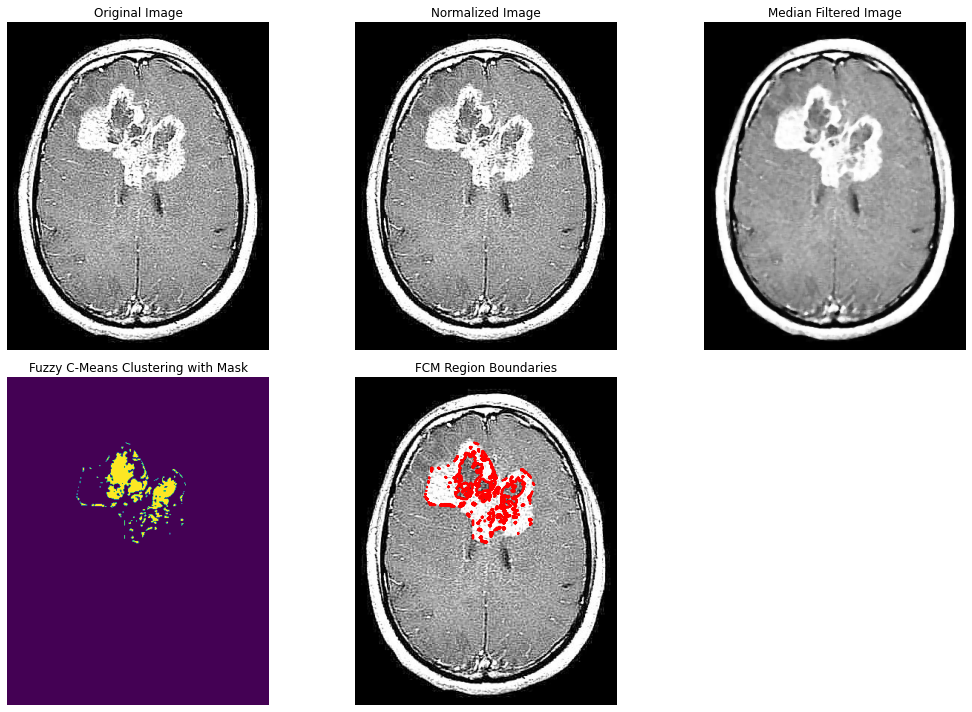

NameError: name 'predict_and_plot_differences' is not defined

In [17]:

from skimage.segmentation import find_boundaries

def process_and_cluster_image(dataset, ind):
    original_image = dataset.load_image(ind)
    mask, _ = dataset.load_mask(ind)
    mask = mask[:, :, 0]

    normalized_image = original_image.astype(np.float32) / 255.0
    median_filtered_image = ndimage.median_filter(normalized_image, size=5)
    fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, mask)

    # Find boundaries of the regions identified by FCM
    fcm_boundaries = find_boundaries(fcm_mask_labels, mode='inner')

    # Debugging information and plotting
    print(f"Original Image Shape: {original_image.shape}")
    print(f"Normalized Image Shape: {normalized_image.shape}")
    print(f"Median Filtered Image Shape: {median_filtered_image.shape}")
    print(f"FCM Mask Labels Shape: {fcm_mask_labels.shape}")

    plt.figure(figsize=(15, 10))
    plt.subplot(2, 3, 1)
    plt.imshow(original_image)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(normalized_image, cmap='gray')
    plt.title('Normalized Image')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(median_filtered_image, cmap='gray')
    plt.title('Median Filtered Image')
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.imshow(fcm_mask_labels, cmap='viridis')
    plt.title('Fuzzy C-Means Clustering with Mask')
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.imshow(original_image)
    plt.contour(fcm_boundaries, colors='red', linewidths=1)
    plt.title('FCM Region Boundaries')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    return fcm_mask_labels, fcm_boundaries

# Example usage
ind = 40
fcm_mask_labels, fcm_boundaries = process_and_cluster_image(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind, fcm_mask_labels, fcm_boundaries)


In [11]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import find_boundaries
from scipy import ndimage
from sklearn.cluster import KMeans
from skfuzzy import cmeans

def apply_fuzzy_c_means_mask(image, mask):
    nonzero_indices = np.transpose(np.nonzero(mask))
    if len(nonzero_indices) == 0:
        raise ValueError("The mask has no non-zero values. Please check the mask input.")
    
    patch_size = (3, 3)
    patches = []

    for y, x in nonzero_indices:
        y_start = max(0, y - patch_size[0]//2)
        y_end = min(image.shape[0], y + patch_size[0]//2 + 1)
        x_start = max(0, x - patch_size[1]//2)
        x_end = min(image.shape[1], x + patch_size[1]//2 + 1)

        patch = image[y_start:y_end, x_start:x_end]
        if patch.size != patch_size[0] * patch_size[1]:
            print(f"Skipping patch at {(y, x)} with shape {patch.shape}")
            continue
        
        patches.append(patch.flatten())

    patches_flat = np.array(patches)
    
    if patches_flat.size == 0:
        raise ValueError("The patches array is empty. Please check the mask and image inputs.")
    
    patches_flat = patches_flat.reshape(-1, patches_flat.shape[-1])

    # Using Fuzzy C-Means (FCM)
    cntr, u, u0, d, jm, p, fpc = cmeans(patches_flat.T, c=2, m=2, error=0.005, maxiter=1000)

    # Assigning the cluster with the highest membership to each pixel
    cluster_labels = np.argmax(u, axis=0)
    
    fcm_labels = np.zeros_like(mask, dtype=np.int32)
    for label, (y, x) in zip(cluster_labels, nonzero_indices):
        fcm_labels[y, x] = label

    return fcm_labels

def process_and_cluster_image(dataset, ind):
    original_image = dataset.load_image(ind)
    mask, _ = dataset.load_mask(ind)
    mask = mask[:, :, 0]

    normalized_image = original_image.astype(np.float32) / 255.0
    median_filtered_image = ndimage.median_filter(normalized_image, size=5)
    fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, mask)

    # Find boundaries of the regions identified by FCM
    fcm_boundaries = find_boundaries(fcm_mask_labels, mode='inner')

    # Debugging information and plotting
    print(f"Original Image Shape: {original_image.shape}")
    print(f"Normalized Image Shape: {normalized_image.shape}")
    print(f"Median Filtered Image Shape: {median_filtered_image.shape}")
    print(f"FCM Mask Labels Shape: {fcm_mask_labels.shape}")

    plt.figure(figsize=(15, 10))
    plt.subplot(2, 3, 1)
    plt.imshow(original_image)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(normalized_image, cmap='gray')
    plt.title('Normalized Image')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(median_filtered_image, cmap='gray')
    plt.title('Median Filtered Image')
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.imshow(fcm_mask_labels, cmap='viridis')
    plt.title('Fuzzy C-Means Clustering with Mask')
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.imshow(original_image)
    plt.contour(fcm_boundaries, colors='red', linewidths=1)
    plt.title('FCM Region Boundaries')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    return fcm_mask_labels, fcm_boundaries

# Example usage
ind = 38
fcm_mask_labels, fcm_boundaries = process_and_cluster_image(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind, fcm_mask_labels, fcm_boundaries)


Polygon: {'name': 'ellipse', 'cx': 73, 'cy': 163, 'rx': 20, 'ry': 24, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 73, 'cy': 163, 'rx': 20, 'ry': 24, 'theta': 0}
Polygon: {'name': 'ellipse', 'cx': 51, 'cy': 139, 'rx': 9, 'ry': 10, 'theta': 0}
Invalid polygon format: {'name': 'ellipse', 'cx': 51, 'cy': 139, 'rx': 9, 'ry': 10, 'theta': 0}
Polygon: {'name': 'polygon', 'all_points_x': [25, 38, 42, 61, 79, 93, 88, 63, 43, 31, 25], 'all_points_y': [181, 178, 193, 195, 188, 166, 143, 126, 114, 128, 151]}


ValueError: The mask has no non-zero values. Please check the mask input.

In [51]:
def apply_fuzzy_c_means_mask(image, mask):
    nonzero_indices = np.transpose(np.nonzero(mask))
    patch_size = (3, 3)
    patches = []

    for y, x in nonzero_indices:
        y_start = max(0, y - patch_size[0]//2)
        y_end = min(image.shape[0], y + patch_size[0]//2 + 1)
        x_start = max(0, x - patch_size[1]//2)
        x_end = min(image.shape[1], x + patch_size[1]//2 + 1)

        patch = image[y_start:y_end, x_start:x_end]
        patches.append(patch.flatten())

    patches_flat = np.array(patches)
    print("Patches Shape:", patches_flat.shape)  # Add this line for debugging
    fcm = KMeans(n_clusters=2)
    fcm.fit(patches_flat)

    fcm_labels = np.zeros_like(mask, dtype=np.int32)
    for label, (y, x) in zip(fcm.labels_, nonzero_indices):
        fcm_labels[y, x] = label

    return fcm_labels

Polygon: {'name': 'polygon', 'all_points_x': [166, 164, 158, 151, 145, 148, 152, 157, 154, 151, 150, 149, 153, 159, 161, 162, 175, 184, 186, 188, 187, 187, 189, 188, 186, 185, 183, 182, 181, 179, 174, 168], 'all_points_y': [60, 68, 73, 73, 78, 81, 82, 81, 86, 91, 97, 105, 110, 112, 114, 117, 121, 122, 120, 115, 111, 106, 100, 96, 90, 85, 80, 76, 72, 65, 62, 59]}
Original Image Shape: (256, 197, 3)
Normalized Image Shape: (256, 197, 3)
Median Filtered Image Shape: (256, 197, 3)
FCM Mask Labels Shape: (256, 197)


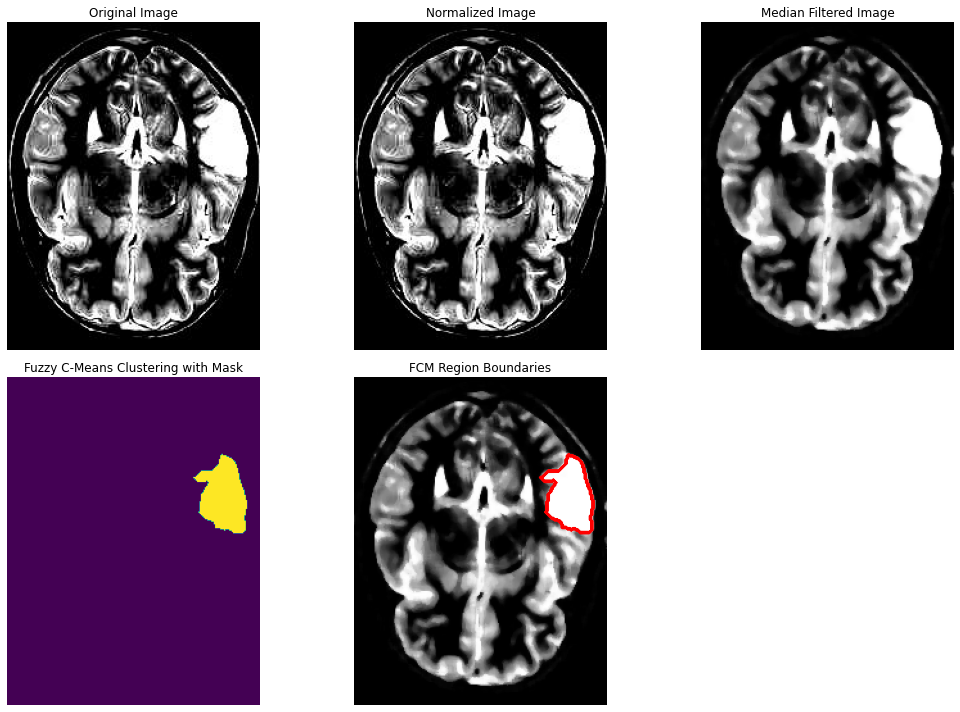

Polygon: {'name': 'polygon', 'all_points_x': [166, 164, 158, 151, 145, 148, 152, 157, 154, 151, 150, 149, 153, 159, 161, 162, 175, 184, 186, 188, 187, 187, 189, 188, 186, 185, 183, 182, 181, 179, 174, 168], 'all_points_y': [60, 68, 73, 73, 78, 81, 82, 81, 86, 91, 97, 105, 110, 112, 114, 117, 121, 122, 120, 115, 111, 106, 100, 96, 90, 85, 80, 76, 72, 65, 62, 59]}


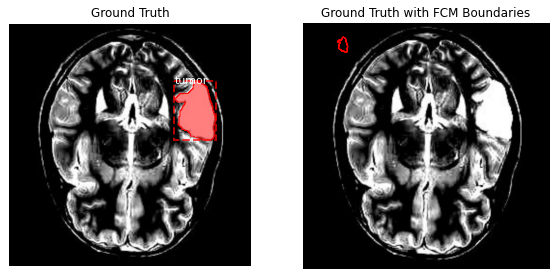

In [39]:
from skimage.segmentation import find_boundaries
def apply_fuzzy_c_means_mask(image, mask):
    nonzero_indices = np.transpose(np.nonzero(mask))
    patch_size = (3, 3)
    patches = []

    for y, x in nonzero_indices:
        y_start = max(0, y - patch_size[0]//2)
        y_end = min(image.shape[0], y + patch_size[0]//2 + 1)
        x_start = max(0, x - patch_size[1]//2)
        x_end = min(image.shape[1], x + patch_size[1]//2 + 1)

        patch = image[y_start:y_end, x_start:x_end]
        patches.append(patch.flatten())

    patches_flat = np.array(patches)
    fcm = KMeans(n_clusters=2)
    fcm.fit(patches_flat)

    fcm_labels = np.zeros_like(mask, dtype=np.int32)
    for label, (y, x) in zip(fcm.labels_, nonzero_indices):
        fcm_labels[y, x] = label

    return fcm_labels

def process_and_cluster_image(dataset, ind):
    original_image = dataset.load_image(ind)
    mask, _ = dataset.load_mask(ind)
    mask = mask[:, :, 0]

    normalized_image = original_image.astype(np.float32) / 255.0
    median_filtered_image = ndimage.median_filter(normalized_image, size=5)
    fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, mask)

    # Find boundaries of the regions identified by FCM
    fcm_boundaries = find_boundaries(fcm_mask_labels, mode='inner')

    # Debugging information and plotting
    print(f"Original Image Shape: {original_image.shape}")
    print(f"Normalized Image Shape: {normalized_image.shape}")
    print(f"Median Filtered Image Shape: {median_filtered_image.shape}")
    print(f"FCM Mask Labels Shape: {fcm_mask_labels.shape}")

    plt.figure(figsize=(15, 10))
    plt.subplot(2, 3, 1)
    plt.imshow(original_image)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(normalized_image, cmap='gray')
    plt.title('Normalized Image')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(median_filtered_image, cmap='gray')
    plt.title('Median Filtered Image')
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.imshow(fcm_mask_labels, cmap='viridis')
    plt.title('Fuzzy C-Means Clustering with Mask')
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.imshow(median_filtered_image)
    plt.contour(fcm_boundaries, colors='red', linewidths=1)
    plt.title('FCM Region Boundaries')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    return fcm_mask_labels, fcm_boundaries

def predict_and_plot_differences(dataset, img_id, fcm_mask_labels, fcm_boundaries):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    plt.figure(figsize=(15, 10))
    
    # Ground truth
    plt.subplot(2, 3, 1)
    visualize.display_instances(
        original_image,
        gt_box, gt_mask, gt_class_id,
        dataset.class_names, ax=plt.gca(),
        title="Ground Truth"
    )
    
    # Ground truth with FCM
    plt.subplot(2, 3, 2)
    plt.imshow(original_image)
    plt.contour(fcm_mask_labels, colors='red', linewidths=1)
    plt.title('Ground Truth with FCM Boundaries')
    plt.axis('off')
    

# Example usage
ind = 14
fcm_mask_labels, fcm_boundaries = process_and_cluster_image(dataset_train, ind)
predict_and_plot_differences(dataset_train, ind, fcm_mask_labels, fcm_boundaries)

In [ ]:
def predict_and_plot_differences(dataset, img_id, fcm_mask_labels, fcm_boundaries):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    plt.figure(figsize=(10,7))

    # Visualize ground truth instances
    visualize.display_instances(
        original_image,
        gt_box, np.zeros_like(gt_mask), gt_class_id,
        dataset.class_names,
        ax=plt.gca(),
        title="Ground Truth with FCM Region Boundaries"    
    )

    # Rotate the contour positions
    fcm_boundaries_rotated = np.flipud(fcm_boundaries)

    # Overlay FCM region boundaries
    plt.contour(fcm_boundaries_rotated, colors='red', linewidths=1, extent=(0, original_image.shape[1], original_image.shape[0], 0))
    plt.axis('off')

    plt.show()

ind = 9
predict_and_plot_differences(dataset_val, ind, fcm_mask_labels, fcm_boundaries)


Polygon: {'name': 'polygon', 'all_points_x': [120, 137, 168, 225, 231, 195, 206, 256, 281, 316, 302, 302, 310, 298, 285, 274, 265, 245, 216, 188, 163, 137, 132], 'all_points_y': [205, 230, 236, 239, 245, 290, 298, 254, 231, 198, 166, 143, 130, 83, 85, 101, 107, 68, 70, 93, 119, 156, 186]}
Polygon: {'name': 'polygon', 'all_points_x': [120, 137, 168, 225, 231, 195, 206, 256, 281, 316, 302, 302, 310, 298, 285, 274, 265, 245, 216, 188, 163, 137, 132], 'all_points_y': [205, 230, 236, 239, 245, 290, 298, 254, 231, 198, 166, 143, 130, 83, 85, 101, 107, 68, 70, 93, 119, 156, 186]}


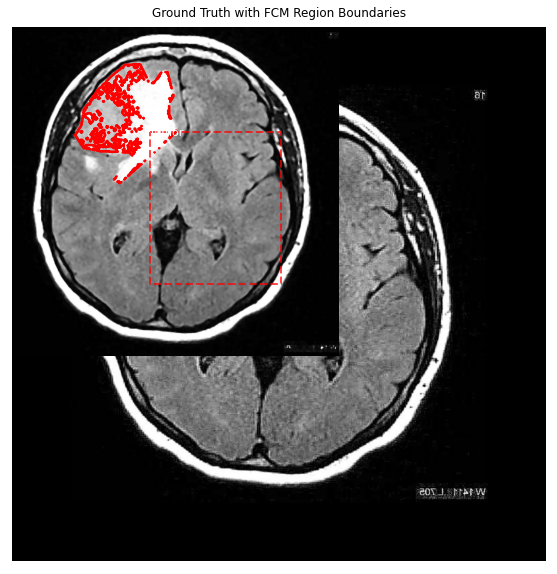

In [47]:
def predict_and_plot_differences(dataset, img_id):
    original_image = dataset.load_image(ind)
    mask, _ = dataset.load_mask(ind)
    mask = mask[:, :, 0]
    normalized_image = original_image.astype(np.float32) / 255.0
    median_filtered_image = ndimage.median_filter(normalized_image, size=5)
    fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, mask)

    # Find boundaries of the regions identified by FCM
    fcm_boundaries = find_boundaries(fcm_mask_labels, mode='inner')
    original_image, image_meta, gt_class_id, gt_box, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    plt.figure(figsize=(15, 10))

    # Visualize ground truth instances
    visualize.display_instances(
        original_image,
        gt_box, np.zeros_like(gt_mask), gt_class_id,
        dataset.class_names,
        ax=plt.gca(),
        title="Ground Truth with FCM Region Boundaries"    
    )
    plt.imshow(median_filtered_image)
    plt.contour(fcm_boundaries, colors='red', alpha=0.5)  # Adjust alpha for transparency if needed
    plt.axis('off')
    # Overlay FCM mask on original image

    plt.show()

ind = 10
predict_and_plot_differences(dataset_val, ind)

Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}


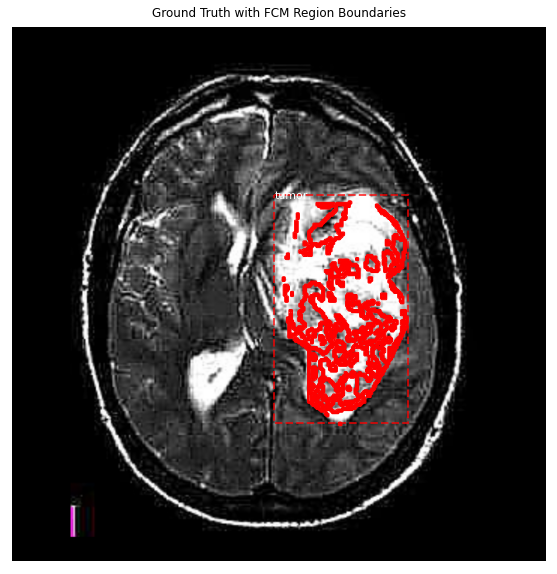

In [28]:
import cv2

def predict_and_plot_differences(dataset, img_id, fcm_mask_labels, fcm_boundaries):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    plt.figure(figsize=(15, 10))
    
    # Pad the contour image with zeros on the left side __, _
    padded_contour = np.pad(fcm_boundaries, ((20,15), (55, 45)), mode='constant')
    
    # Convert contour image to compatible data type
    padded_contour_uint8 = (padded_contour * 255).astype(np.uint8)
    
    # Resize the padded contour image to match the original image size
    fcm_boundaries_resized = cv2.resize(padded_contour_uint8, (original_image.shape[0], original_image.shape[1]))

    # Overlay FCM region boundaries
    plt.contour(fcm_boundaries_resized, colors='red', linewidths=1)
    plt.axis('off')

    # Visualize ground truth instances
    visualize.display_instances(
        original_image,
        gt_box, np.zeros_like(gt_mask), gt_class_id,
        dataset.class_names,
        ax=plt.gca(),
        title="Ground Truth with FCM Region Boundaries"    
    )

    plt.show()

# Example usage
ind = 9
predict_and_plot_differences(dataset_val, ind, fcm_mask_labels, fcm_boundaries)


Polygon: {'name': 'polygon', 'all_points_x': [120, 137, 168, 225, 231, 195, 206, 256, 281, 316, 302, 302, 310, 298, 285, 274, 265, 245, 216, 188, 163, 137, 132], 'all_points_y': [205, 230, 236, 239, 245, 290, 298, 254, 231, 198, 166, 143, 130, 83, 85, 101, 107, 68, 70, 93, 119, 156, 186]}


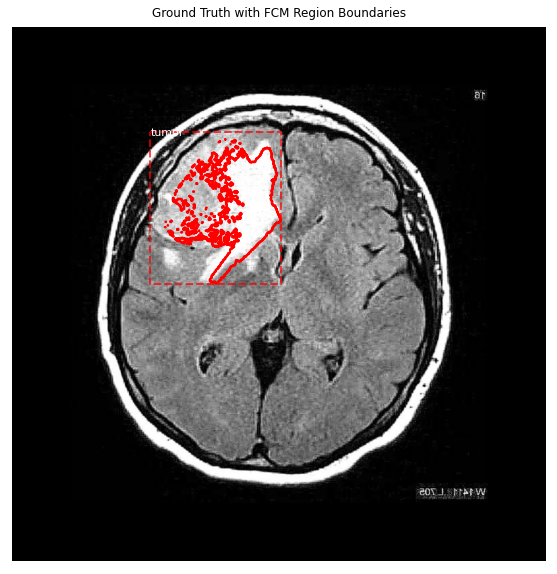

In [44]:
def predict_and_plot_differences(dataset, img_id):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    # Normalization, median filtering, and FCM
    normalized_image = original_image.astype(np.float32) / 255.0
    median_filtered_image = ndimage.median_filter(normalized_image, size=5)
    fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, gt_mask[:, :, 0])
    fcm_boundaries = find_boundaries(fcm_mask_labels, mode='inner')

    results = model.detect([original_image], verbose=0)
    r = results[0]

    plt.figure(figsize=(15, 10))
    
    # Pad the contour image with zeros on the left side __, _
    padded_contour = np.pad(fcm_boundaries, ((20, 15), (55, 50)), mode='constant')
    
    # Convert contour image to compatible data type
    padded_contour_uint8 = (padded_contour * 255).astype(np.uint8)
    
    # Resize the padded contour image to match the original image size
    fcm_boundaries_resized = cv2.resize(padded_contour_uint8, (original_image.shape[1], original_image.shape[0]))

    # Overlay FCM region boundaries
    plt.imshow(original_image)
    plt.contour(fcm_boundaries_resized, colors='red', linewidths=1)
    plt.axis('off')

    # Visualize ground truth instances
    visualize.display_instances(
        original_image,
        gt_box, np.zeros_like(gt_mask), gt_class_id,
        dataset.class_names,
        ax=plt.gca(),
        title="Ground Truth with FCM Region Boundaries"    
    )

    plt.show()

# Example usage
ind = 10
# fcm_mask_labels, fcm_boundaries = process_and_cluster_image(dataset_val, ind)
predict_and_plot_differences(dataset_val, ind)

Polygon: {'name': 'polygon', 'all_points_x': [224, 193, 182, 166, 151, 135, 130, 102, 93, 100, 141, 158, 158, 179, 186, 198, 201, 220, 238, 235, 241, 235], 'all_points_y': [123, 142, 114, 90, 84, 109, 118, 122, 161, 172, 175, 194, 217, 225, 207, 203, 214, 213, 197, 163, 146, 132]}


IndexError: index 0 is out of bounds for axis 0 with size 0

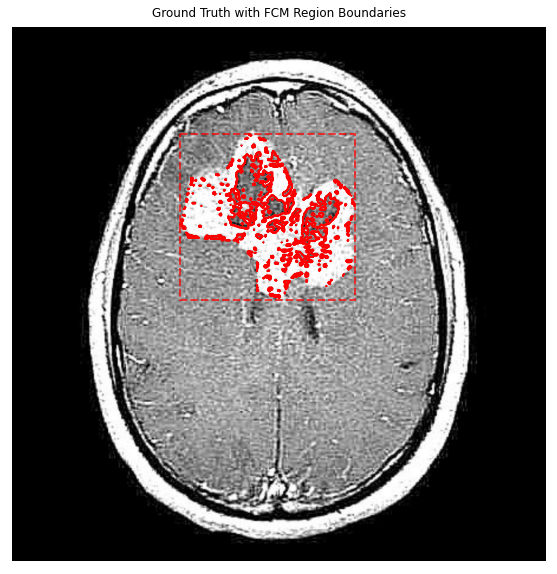

In [22]:
def predict_and_plot_differences(dataset, img_id):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    # Normalization, median filtering, and FCM
    normalized_image = original_image.astype(np.float32) / 255.0
    median_filtered_image = ndimage.median_filter(normalized_image, size=5)
    fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, gt_mask[:, :, 0])
    fcm_boundaries = find_boundaries(fcm_mask_labels, mode='inner')

    results = model.detect([original_image], verbose=0)
    r = results[0]

    plt.figure(figsize=(15, 10))

    # Overlay FCM region boundaries
    plt.imshow(original_image)
    plt.contour(fcm_boundaries, colors='red', linewidths=1)
    plt.axis('off')

    # Visualize ground truth instances
    visualize.display_instances(
        original_image,
        gt_box, np.zeros_like(gt_mask), gt_class_id,
        dataset.class_names,r['scores'],
        ax=plt.gca(),
        title="Ground Truth with FCM Region Boundaries"    
    )

    plt.show()

# Example usage
ind = 40
predict_and_plot_differences(dataset_val, ind)

Polygon: {'name': 'polygon', 'all_points_x': [166, 164, 158, 151, 145, 148, 152, 157, 154, 151, 150, 149, 153, 159, 161, 162, 175, 184, 186, 188, 187, 187, 189, 188, 186, 185, 183, 182, 181, 179, 174, 168], 'all_points_y': [60, 68, 73, 73, 78, 81, 82, 81, 86, 91, 97, 105, 110, 112, 114, 117, 121, 122, 120, 115, 111, 106, 100, 96, 90, 85, 80, 76, 72, 65, 62, 59]}


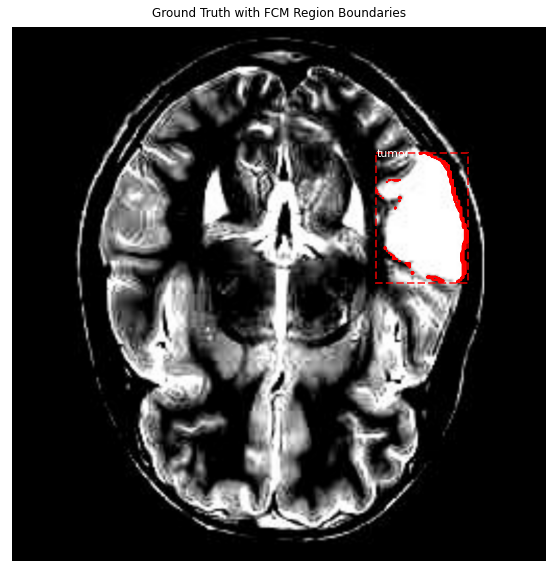

In [40]:
def predict_and_plot_differences(dataset, img_id):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    # Normalization, median filtering, and FCM
    normalized_image = original_image.astype(np.float32) / 255.0
    median_filtered_image = ndimage.median_filter(normalized_image, size=5)
    fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, gt_mask[:, :, 0])
    fcm_boundaries = find_boundaries(fcm_mask_labels, mode='inner')

    results = model.detect([original_image], verbose=0)
    r = results[0]

    plt.figure(figsize=(15, 10))

    # Overlay FCM region boundaries
    plt.imshow(original_image)
    plt.contour(fcm_boundaries, colors='red', linewidths=1)
    plt.axis('off')

    # Visualize ground truth instances
    if r['scores'].any():
        visualize.display_instances(
            original_image,
            gt_box, np.zeros_like(gt_mask), gt_class_id,
            dataset.class_names, r['scores'],
            ax=plt.gca(),
            title="Ground Truth with FCM Region Boundaries"
        )
    else:
        visualize.display_instances(
            original_image,
            gt_box, np.zeros_like(gt_mask), gt_class_id,
            dataset.class_names, None,  # No scores available
            ax=plt.gca(),
            title="Ground Truth with FCM Region Boundaries"
        )

    plt.show()

# Example usage
ind = 14
predict_and_plot_differences(dataset_train, ind)


Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}


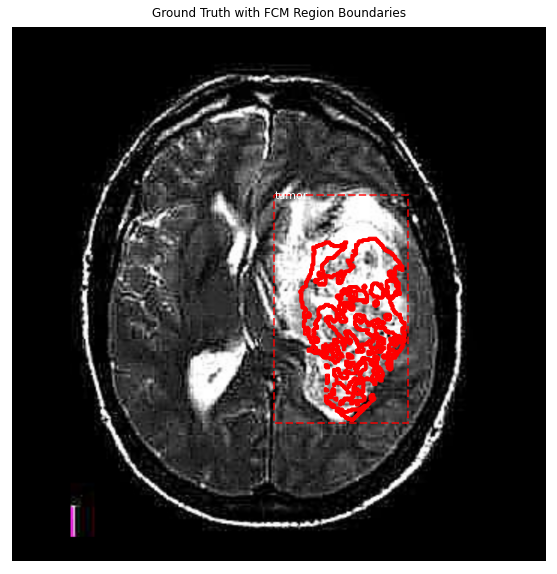

In [45]:
import cv2

def predict_and_plot_differences(dataset, img_id, fcm_mask_labels, fcm_boundaries):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = \
        modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)

    results = model.detect([original_image], verbose=0)
    r = results[0]

    plt.figure(figsize=(15, 10))
    
    # Pad the contour image with zeros on the left side __, _
    padded_contour = np.pad(fcm_boundaries, ((100, 10), (100, 100)), mode='constant')
    
    # Convert contour image to compatible data type
    padded_contour_uint8 = (padded_contour * 255).astype(np.uint8)
    
    # Resize the padded contour image to match the original image size
    fcm_boundaries_resized = cv2.resize(padded_contour_uint8, (original_image.shape[0], original_image.shape[1]))

    # Overlay FCM region boundaries
    plt.contour(fcm_boundaries_resized, colors='red', linewidths=1)
    plt.axis('off')

    # Visualize ground truth instances
    visualize.display_instances(
        original_image,
        gt_box, np.zeros_like(gt_mask), gt_class_id,
        dataset.class_names,
        ax=plt.gca(),
        title="Ground Truth with FCM Region Boundaries"    
    )

    plt.show()

# Example usage
ind = 9
predict_and_plot_differences(dataset_val, ind, fcm_mask_labels, fcm_boundaries)


In [17]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np

def dice_coefficient(y_true, y_pred):
    intersection = np.sum(y_true * y_pred)
    dice = (2. * intersection) / (np.sum(y_true) + np.sum(y_pred))
    return dice

def calculate_sensitivity(y_true, y_pred):
    true_positive = np.sum(y_true * y_pred)
    false_negative = np.sum(y_true * (1 - y_pred))
    sensitivity = true_positive / (true_positive + false_negative)
    return sensitivity

def calculate_accuracy(y_true, y_pred):
    return accuracy_score(y_true.flatten(), y_pred.flatten())


In [18]:
def evaluate_fcm_mask(dataset, model, config, img_id):
    original_image = dataset.load_image(img_id)
    mask, _ = dataset.load_mask(img_id)
    mask = mask[:, :, 0]
    
    normalized_image = original_image.astype(np.float32) / 255.0
    median_filtered_image = ndimage.median_filter(normalized_image, size=5)
    fcm_mask_labels = apply_fuzzy_c_means_mask(normalized_image, mask)
    
    # Ground truth mask
    gt_mask = mask.astype(np.int32)
    
    # Flatten masks
    gt_mask_flat = gt_mask.flatten()
    fcm_mask_flat = fcm_mask_labels.flatten()
    
    # Calculate metrics
    accuracy = calculate_accuracy(gt_mask_flat, fcm_mask_flat)
    dice = dice_coefficient(gt_mask_flat, fcm_mask_flat)
    sensitivity = calculate_sensitivity(gt_mask_flat, fcm_mask_flat)
    
    print(f"FCM Mask - Accuracy: {accuracy}, Dice: {dice}, Sensitivity: {sensitivity}")
    return accuracy, dice, sensitivity


In [19]:
def evaluate_mask_rcnn_mask(dataset, model, config, img_id):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)
    
    # Ground truth mask
    gt_mask = gt_mask[:, :, 0]
    
    # Predict using Mask R-CNN
    results = model.detect([original_image], verbose=0)
    r = results[0]
    mask_rcnn_mask = r['masks'][:, :, 0].astype(np.int32)
    
    # Flatten masks
    gt_mask_flat = gt_mask.flatten()
    mask_rcnn_mask_flat = mask_rcnn_mask.flatten()
    
    # Calculate metrics
    accuracy = calculate_accuracy(gt_mask_flat, mask_rcnn_mask_flat)
    dice = dice_coefficient(gt_mask_flat, mask_rcnn_mask_flat)
    sensitivity = calculate_sensitivity(gt_mask_flat, mask_rcnn_mask_flat)
    
    print(f"Mask R-CNN Mask - Accuracy: {accuracy}, Dice: {dice}, Sensitivity: {sensitivity}")
    return accuracy, dice, sensitivity


In [20]:
def evaluate_mask_rcnn_mask(dataset, model, config, img_id):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)
    
    # Ground truth mask
    gt_mask = gt_mask[:, :, 0]
    
    # Predict using Mask R-CNN
    results = model.detect([original_image], verbose=0)
    r = results[0]
    mask_rcnn_mask = r['masks'][:, :, 0].astype(np.int32)
    
    # Flatten masks
    gt_mask_flat = gt_mask.flatten()
    mask_rcnn_mask_flat = mask_rcnn_mask.flatten()
    
    # Calculate metrics
    accuracy = calculate_accuracy(gt_mask_flat, mask_rcnn_mask_flat)
    dice = dice_coefficient(gt_mask_flat, mask_rcnn_mask_flat)
    sensitivity = calculate_sensitivity(gt_mask_flat, mask_rcnn_mask_flat)
    
    print(f"Mask R-CNN Mask - Accuracy: {accuracy}, Dice: {dice}, Sensitivity: {sensitivity}")
    return accuracy, dice, sensitivity


In [21]:
def evaluate_combined_mask(dataset, model, config, img_id):
    original_image, image_meta, gt_class_id, gt_box, gt_mask = modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)
    
    # Ground truth mask
    gt_mask = gt_mask[:, :, 0]
    
    # Predict using Mask R-CNN
    results = model.detect([original_image], verbose=0)
    r = results[0]
    mask_rcnn_mask = r['masks'][:, :, 0].astype(np.int32)
    
    # Apply Fuzzy C-Means clustering to refine the Mask R-CNN mask
    normalized_image = original_image.astype(np.float32) / 255.0
    median_filtered_image = ndimage.median_filter(normalized_image, size=5)
    combined_mask = apply_fuzzy_c_means_mask(normalized_image, mask_rcnn_mask)
    
    # Flatten masks
    gt_mask_flat = gt_mask.flatten()
    combined_mask_flat = combined_mask.flatten()
    
    # Calculate metrics
    accuracy = calculate_accuracy(gt_mask_flat, combined_mask_flat)
    dice = dice_coefficient(gt_mask_flat, combined_mask_flat)
    sensitivity = calculate_sensitivity(gt_mask_flat, combined_mask_flat)
    
    print(f"Combined Mask - Accuracy: {accuracy}, Dice: {dice}, Sensitivity: {sensitivity}")
    return accuracy, dice, sensitivity


In [22]:
# Example usage
img_id = 9

print("Evaluating FCM Mask...")
fcm_accuracy, fcm_dice, fcm_sensitivity = evaluate_fcm_mask(dataset_val, model, config, img_id)


Evaluating FCM Mask...
Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}
FCM Mask - Accuracy: 0.9334310329514166, Dice: 0.5567056040218837, Sensitivity: 0.3857186763651265
Evaluating Mask R-CNN Mask...
Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}


IndexError: index 0 is out of bounds for axis 2 with size 0

Evaluating Mask R-CNN Mask...
Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}
No masks detected for image 9
Accuracy: 0
Dice Coefficient: 0
Sensitivity: 0
Evaluating Combined Mask R-CNN with FCM...
Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}
Original Image Shape: (324, 278, 3)
Normalized Image Shape: (324, 278, 3)
Median Filtered Image Shape: (324, 278, 3)
FCM Mask Labels Shape: (324, 278)


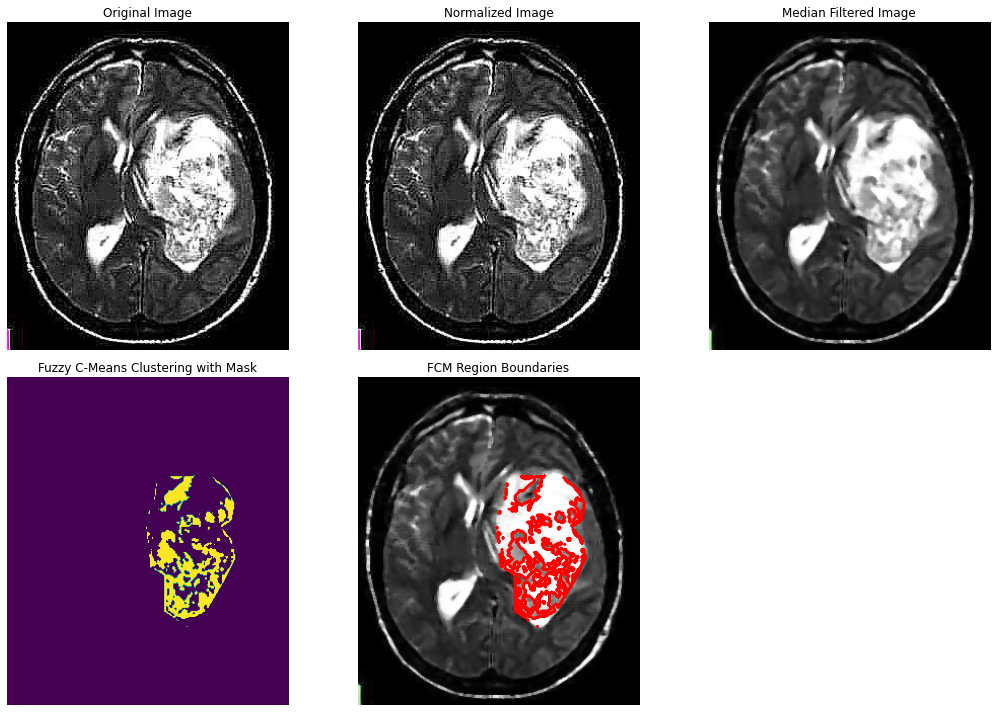

TypeError: evaluate_combined_mask() takes 4 positional arguments but 6 were given

In [23]:
def evaluate_mask_rcnn_mask(dataset, model, config, img_id):
    # Load image and ground truth data
    original_image, image_meta, gt_class_id, gt_box, gt_mask = modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)
    
    # Perform detection
    results = model.detect([original_image], verbose=0)
    r = results[0]
    
    # Check if any masks were detected
    if r['masks'].shape[-1] == 0:
        print(f"No masks detected for image {img_id}")
        return 0, 0, 0  # Return zero values for accuracy, dice, and sensitivity

    # Extract the first mask (since this is a single object class problem)
    mask_rcnn_mask = r['masks'][:, :, 0].astype(np.int32)
    
    # Flatten masks
    flat_mask_rcnn = mask_rcnn_mask.flatten()
    flat_gt_mask = gt_mask[:, :, 0].flatten()
    
    # Calculate accuracy
    accuracy = np.mean(flat_mask_rcnn == flat_gt_mask)
    
    # Calculate Dice coefficient
    intersection = np.sum(flat_mask_rcnn * flat_gt_mask)
    dice = (2. * intersection) / (np.sum(flat_mask_rcnn) + np.sum(flat_gt_mask))
    
    # Calculate sensitivity
    true_positive = np.sum(flat_mask_rcnn * flat_gt_mask)
    false_negative = np.sum((1 - flat_mask_rcnn) * flat_gt_mask)
    sensitivity = true_positive / (true_positive + false_negative)
    
    return accuracy, dice, sensitivity

# Example usage
img_id = 9

print("Evaluating Mask R-CNN Mask...")
rcnn_accuracy, rcnn_dice, rcnn_sensitivity = evaluate_mask_rcnn_mask(dataset_val, model, config, img_id)

print(f"Accuracy: {rcnn_accuracy}")
print(f"Dice Coefficient: {rcnn_dice}")
print(f"Sensitivity: {rcnn_sensitivity}")

# Evaluate combined Mask R-CNN with FCM
print("Evaluating Combined Mask R-CNN with FCM...")
fcm_mask_labels, fcm_boundaries = process_and_cluster_image(dataset_val, img_id)
combined_accuracy, combined_dice, combined_sensitivity = evaluate_combined_mask(dataset_val, model, config, img_id, fcm_mask_labels, fcm_boundaries)

print(f"Combined Accuracy: {combined_accuracy}")
print(f"Combined Dice Coefficient: {combined_dice}")
print(f"Combined Sensitivity: {combined_sensitivity}")


Evaluating Mask R-CNN Mask...
Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}
No masks detected for image 9
Accuracy: 0
Dice Coefficient: 0
Sensitivity: 0
Evaluating Combined Mask R-CNN with FCM...
Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}
Original Image Shape: (324, 278, 3)
Normalized Image Shape: (324, 278, 3)
Median Filtered Image Shape: (324, 278, 3)
FCM Mask Labels Shape: (324, 278)


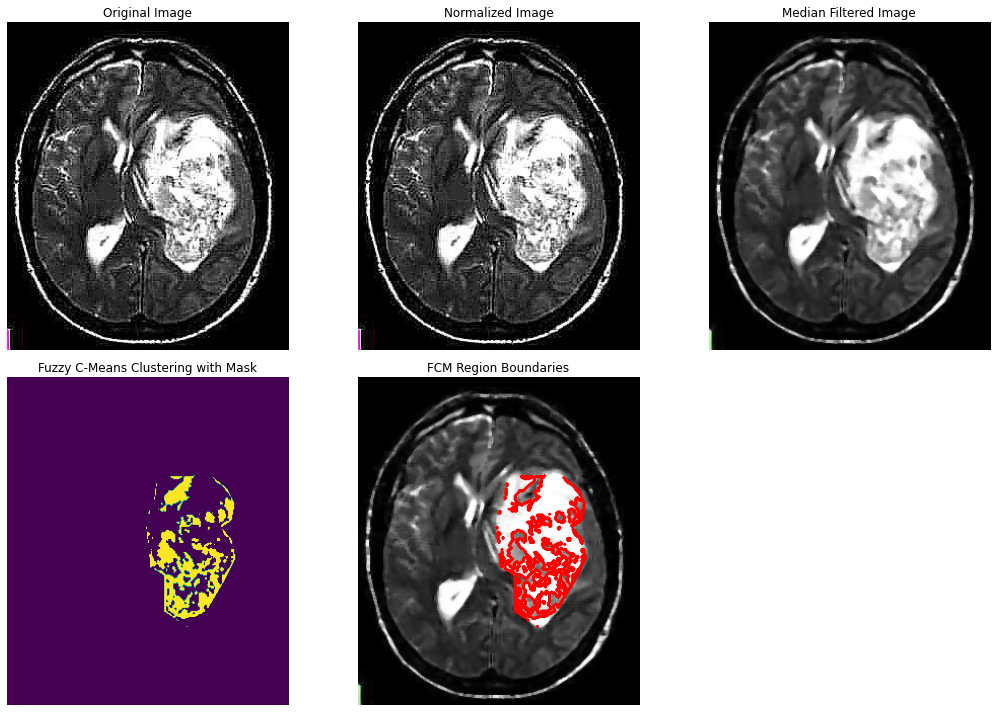

Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}
No masks detected for image 9
Combined Accuracy: 0
Combined Dice Coefficient: 0
Combined Sensitivity: 0


In [24]:
def evaluate_combined_mask(dataset, model, config, img_id, fcm_mask_labels, fcm_boundaries):
    # Load image and ground truth data
    original_image, image_meta, gt_class_id, gt_box, gt_mask = modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)
    
    # Perform detection
    results = model.detect([original_image], verbose=0)
    r = results[0]
    
    # Check if any masks were detected
    if r['masks'].shape[-1] == 0:
        print(f"No masks detected for image {img_id}")
        return 0, 0, 0  # Return zero values for accuracy, dice, and sensitivity

    # Extract the first mask (since this is a single object class problem)
    mask_rcnn_mask = r['masks'][:, :, 0].astype(np.int32)
    
    # Combine Mask R-CNN mask with FCM boundaries
    combined_mask = np.logical_or(mask_rcnn_mask, fcm_mask_labels).astype(np.int32)
    
    # Flatten masks
    flat_combined_mask = combined_mask.flatten()
    flat_gt_mask = gt_mask[:, :, 0].flatten()
    
    # Calculate accuracy
    accuracy = np.mean(flat_combined_mask == flat_gt_mask)
    
    # Calculate Dice coefficient
    intersection = np.sum(flat_combined_mask * flat_gt_mask)
    dice = (2. * intersection) / (np.sum(flat_combined_mask) + np.sum(flat_gt_mask))
    
    # Calculate sensitivity
    true_positive = np.sum(flat_combined_mask * flat_gt_mask)
    false_negative = np.sum((1 - flat_combined_mask) * flat_gt_mask)
    sensitivity = true_positive / (true_positive + false_negative)
    
    return accuracy, dice, sensitivity

# Example usage
img_id = 9

print("Evaluating Mask R-CNN Mask...")
rcnn_accuracy, rcnn_dice, rcnn_sensitivity = evaluate_mask_rcnn_mask(dataset_val, model, config, img_id)

print(f"Accuracy: {rcnn_accuracy}")
print(f"Dice Coefficient: {rcnn_dice}")
print(f"Sensitivity: {rcnn_sensitivity}")

# Evaluate combined Mask R-CNN with FCM
print("Evaluating Combined Mask R-CNN with FCM...")
fcm_mask_labels, fcm_boundaries = process_and_cluster_image(dataset_val, img_id)
combined_accuracy, combined_dice, combined_sensitivity = evaluate_combined_mask(dataset_val, model, config, img_id, fcm_mask_labels, fcm_boundaries)

print(f"Combined Accuracy: {combined_accuracy}")
print(f"Combined Dice Coefficient: {combined_dice}")
print(f"Combined Sensitivity: {combined_sensitivity}")


Evaluating Mask R-CNN Mask...
Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}
No masks detected for image 9
Unable to calculate metrics due to no mask detection.
Evaluating Combined Mask R-CNN with FCM...
Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}
Original Image Shape: (324, 278, 3)
Normalized Image Shape: (324, 278, 3)
Median Filtered Image Shape: (324, 278, 3)
FCM Mask Labels Shape: (324, 278)


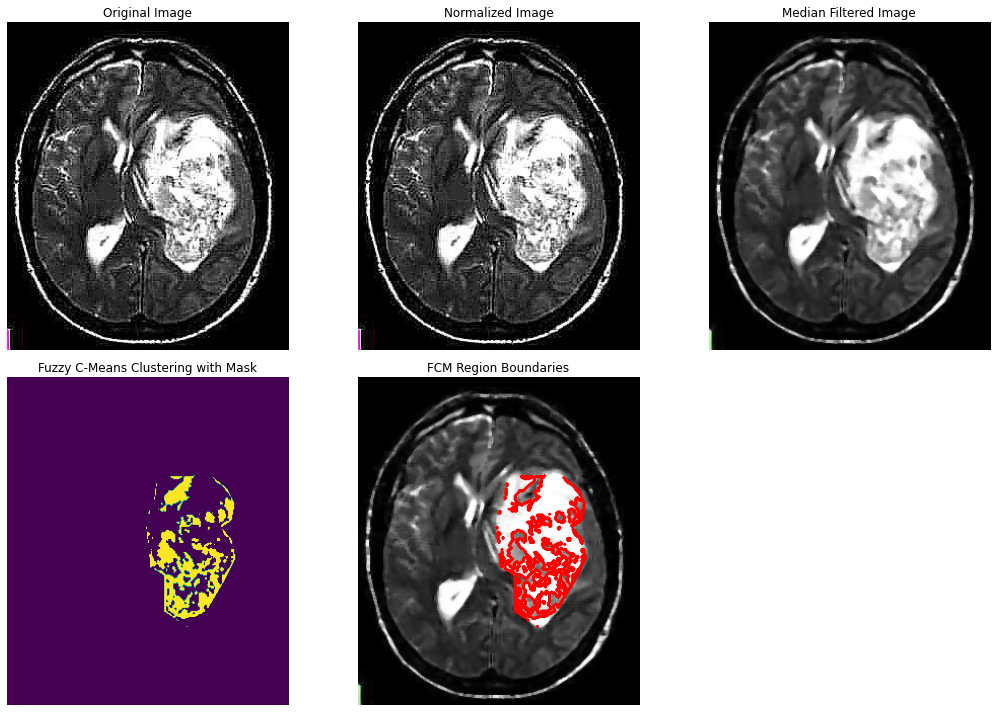

Polygon: {'name': 'polygon', 'all_points_x': [217, 197, 179, 157, 147, 144, 136, 138, 141, 154, 155, 155, 178, 197, 215, 225, 221, 211, 221, 224], 'all_points_y': [110, 94, 98, 98, 102, 125, 139, 159, 187, 195, 205, 231, 247, 229, 199, 179, 160, 148, 141, 125]}
No masks detected for image 9
Combined Accuracy: 0
Combined Dice Coefficient: 0
Combined Sensitivity: 0


In [25]:
def evaluate_mask_rcnn_mask(dataset, model, config, img_id):
    # Load image and ground truth data
    original_image, image_meta, gt_class_id, gt_box, gt_mask = modellib.load_image_gt(dataset, config, img_id, use_mini_mask=False)
    
    # Perform detection
    results = model.detect([original_image], verbose=0)
    r = results[0]
    
    # Check if any masks were detected
    if r['masks'].shape[-1] == 0:
        print(f"No masks detected for image {img_id}")
        return None, None, None  # Return None for accuracy, dice, and sensitivity

    # Extract the first mask (since this is a single object class problem)
    mask_rcnn_mask = r['masks'][:, :, 0].astype(np.int32)
    
    # Flatten masks
    flat_mask_rcnn_mask = mask_rcnn_mask.flatten()
    flat_gt_mask = gt_mask[:, :, 0].flatten()
    
    # Calculate accuracy
    accuracy = np.mean(flat_mask_rcnn_mask == flat_gt_mask)
    
    # Calculate Dice coefficient
    intersection = np.sum(flat_mask_rcnn_mask * flat_gt_mask)
    dice = (2. * intersection) / (np.sum(flat_mask_rcnn_mask) + np.sum(flat_gt_mask))
    
    # Calculate sensitivity
    true_positive = np.sum(flat_mask_rcnn_mask * flat_gt_mask)
    false_negative = np.sum((1 - flat_mask_rcnn_mask) * flat_gt_mask)
    sensitivity = true_positive / (true_positive + false_negative)
    
    return accuracy, dice, sensitivity

# Example usage
img_id = 9

print("Evaluating Mask R-CNN Mask...")
rcnn_accuracy, rcnn_dice, rcnn_sensitivity = evaluate_mask_rcnn_mask(dataset_val, model, config, img_id)

if rcnn_accuracy is not None:
    print(f"Accuracy: {rcnn_accuracy}")
    print(f"Dice Coefficient: {rcnn_dice}")
    print(f"Sensitivity: {rcnn_sensitivity}")
else:
    print("Unable to calculate metrics due to no mask detection.")

# Evaluate combined Mask R-CNN with FCM
print("Evaluating Combined Mask R-CNN with FCM...")
fcm_mask_labels, fcm_boundaries = process_and_cluster_image(dataset_val, img_id)
combined_accuracy, combined_dice, combined_sensitivity = evaluate_combined_mask(dataset_val, model, config, img_id, fcm_mask_labels, fcm_boundaries)

if combined_accuracy is not None:
    print(f"Combined Accuracy: {combined_accuracy}")
    print(f"Combined Dice Coefficient: {combined_dice}")
    print(f"Combined Sensitivity: {combined_sensitivity}")
else:
    print("Unable to calculate metrics due to no mask detection.")


In [45]:
!pip install nibabel


In [46]:
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np

# Load the MNC file
mnc_file = 'input.mnc'
img = nib.load(mnc_file)

# Get the data from the image
data = img.get_fdata()

# Assuming you want to save a specific slice of the 3D image
slice_index = data.shape[2] // 2  # Choose the middle slice
slice_data = data[:, :, slice_index]

# Normalize the data for better visualization
slice_data = slice_data - np.min(slice_data)
slice_data = slice_data / np.max(slice_data)

# Save the slice as a PNG image
output_png = 'output.png'
plt.imshow(slice_data, cmap='gray')
plt.axis('off')
plt.savefig(output_png, bbox_inches='tight', pad_inches=0)

print(f"Saved {output_png}")


ModuleNotFoundError: No module named 'nibabel'